In this assignment, we want to perform clustering and dimension reduction techniques to our dataset. For this assignment, the 2 datasets that are going to be used are the MNIST digit dataset and the heart disease dataset. 

For the neural network portion, we will use the heart disease dataset.

For the clustering algorithms, we will be using k means and expectation maximization algorithm

In [1]:
from sklearn.datasets import load_digits
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_mutual_info_score as ami,silhouette_score,davies_bouldin_score,calinski_harabasz_score,silhouette_samples
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA ,FastICA as ICA
from sklearn.random_projection import SparseRandomProjection as RCA
from collections import defaultdict
from itertools import product
from sklearn.metrics.pairwise import pairwise_distances
import itertools
from sklearn.ensemble import RandomForestClassifier as RFC
from numpy import linalg as LA
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, learning_curve, GridSearchCV,RandomizedSearchCV,StratifiedKFold
from sklearn.metrics import balanced_accuracy_score, f1_score, accuracy_score,classification_report,confusion_matrix, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
import time
import random
import seaborn as sns
import matplotlib.cm as cm
from sklearn.manifold import TSNE

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## Load helper functions

In [3]:
# Define helper functions
def remove_duplicated_columns_reset_index(input_df):
    
    input_df = input_df.loc[:,~input_df.columns.duplicated()].copy()
    input_df = input_df.reset_index(drop=True)
    
    return input_df

def plot_average_results(input_df,ylabel,title):
        input_df['Mean'] = input_df.iloc[:, 1:5].mean(axis=1)
        input_df['Std'] = input_df.iloc[:, 1:5].std(axis=1)
        plt.figure()
        plt.plot(input_df['Cluster'], input_df['Mean'])
        plt.fill_between(input_df['Cluster'], input_df['Mean']+input_df['Std'],input_df['Mean']-input_df['Std'], alpha=0.5)
        plt.xlabel("Number of clusters")
        plt.ylabel(ylabel)
        plt.title(title)
        plt.show()
        
        return input_df

In [4]:
# We should make functions to run the script!
def k_means(x,dataSetName):
    input_X = x
    df = pd.DataFrame(columns=[0,1,2,3,4])
    df_cluster_sse = pd.DataFrame()
    df_cluster_sil = pd.DataFrame()
    df_cluster_db = pd.DataFrame()
    df_cluster_ch = pd.DataFrame()
    df_cluster_time = pd.DataFrame()
    
    clusters = list(range(2,50,1))
    # Take the average as K means is susceptible to getting stuck in local optima

    for cluster in clusters:
        df_val_col_sse = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_sil = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_db = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_ch = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_time = pd.DataFrame(columns=["Cluster"], data= [[cluster]])

        for i in range(5):
            start_time = time.time()
            kmeans_1 = KMeans(n_clusters=cluster, random_state=(i+1)*i, max_iter = 1000).fit(input_X)
            elapsed_time = (time.time() - start_time)
            
            df_val_time = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_time[i] = elapsed_time
            df_val_col_time = pd.concat([df_val_col_time,df_val_time],1)

            df_val_sse = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_sse[i] = (kmeans_1.inertia_)
            df_val_col_sse = pd.concat([df_val_col_sse,df_val_sse],1)

            df_val_sil = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_sil[i] = silhouette_score(input_X, kmeans_1.labels_)
            df_val_col_sil = pd.concat([df_val_col_sil,df_val_sil],1)

            df_val_db = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_db[i] = davies_bouldin_score(input_X, kmeans_1.labels_)
            df_val_col_db = pd.concat([df_val_col_db,df_val_db],1)

            df_val_ch = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_ch[i] = calinski_harabasz_score(input_X, kmeans_1.labels_)
            df_val_col_ch = pd.concat([df_val_col_ch,df_val_ch],1)
            
            
            
        df_cluster_sse = pd.concat([df_cluster_sse,df_val_col_sse])
        df_cluster_sil = pd.concat([df_cluster_sil,df_val_col_sil])
        df_cluster_db = pd.concat([df_cluster_db,df_val_col_db])
        df_cluster_ch = pd.concat([df_cluster_ch,df_val_col_ch])
        df_cluster_time = pd.concat([df_cluster_time,df_val_col_time])

    df_cluster_sse = remove_duplicated_columns_reset_index(df_cluster_sse)
    df_cluster_sil = remove_duplicated_columns_reset_index(df_cluster_sil)
    df_cluster_db = remove_duplicated_columns_reset_index(df_cluster_db)
    df_cluster_ch = remove_duplicated_columns_reset_index(df_cluster_ch)
    df_cluster_time = remove_duplicated_columns_reset_index(df_cluster_time)
    
    # To get the graphs to be able to be placed in the same graph, we will need to normalize them
    # The lowest value will be = 0 and highest = 1
    # By normalizing the values we will be able to combine the graphs into the same graph

    df_cluster_sse = plot_average_results(df_cluster_sse,'SSE','Elbow Curve')
    df_cluster_sil = plot_average_results(df_cluster_sil,'Silhouette Coefficient','Silhouette Coefficient')
    df_cluster_db = plot_average_results(df_cluster_db,'DB Score','DB Score')
    df_cluster_ch = plot_average_results(df_cluster_ch,'CH Score','CH Score')
    df_cluster_time = plot_average_results(df_cluster_time,'Time[s]','Time Taken for K Means')
    
    df_cluster_sse['Mean_Norm'] = (df_cluster_sse["Mean"]-df_cluster_sse["Mean"].min())/(df_cluster_sse["Mean"].max()-df_cluster_sse["Mean"].min())
    df_cluster_sil['Mean_Norm'] = (df_cluster_sil["Mean"]-df_cluster_sil["Mean"].min())/(df_cluster_sil["Mean"].max()-df_cluster_sil["Mean"].min())
    df_cluster_db['Mean_Norm'] = (df_cluster_db["Mean"]-df_cluster_db["Mean"].min())/(df_cluster_db["Mean"].max()-df_cluster_db["Mean"].min())
    
    df_cluster_sse['Std_Norm'] = (df_cluster_sse["Std"]-df_cluster_sse["Std"].min())/(df_cluster_sse["Mean"].max()-df_cluster_sse["Mean"].min())
    df_cluster_sil['Std_Norm'] = (df_cluster_sil["Std"]-df_cluster_sil["Std"].min())/(df_cluster_sil["Mean"].max()-df_cluster_sil["Mean"].min())
    df_cluster_db['Std_Norm'] = (df_cluster_db["Std"]-df_cluster_db["Std"].min())/(df_cluster_db["Mean"].max()-df_cluster_db["Mean"].min())
    
    fig, ax1 = plt.subplots()
    line1, = ax1.plot(df_cluster_sse['Cluster'], df_cluster_sse['Mean_Norm'], color='b', label ='SSE')
    ax1.fill_between(df_cluster_sse['Cluster'], df_cluster_sse['Mean_Norm']+df_cluster_sse['Std_Norm'],df_cluster_sse['Mean_Norm']-df_cluster_sse['Std_Norm'], alpha=0.5, color ='b')
    ax1.set_xlabel("Number of clusters", fontsize = 14)
    ax1.set_ylabel('Normalized Scores', fontsize = 14)
    ax1.tick_params(axis='both', which='major', labelsize=12)
    
    ax2 = ax1.twinx()
    line2, = ax2.plot(df_cluster_sil['Cluster'], df_cluster_sil['Mean_Norm'],label='Sil', color='orange')
    ax2.fill_between(df_cluster_sil['Cluster'], df_cluster_sil['Mean_Norm']+df_cluster_sil['Std_Norm'],df_cluster_sil['Mean_Norm']-df_cluster_sil['Std_Norm'], alpha=0.5, color ='orange')
    ax2.set_yticks([])
    plt.axhline(y=df_cluster_sil['Mean_Norm'].max(), linestyle="--", color="red")
    plt.axvline(x=df_cluster_sil['Mean_Norm'].idxmax()+2, linestyle="--", color="red")

    ax3 = ax1.twinx()
    line3, = ax3.plot(df_cluster_db['Cluster'], df_cluster_db['Mean_Norm'],label='DB', color='green')
    ax3.fill_between(df_cluster_db['Cluster'], df_cluster_db['Mean_Norm']+df_cluster_db['Std_Norm'],df_cluster_db['Mean_Norm']-df_cluster_db['Std_Norm'], alpha=0.5, color ='green')
    ax3.set_yticks([])
    
    ax4 = ax1.twinx()
    line4, = ax4.plot(df_cluster_sse['Cluster'], df_cluster_sse['Mean'],label='Sil', color='blue')
    line4.remove()
    ax4.spines.right.set_position(("axes", 1.0))
    ax4.set_ylabel('SSE', color ='blue', loc="top", rotation="horizontal",fontsize=12) 
    ax4.tick_params(axis='both', which='major', labelsize=12)
    
    ax5 = ax1.twinx()
    line5, = ax5.plot(df_cluster_sil['Cluster'], df_cluster_sil['Mean'],label='Sil', color='blue')
    line5.remove()
    ax5.spines.right.set_position(("axes", 1.15))
    ax5.set_ylabel('Silhouette Coefficient', color ='orange',fontsize=12)
    ax5.tick_params(axis='both', which='major', labelsize=12)
    
    ax6 = ax1.twinx()
    line6, = ax6.plot(df_cluster_db['Cluster'], df_cluster_db['Mean'],label='Sil', color='green')
    line6.remove()
    ax6.spines.right.set_position(("axes", 1.3))
    ax6.set_ylabel('Davies Bouldin Score', color ='green',fontsize=12)
    ax6.tick_params(axis='both', which='major', labelsize=12)
    

    
    plt.axhline(y=df_cluster_db['Mean_Norm'].min(), linestyle="-.", color="red")
    plt.axvline(x=df_cluster_db['Mean_Norm'].idxmin()+2, linestyle="-.", color="red")
    

    plt.legend([line1, line2, line3], ['SSE', 'Sil', 'DB'],loc="best",prop={'size': 14})
    
    plt.xlabel("Number of clusters",fontsize=14)
    plt.title('Determining # of K for K Means - '+ dataSetName, fontsize = 16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    # Need to account for index shift
    print('Silhoutte Score Max : ' +str(df_cluster_sil['Mean_Norm'].idxmax()+2))
    print('DB Score Min : ' +str(df_cluster_db['Mean_Norm'].idxmin()+2))
    
    return df_cluster_time
    
def gmm_graphs(x,dataSetName):
    # Now for EM
    df = pd.DataFrame(columns=[0,1,2,3,4])
    df_cluster_log = pd.DataFrame()
    df_cluster_bic = pd.DataFrame()
    df_cluster_aic = pd.DataFrame()
    df_cluster_time = pd.DataFrame()
    
    clusters = list(range(2,50,1))
    # Take the average as K means is susceptible to getting stuck in local optima

    input_X = x

    for cluster in clusters:
        df_val_col_log = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_bic = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_aic = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_time = pd.DataFrame(columns=["Cluster"], data= [[cluster]])

        for i in range(5):
            start_time = time.time()
            gmm = GaussianMixture(n_components=cluster, random_state=(i+1)*i, max_iter = 1000).fit(input_X)
            elapsed_time = (time.time() - start_time)
            
            df_val_time = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_time[i] = elapsed_time
            df_val_col_time = pd.concat([df_val_col_time,df_val_time],1)

            df_val_log = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_log[i] = gmm.score(input_X)
            df_val_col_log = pd.concat([df_val_col_log,df_val_log],1)

            df_val_bic = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_bic[i] = gmm.bic(input_X)
            df_val_col_bic = pd.concat([df_val_col_bic,df_val_bic],1)

            df_val_aic = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_aic[i] = gmm.aic(input_X)
            df_val_col_aic = pd.concat([df_val_col_aic,df_val_aic],1)


        df_cluster_log = pd.concat([df_cluster_log,df_val_col_log])
        df_cluster_bic = pd.concat([df_cluster_bic,df_val_col_bic])
        df_cluster_aic = pd.concat([df_cluster_aic,df_val_col_aic])
        df_cluster_time = pd.concat([df_cluster_time,df_val_col_time])
        
    df_cluster_log = remove_duplicated_columns_reset_index(df_cluster_log)
    df_cluster_bic = remove_duplicated_columns_reset_index(df_cluster_bic)
    df_cluster_aic = remove_duplicated_columns_reset_index(df_cluster_aic)
    df_cluster_time = remove_duplicated_columns_reset_index(df_cluster_time)

    df_cluster_log = plot_average_results(df_cluster_log,'log','Log Likelihood')
    df_cluster_bic = plot_average_results(df_cluster_bic,'BIC Score','BIC')
    df_cluster_aic = plot_average_results(df_cluster_aic,'AIC Score','AIC')
    df_cluster_time = plot_average_results(df_cluster_time,'Time Taken [s]','Time Taken for EM')
    
    plt.figure()
    plt.plot(df_cluster_bic['Cluster'], df_cluster_bic['Mean'],label='BIC',color='b')
    plt.fill_between(df_cluster_bic['Cluster'], df_cluster_bic['Mean']+df_cluster_bic['Std'],df_cluster_bic['Mean']-df_cluster_bic['Std'], alpha=0.5, color ='b')
    plt.plot(df_cluster_aic['Cluster'], df_cluster_aic['Mean'],label='AIC',color='orange')
    plt.fill_between(df_cluster_aic['Cluster'], df_cluster_aic['Mean']+df_cluster_aic['Std'],df_cluster_aic['Mean']-df_cluster_aic['Std'], alpha=0.5, color ='orange')
    plt.axhline(y=df_cluster_bic['Mean'].min(), linestyle="-.", color="red")
    plt.axvline(x=df_cluster_bic['Mean'].idxmin()+2, linestyle="-.", color="red")
    
    
    plt.xlabel('Number of Clusters',fontsize=14)
    plt.ylabel('BIC/AIC Score',fontsize=14)
    plt.title('Determining # of components for EM - '+dataSetName,fontsize=16)
    plt.legend(loc="best",prop={'size': 14})
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    
    return df_cluster_time

## Load Input Data

In [9]:
# We have 2 data sources. #1 - MNIST Digit dataset, #2 - Heart disease dataset

In [5]:
# Load the digit dataset and scale using standard scaler
digits = load_digits()
X_digits = digits.data
y_digits = digits.target
X_digits_std = StandardScaler().fit_transform(X_digits)

In [6]:
# Now we need to do for the second dataset. 
# For the second dataset we will be using the heart disease dataset and we will need to do one hot encoding to get
# the algorithms to work 
np.random.seed(42)
heart_df = pd.read_csv('./heart_2.csv')
heart_X = heart_df.drop(columns =['target'])
heart_y = heart_df['target']

# Might need to do one hot encoding in the first place to make things work
heart_X['sex'] = heart_X['sex'].replace([1],'male')
heart_X['sex'] = heart_X['sex'].replace([0],'female')
heart_X['cp'] = heart_X['cp'].replace([0], 'type_0')
heart_X['cp'] = heart_X['cp'].replace([1], 'type_1')
heart_X['cp'] = heart_X['cp'].replace([2], 'type_2')
heart_X['fbs'] = heart_X['fbs'].replace([0], 'false')
heart_X['fbs'] = heart_X['fbs'].replace([1], 'true')
heart_X['exang'] = heart_X['exang'].replace([1], 'yes')
heart_X['exang'] = heart_X['exang'].replace([0], 'no')
heart_X['thal'] = heart_X['thal'].replace([0], 'type_0')
heart_X['thal'] = heart_X['thal'].replace([1], 'type_1')
heart_X['thal'] = heart_X['thal'].replace([2], 'type_2')
heart_X['thal'] = heart_X['thal'].replace([3], 'type_3')
heart_X_reduced_encoded = pd.get_dummies(heart_X)
# We are using min max scaler as the outliers need to be taken into consideration
X_heart_std = MinMaxScaler().fit_transform(heart_X_reduced_encoded)

## Initial Clustering

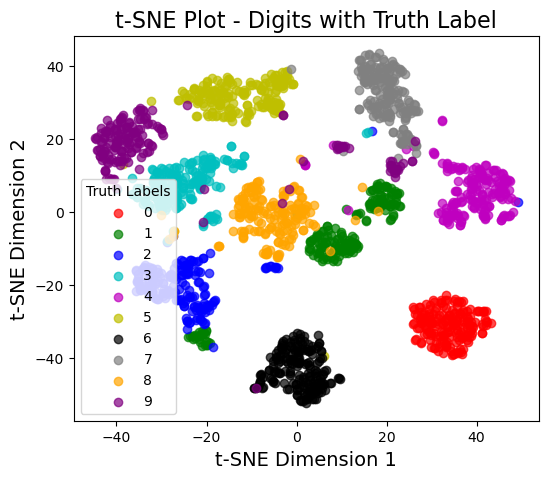

In [7]:
tsne = TSNE(n_components=2, random_state=42)
X_2d = tsne.fit_transform(X_digits_std)
target_ids = range(len(digits.target_names))
y = y_digits
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'grey', 'orange', 'purple'
for i, c, label in zip(target_ids, colors, digits.target_names):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c=c, label=label, alpha =0.7)
plt.legend(title="Truth Labels")
plt.title('t-SNE Plot - Digits with Truth Label', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.show()

# Digits

## Clustering

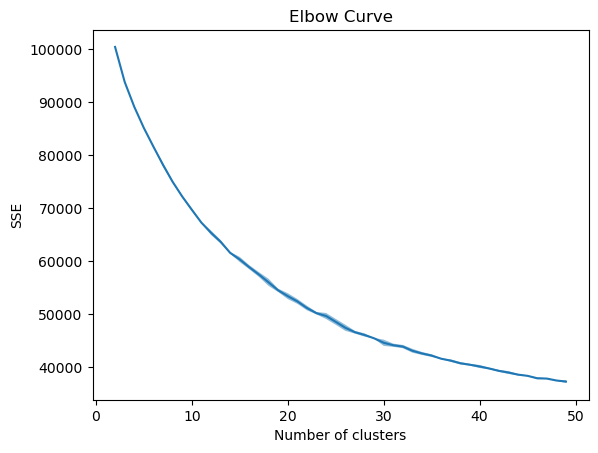

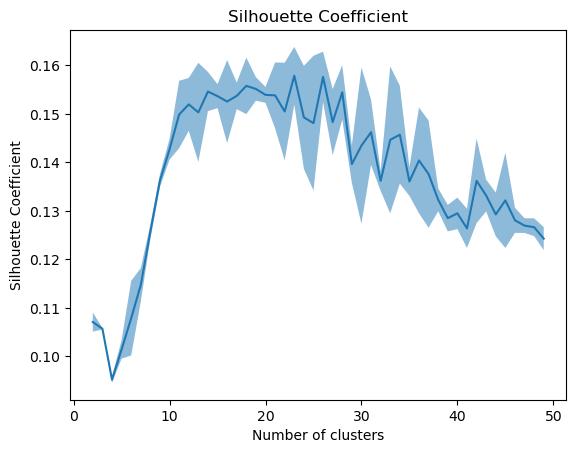

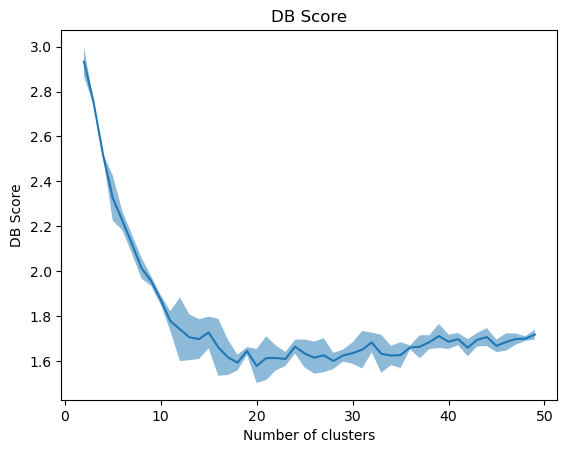

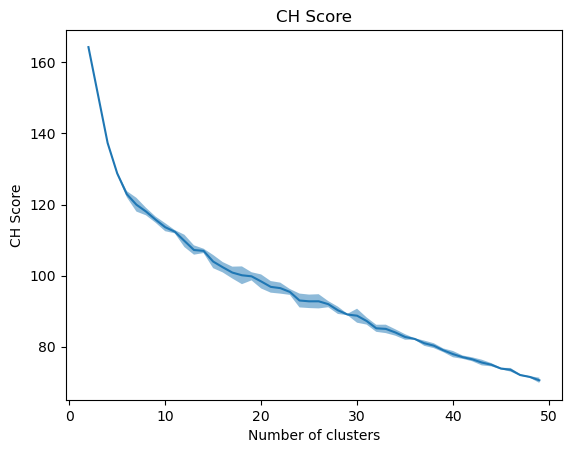

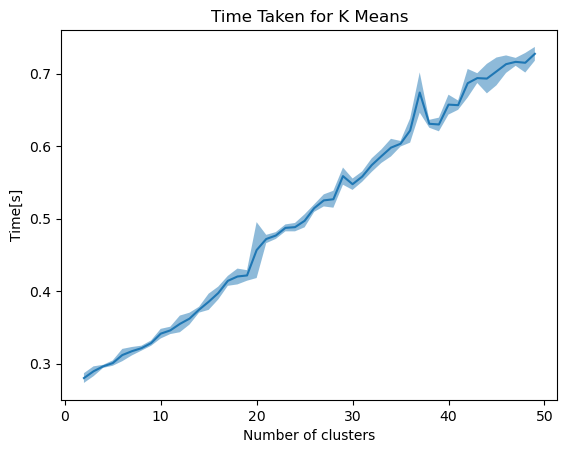

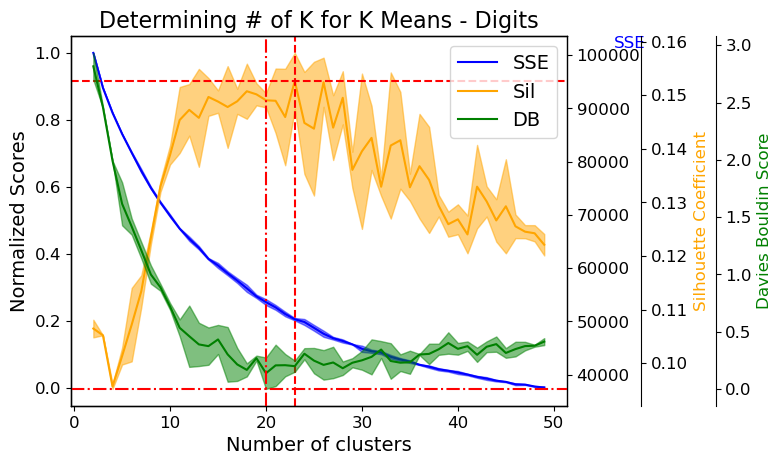

Silhoutte Score Max : 23
DB Score Min : 20
Wall time: 2min 38s


In [8]:
%%time
# We should grab the timings as well
# We should also normalize the values so we can place all the diagrams on a single graph
df_cluster_time = k_means(X_digits_std,'Digits')

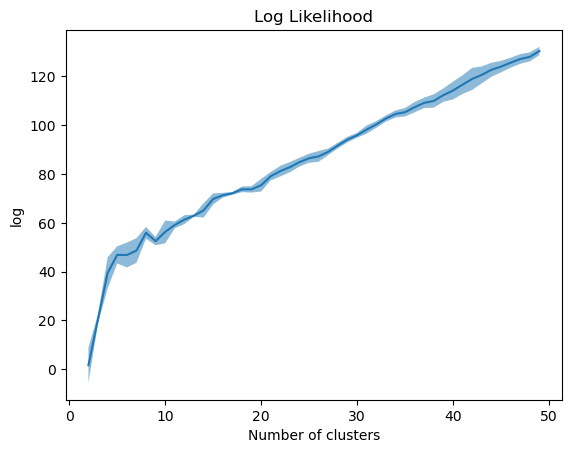

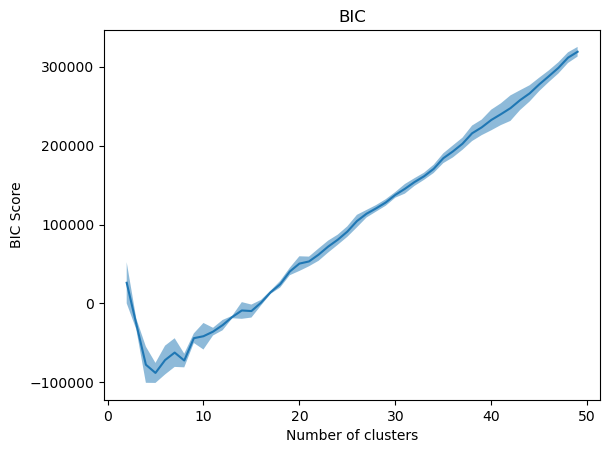

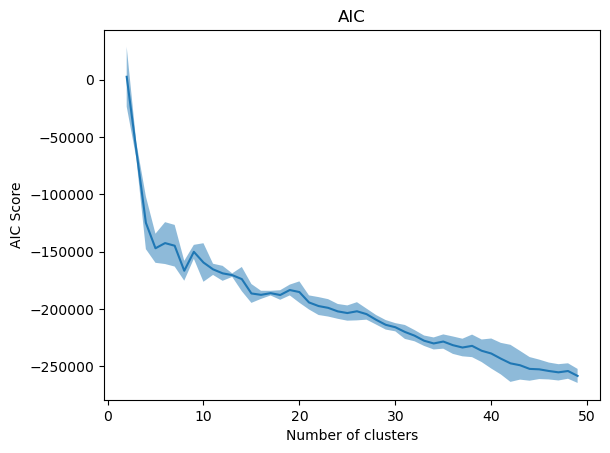

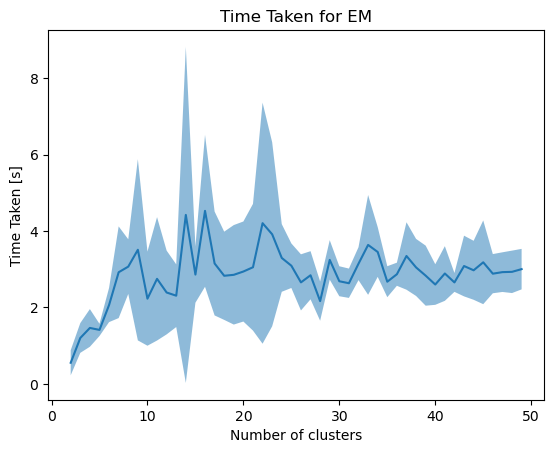

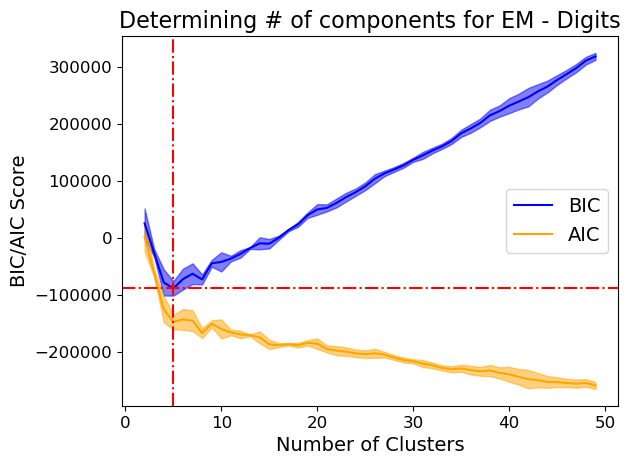

Wall time: 12min 53s


In [9]:
%%time
df_cluster_time_gmm = gmm_graphs(X_digits_std,'Digits')

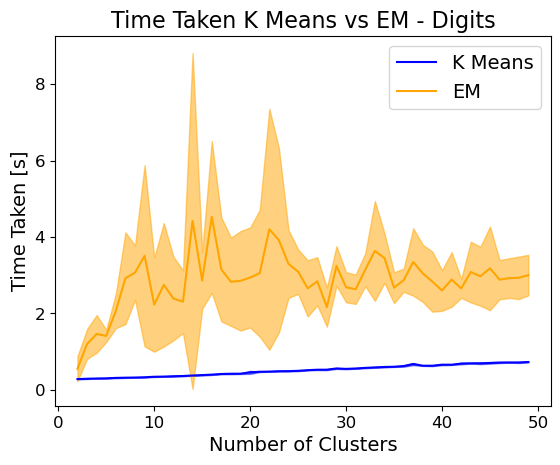

In [10]:
# Compare timings
df_cluster_time
df_cluster_time_gmm
plt.plot(df_cluster_time['Cluster'],df_cluster_time['Mean'], color ='b',label='K Means')
plt.fill_between(df_cluster_time['Cluster'], df_cluster_time['Mean']+df_cluster_time['Std'],df_cluster_time['Mean']-df_cluster_time['Std'], alpha=0.5, color ='b')
plt.plot(df_cluster_time_gmm['Cluster'],df_cluster_time_gmm['Mean'], color ='orange',label='EM')
plt.fill_between(df_cluster_time_gmm['Cluster'], df_cluster_time_gmm['Mean']+df_cluster_time_gmm['Std'],df_cluster_time_gmm['Mean']-df_cluster_time_gmm['Std'], alpha=0.5, color ='orange')
plt.title('Time Taken K Means vs EM - Digits', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [12]:
kmeans_digits_labels = KMeans(n_clusters=20, random_state=42, max_iter = 1000).fit_predict(X_digits_std)
gmm_digits_labels = GaussianMixture(n_components=5, random_state=42, max_iter = 1000).fit_predict(X_digits_std)

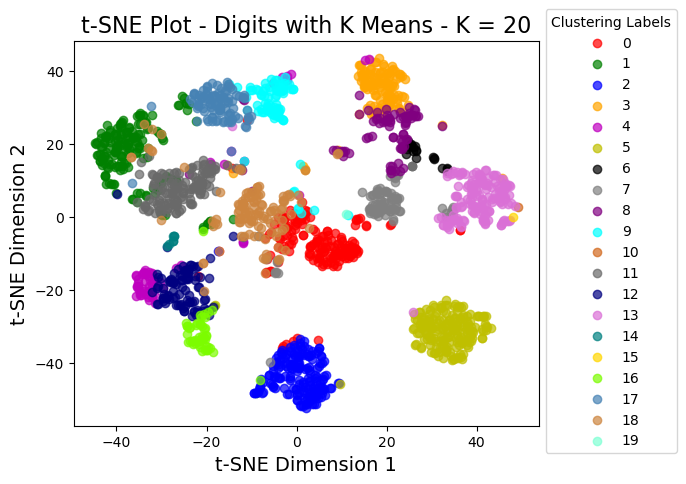

In [13]:
# Clustering and visualization
y = kmeans_digits_labels
target_ids = range(0, 25)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan','chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine'

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means - K = 20', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

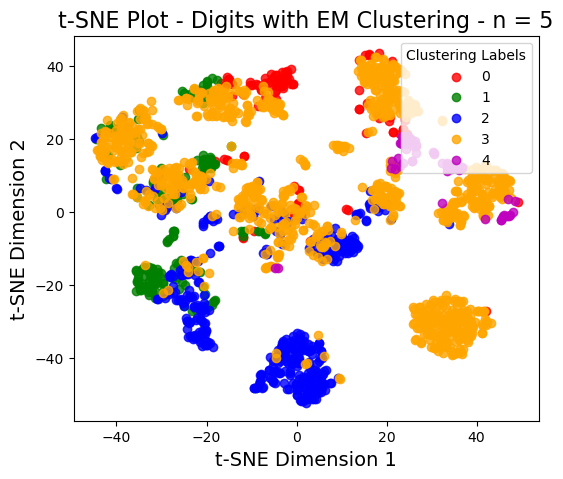

In [14]:
y = gmm_digits_labels
target_ids = range(0, 20)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = 'r', 'g', 'b', 'orange', 'm'
for i, c, label in zip(target_ids, colors, digits.target_names):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.8)
plt.legend(title="Clustering Labels")
plt.title('t-SNE Plot - Digits with EM Clustering - n = 5', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.show()

## Dimensionality Reduction

In [ ]:
# Perform dimensionality reduction method
# 1. PCA
# 2. ICA
# 3. RCA
# 4. Random Forest Feature Selection 

# We need to find out the number of features to reduce here
# We also need to record the amount of time taken for the algorithms

# For PCA we will be using the variance explained 
# as well as the eigenvalues to determine the number of components to reduce to

# For ICA we will be looking at the kurtosis 

# For RCA we will be looking at the recontruction scores

# For random forest classifier, we will be looking at the feature importance

In [16]:
# PCA
def run_PCA(X,title):
    
    pca = PCA(random_state=42).fit(X) 
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # We also want to be able to get the number of clusters that explains 90% variance    
    fig, ax1 = plt.subplots()
    ax1.plot(list(range(len(pca.explained_variance_ratio_))), cumulative_variance, 'b')
    ax1.set_xlabel('# of Principal Components', fontsize = 14)
    ax1.set_ylabel('Cumulative Explained Variance Ratio', fontsize = 14, color ='blue')
    ax1.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    plt.axhline(y=0.9, linestyle="--", color="red")
    
    ax2 = ax1.twinx()
    ax2.plot(list(range(len(pca.singular_values_))), pca.singular_values_, 'orange')
    ax2.set_ylabel('Eigenvalues', color ='orange', fontsize = 14)
    ax2.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    
    ax3 = ax1.twinx()
    ax3.plot(list(range(len(pca.singular_values_))), pca.explained_variance_ratio_, 'g')
    ax3.spines.right.set_position(("axes", 1.25))
    ax3.set_ylabel('Explained Variance Ratio', fontsize = 14, color ='green')
    ax3.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    
    pca = PCA(0.9,random_state=42)
    data = pca.fit_transform(X)
    var_cluster_90 = data.shape[1]
    
    # Plot the line to get the 90% variance    
    plt.axvline(x=var_cluster_90, linestyle="--", color="red")

    plt.title("PCA Explained Variance and Eigenvalues: "+ title, fontsize = 16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    fig.tight_layout()
    plt.show()
    
    return cumulative_variance, var_cluster_90


# Now for ica
def run_ICA(X,title):
    
    tmp_1 = defaultdict(dict)
    
    dims = list(range(2,X.shape[1]))
    for i in range(5):
        ica = ICA(random_state=(i)*i, max_iter = 1000, whiten=True)
        kurt = []

        for dim in dims:
            ica.set_params(n_components=dim)
            tmp = ica.fit_transform(X)
            tmp = pd.DataFrame(tmp)
            tmp = tmp.kurt(axis=0)
            kurt.append(tmp.abs().mean())
        tmp_1[i] = kurt
            
        tmp_1 = pd.DataFrame(tmp_1)
            
    
    
    plt.figure()
    plt.title("ICA Kurtosis: "+ title)
    plt.xlabel("Independent Components")
    plt.ylabel("Average Kurtosis")
    plt.plot(dims, kurt, 'b')
    
    max_kurt = max(kurt)
    max_index_ica = kurt.index(max_kurt)
    # Need to take into account for the shift as we are starting from n = 2
    max_index_ica = max_index_ica+2
    plt.axhline(y=max_kurt, linestyle="--", color="red")
    plt.axvline(x=max_index_ica, linestyle="--", color="red")    
    
    plt.grid(False)
    plt.show()
    
    return max_index_ica, tmp_1

# The next thing we gotta do is for the RCA 
# To determine what is the optimal # of components for RCA, we need to get the reconstruction error
# We are looking at having a reconstruction error of less than 10% and thus a mean construction correlation of 90%

# We need to run this for 5 times to average out effects due to stochasticity

def run_RCA(X,title):
    
    dims = list(range(2,X.shape[1]+1))
    tmp = defaultdict(dict)

    for i,dim in product(range(5),dims):
        # Get the reconstruction loss
        rp = RCA(random_state=(i)*i, n_components=dim).fit(X)
        X_train_ica = rp.transform(X)
        X_projected = rp.inverse_transform(X_train_ica)
        tmp[dim][i] = r2_score(X,X_projected)
        
    tmp = pd.DataFrame(tmp).T
    tmp['Mean'] = tmp.mean(axis=1)    
    tmp['Std'] = tmp.std(axis=1)
    
    # Get the 90% threshold
    correlation_90 = tmp[tmp['Mean']>0.9][0].index[0]
    
    plt.figure()
    plt.plot(dims,tmp['Mean'], 'b')
    plt.xlabel('# of Random Components', fontsize=14)
    plt.ylabel('Mean Reconstruction Correlation', fontsize=14)
    plt.fill_between(dims, tmp['Mean']+tmp['Std'],tmp['Mean']-tmp['Std'], alpha=0.5)
    plt.tick_params('y')
    plt.grid(False)
    
    plt.axhline(y=0.9, linestyle="--", color="red")
    plt.axvline(x=correlation_90, linestyle="--", color="red")  

    plt.title("Randomized Projection - Average of 5 runs: "+ title, fontsize=16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tight_layout()
    plt.show()
    
    return correlation_90

# Do for randomized forests feature selection
def run_RFC(X,y,title):
    rfc = RFC(n_estimators=500,min_samples_leaf=round(len(X)*.01),random_state=42,n_jobs=-1)
    feature_importance = rfc.fit(X,y).feature_importances_ 
    feature_importance_df = pd.DataFrame(feature_importance,columns=['Feature Importance'])
    feature_importance_df.sort_values(by=['Feature Importance'],inplace=True,ascending=False)
    feature_importance_df['Cumulative Score'] = feature_importance_df['Feature Importance'].cumsum()
    feature_importance_df['Position_Index'] = feature_importance_df.index
    feature_importance_df.reset_index(drop=True, inplace=True)
    feature_importance_90_df = feature_importance_df[feature_importance_df['Cumulative Score']<=0.9]
    
    # Need to add in 1 as we start from index = 0
    correlation_90 = feature_importance_df[feature_importance_df['Cumulative Score']>=0.9].head(1).index[0]
    plt.plot(feature_importance_df.index+1,feature_importance_df['Cumulative Score'], color ='b')
    plt.axhline(y=0.9, linestyle="--", color="red")
    plt.axvline(x=correlation_90, linestyle="--", color="red")  
    plt.title('Random Forest - Feature Importance: '+title, fontsize=16)
    plt.xlabel('Number of Features', fontsize=14)
    plt.ylabel('Cumulative Feature Importance', fontsize=14)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    
    return feature_importance_df,feature_importance_90_df,correlation_90

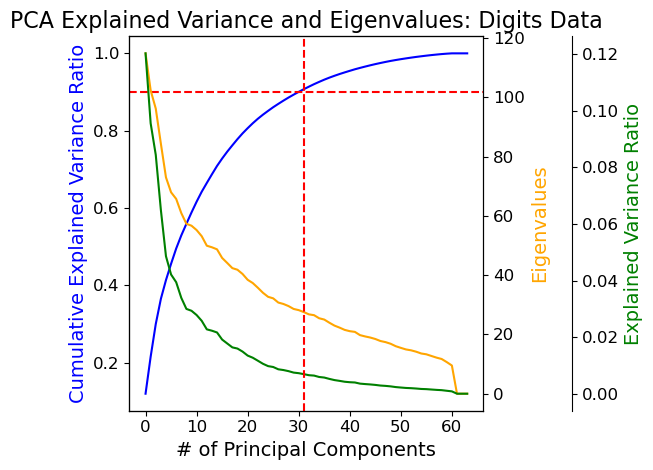

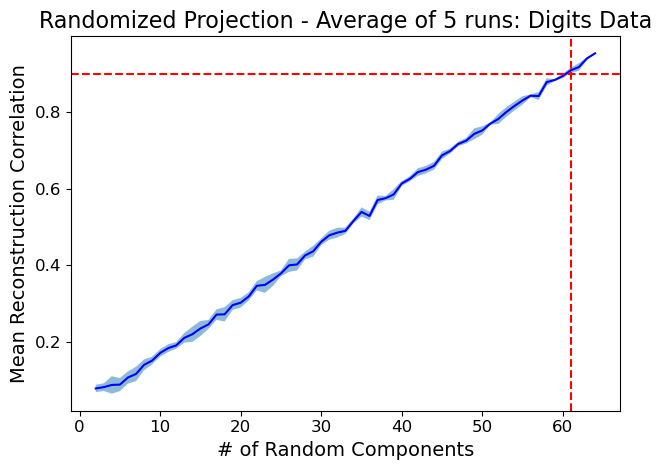

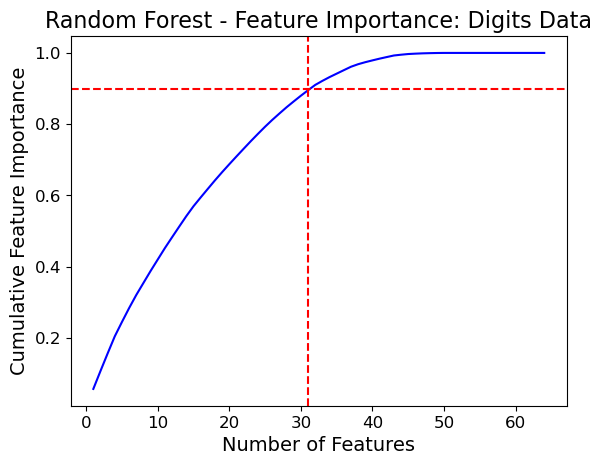

Wall time: 2.94 s


In [17]:
%%time
cumulative_variance_digits, var_cluster_90_digits = run_PCA(X_digits_std,"Digits Data")
#max_index_ica_digits = run_ICA(X_digits_std,"Digits Data")
rca_correlation_90_digits = run_RCA(X_digits_std,'Digits Data')
feature_importance_df_digits,feature_importance_90_df_digits,rf_correlation_90_digits = run_RFC(X_digits_std,y_digits,'Digits Data')

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider incre

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider incre

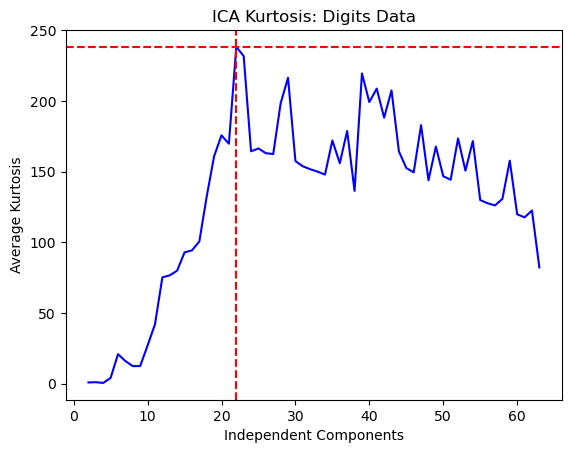

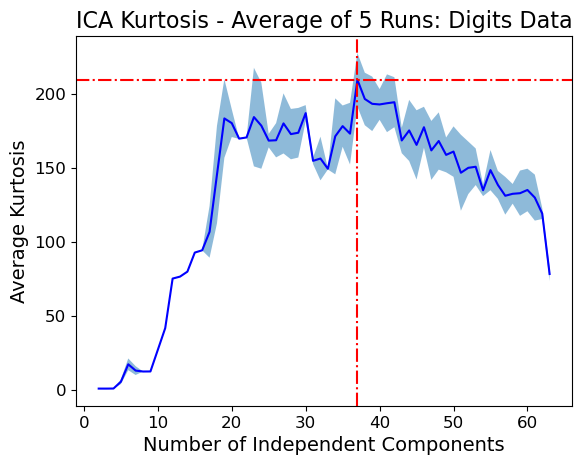

Wall time: 5min 5s


37

In [18]:
%%time
max_index_ica_digits, tmp_1 = run_ICA(X_digits_std,"Digits Data")
tmp_2 = pd.DataFrame(tmp_1)
tmp_2['Cluster']=tmp_2.index+2
tmp_2['Mean'] =  tmp_2.iloc[:, 0:4].mean(axis=1)
tmp_2['Std'] =  tmp_2.iloc[:, 0:4].std(axis=1)
tmp_2
plt.figure()
plt.plot(tmp_2['Cluster'], tmp_2['Mean'], 'b')
#plt.plot(tmp_2.index, tmp_2['Std'], 'b')
plt.fill_between(tmp_2['Cluster'], tmp_2['Mean']+tmp_2['Std'],tmp_2['Mean']-tmp_2['Std'], alpha=0.5)
plt.axhline(y=tmp_2['Mean'].max(), linestyle="-.", color="red")
plt.axvline(x=tmp_2['Mean'].idxmax()+2, linestyle="-.", color="red")
plt.title('ICA Kurtosis - Average of 5 Runs: Digits Data', fontsize=16)
plt.xlabel('Number of Independent Components', fontsize=14)
plt.ylabel('Average Kurtosis', fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()
tmp_2['Mean'].idxmax()+2

In [19]:
# Now we need to run on the k means
pca_digits = PCA(n_components = var_cluster_90_digits, random_state=42).fit_transform(X_digits_std)
ica_digits = ICA(n_components = 37, random_state=42).fit_transform(X_digits_std)
rca_digits = RCA(n_components = rf_correlation_90_digits, random_state=42).fit_transform(X_digits_std)

# For the random forest, we need to grab the columns 
rf_list_digits = list(feature_importance_90_df_digits['Position_Index'])
X_digits_std_df = pd.DataFrame(X_digits_std)
rf_digits = X_digits_std_df[rf_list_digits]

## Dimensionality Reduction with Clustering

### K-Means

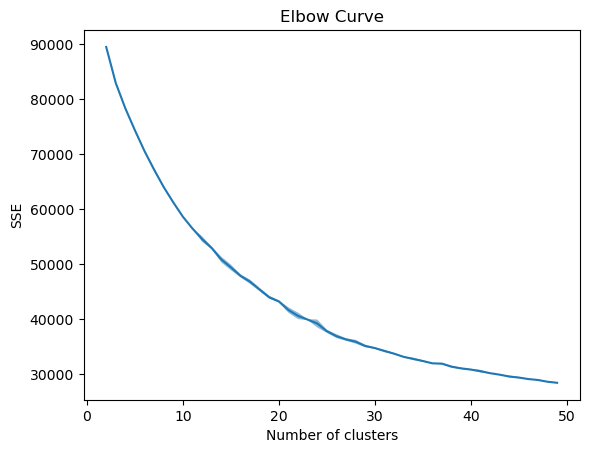

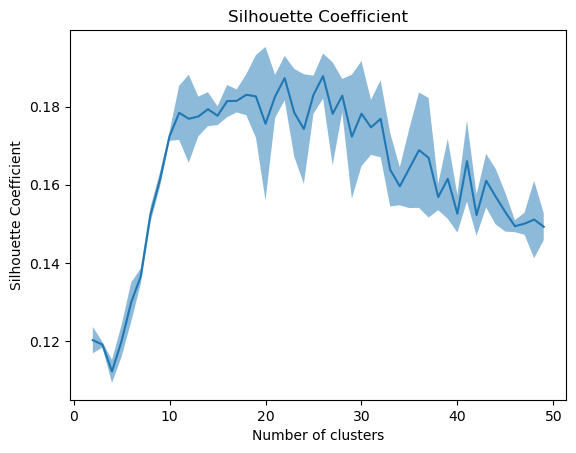

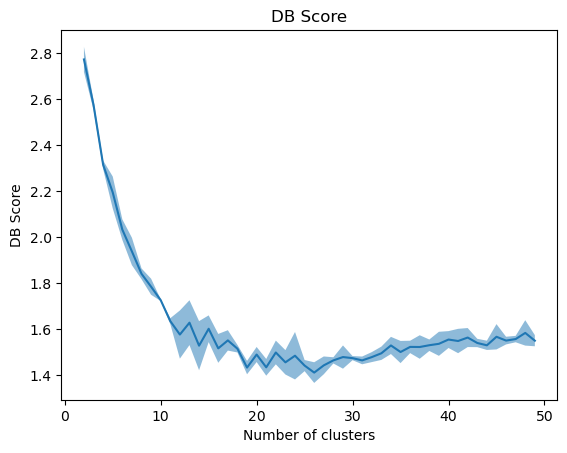

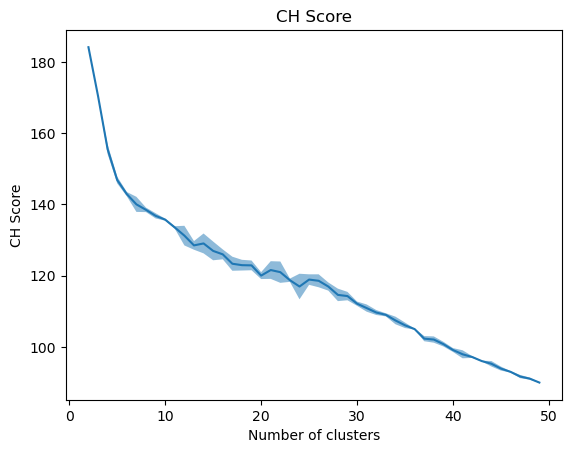

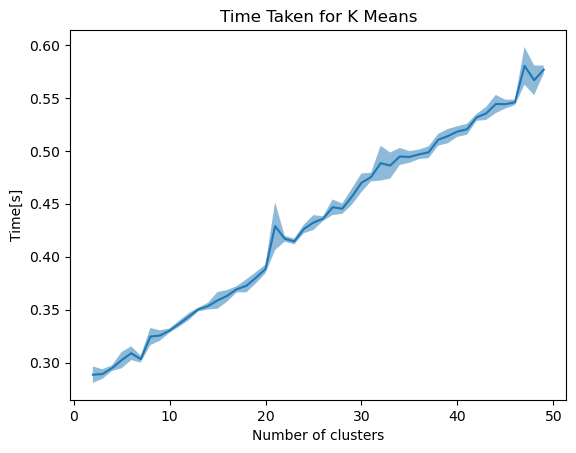

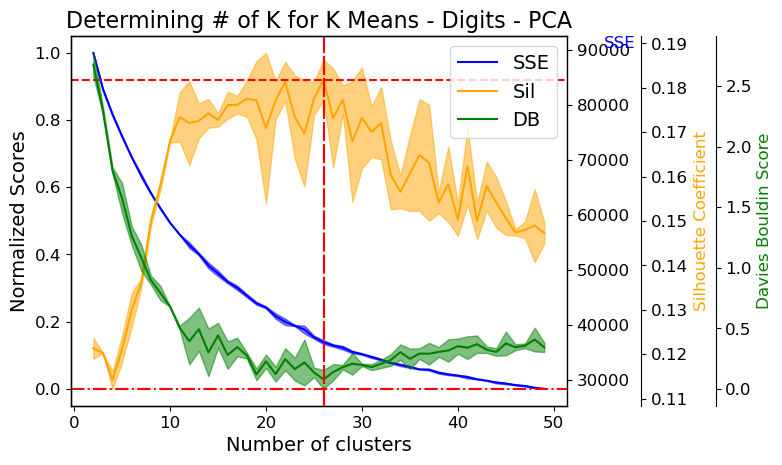

Silhoutte Score Max : 26
DB Score Min : 26


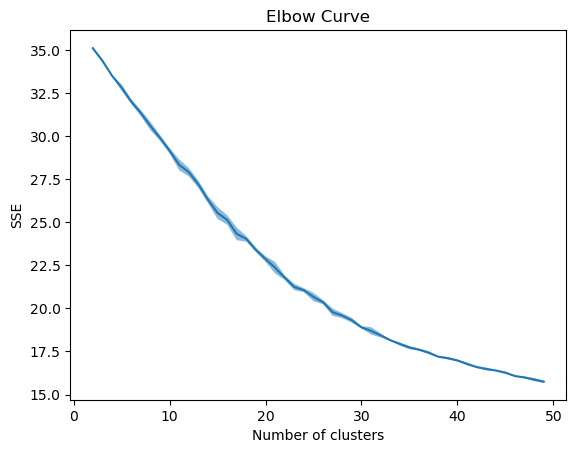

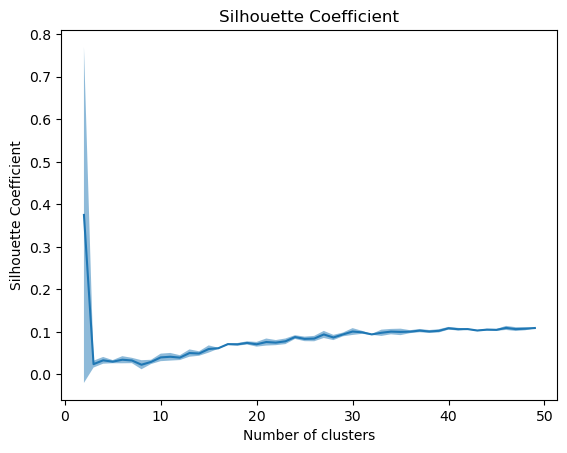

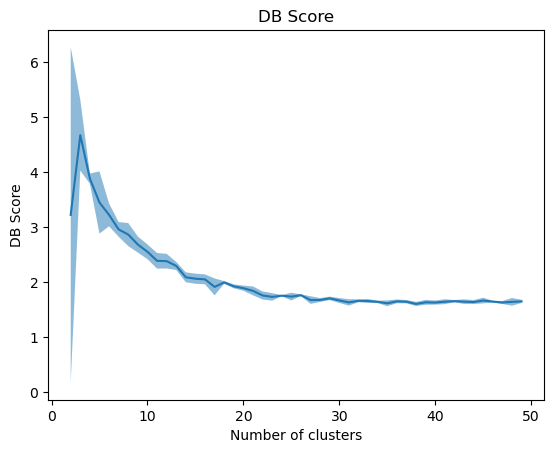

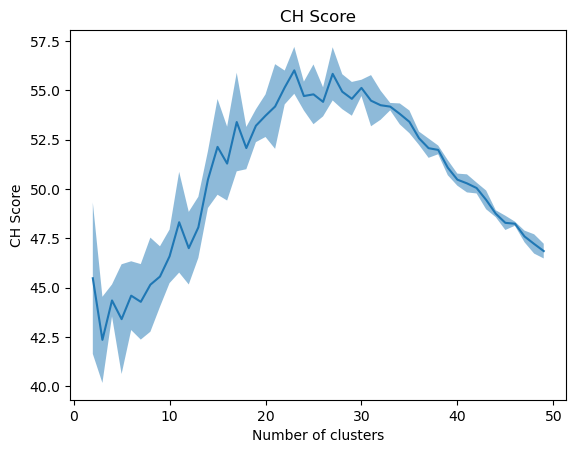

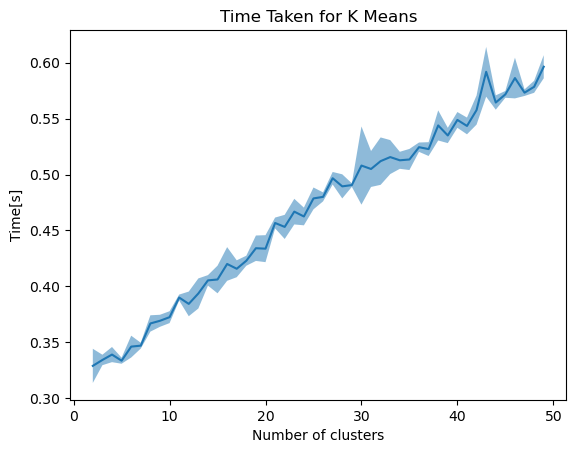

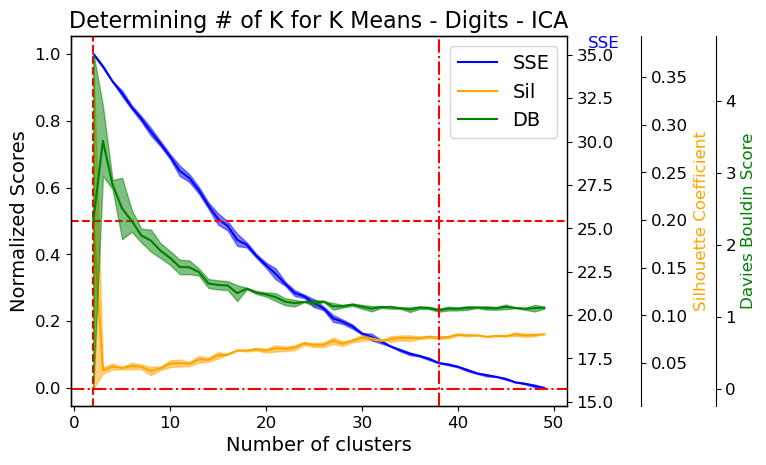

Silhoutte Score Max : 2
DB Score Min : 38


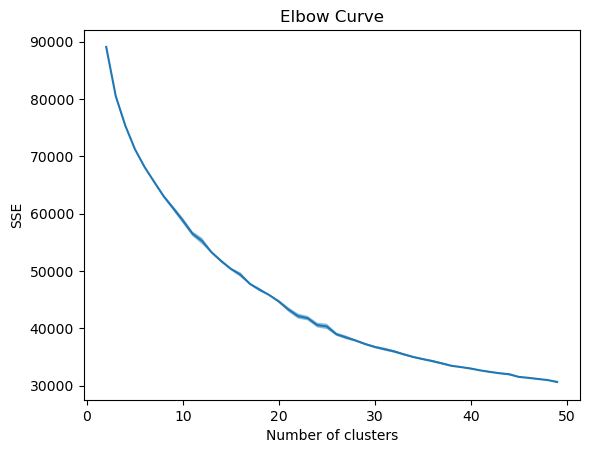

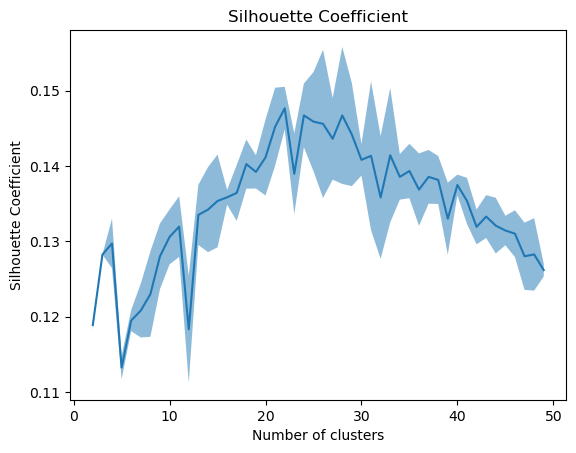

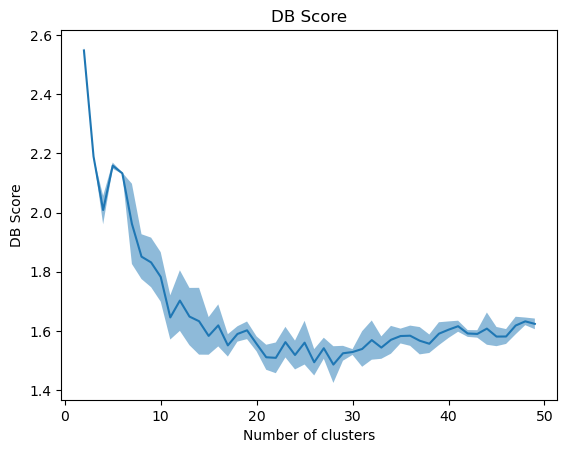

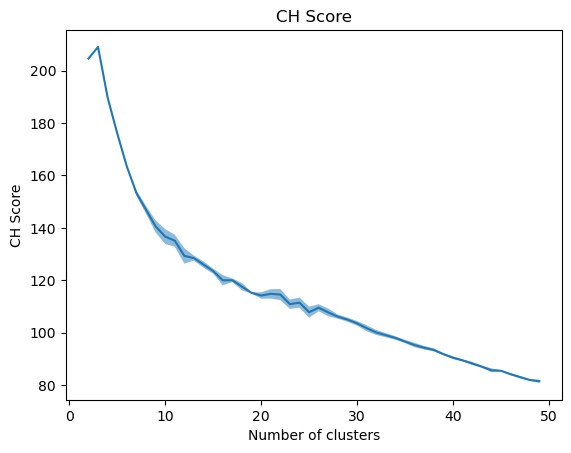

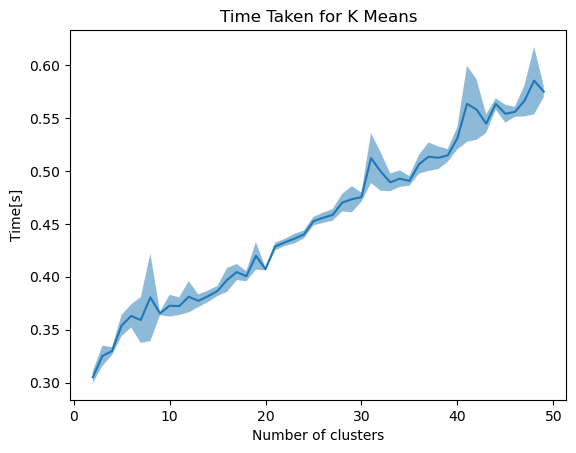

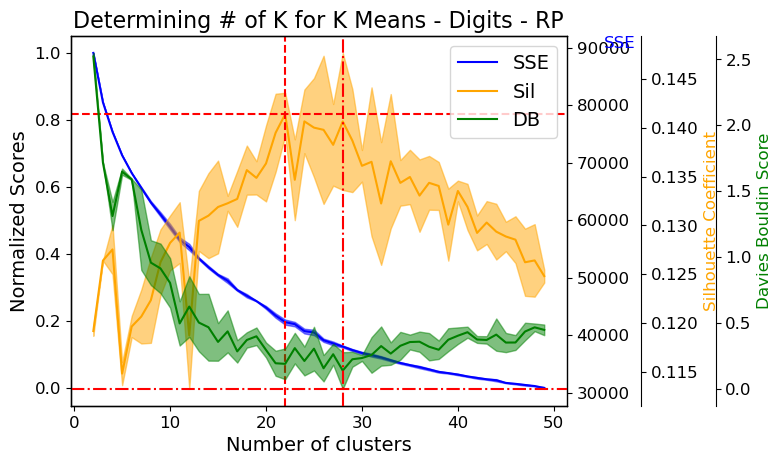

Silhoutte Score Max : 22
DB Score Min : 28


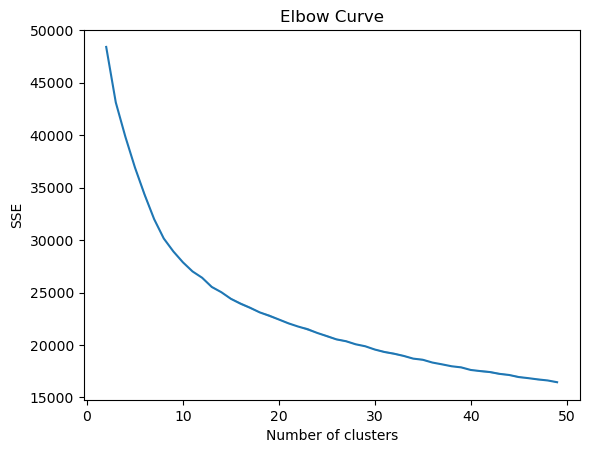

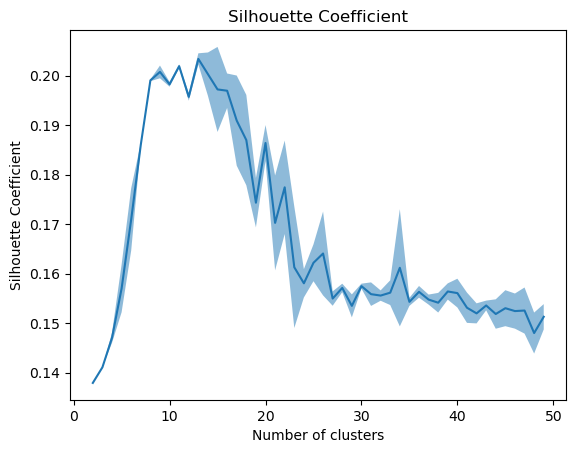

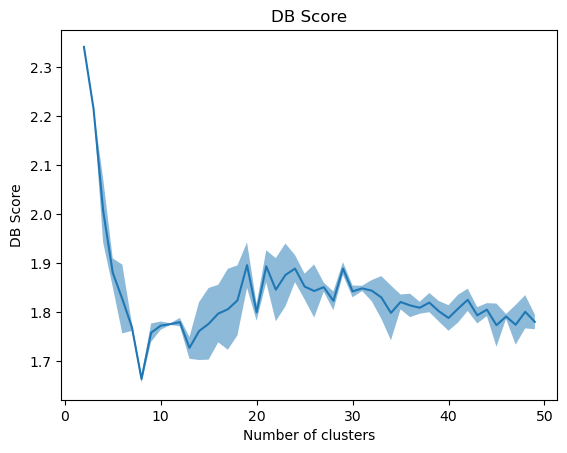

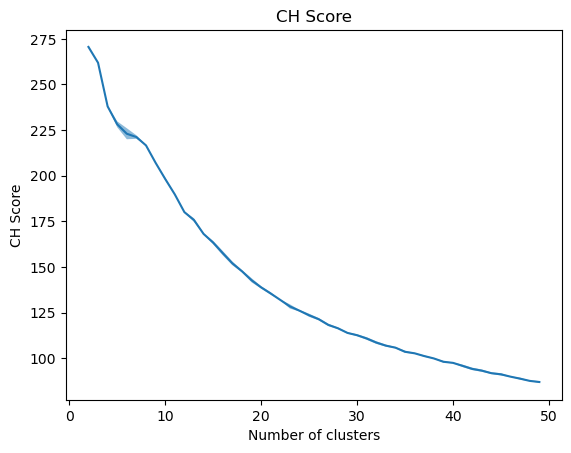

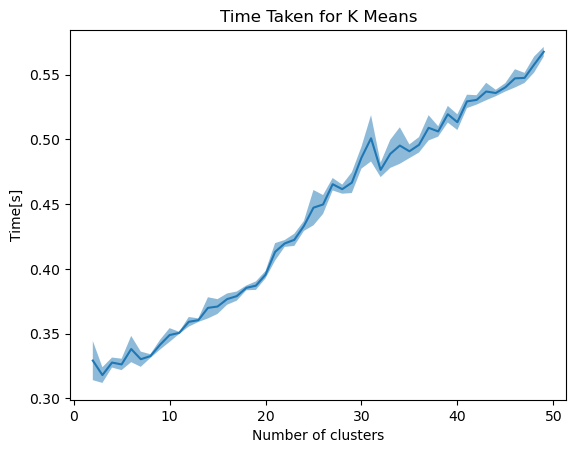

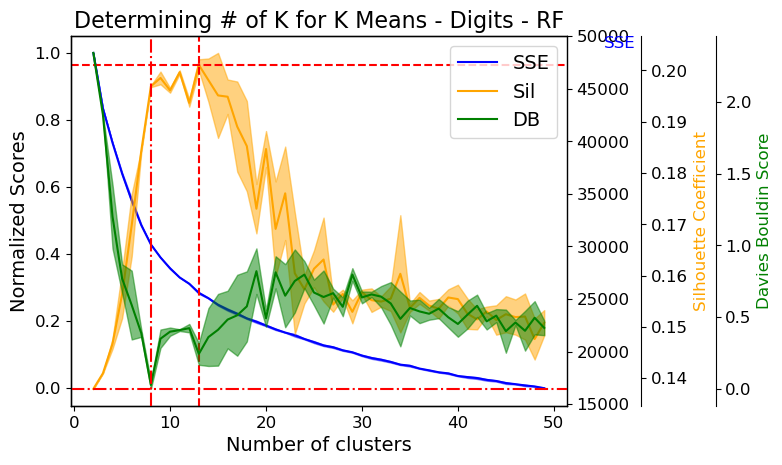

Silhoutte Score Max : 13
DB Score Min : 8
Wall time: 8min 54s


In [20]:
%%time
df_kmeans_time_pca = k_means(pca_digits, 'Digits - PCA')
df_kmeans_time_ica =k_means(ica_digits, 'Digits - ICA')
df_kmeans_time_rca =k_means(rca_digits, 'Digits - RP')
df_kmeans_time_rf =k_means(rf_digits, 'Digits - RF')

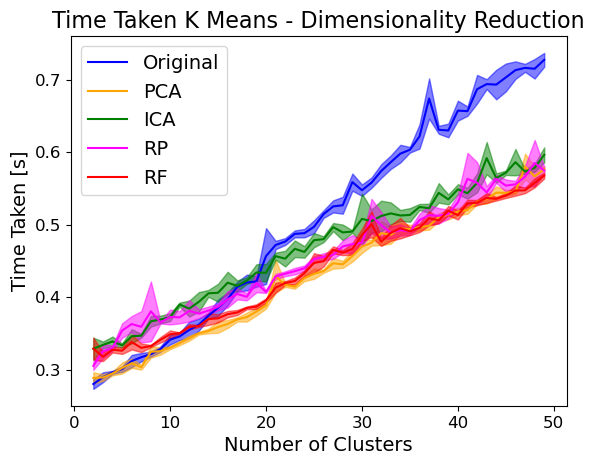

In [22]:
plt.plot(df_cluster_time['Cluster'],df_cluster_time['Mean'], color ='b',label='Original')
plt.fill_between(df_cluster_time['Cluster'], df_cluster_time['Mean']+df_cluster_time['Std'],df_cluster_time['Mean']-df_cluster_time['Std'], alpha=0.5, color ='b')

plt.plot(df_kmeans_time_pca['Cluster'],df_kmeans_time_pca['Mean'], color ='orange',label='PCA')
plt.fill_between(df_kmeans_time_pca['Cluster'], df_kmeans_time_pca['Mean']+df_kmeans_time_pca['Std'],df_kmeans_time_pca['Mean']-df_kmeans_time_pca['Std'], alpha=0.5, color ='orange')

plt.plot(df_kmeans_time_ica['Cluster'],df_kmeans_time_ica['Mean'], color ='green',label='ICA')
plt.fill_between(df_kmeans_time_ica['Cluster'], df_kmeans_time_ica['Mean']+df_kmeans_time_ica['Std'],df_kmeans_time_ica['Mean']-df_kmeans_time_ica['Std'], alpha=0.5, color ='green')

plt.plot(df_kmeans_time_rca['Cluster'],df_kmeans_time_rca['Mean'], color ='magenta',label='RP')
plt.fill_between(df_kmeans_time_rca['Cluster'], df_kmeans_time_rca['Mean']+df_kmeans_time_rca['Std'],df_kmeans_time_rca['Mean']-df_kmeans_time_rca['Std'], alpha=0.5, color ='magenta')

plt.plot(df_kmeans_time_rf['Cluster'],df_kmeans_time_rf['Mean'], color ='red',label='RF')
plt.fill_between(df_kmeans_time_rf['Cluster'], df_kmeans_time_rf['Mean']+df_kmeans_time_rf['Std'],df_kmeans_time_rf['Mean']-df_kmeans_time_rf['Std'], alpha=0.5, color ='red')


plt.title('Time Taken K Means - Dimensionality Reduction', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [23]:
kmeans_digits_labels_pca = KMeans(n_clusters=26, random_state=42, max_iter = 1000).fit_predict(pca_digits)
kmeans_digits_labels_ica = KMeans(n_clusters=38, random_state=42, max_iter = 1000).fit_predict(ica_digits)
kmeans_digits_labels_rca = KMeans(n_clusters=28, random_state=42, max_iter = 1000).fit_predict(rca_digits)
kmeans_digits_labels_rf = KMeans(n_clusters=8, random_state=42, max_iter = 1000).fit_predict(rf_digits)

In [24]:
# Now do clustering
tsne = TSNE(n_components=2, random_state=42)
X_2d = tsne.fit_transform(X_digits_std)

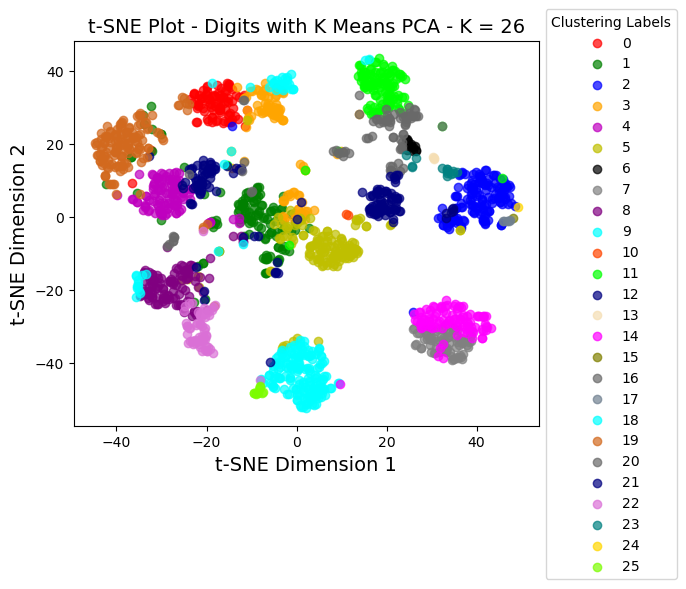

In [25]:
y = kmeans_digits_labels_pca
target_ids = range(0, 35)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means PCA - K = 26', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

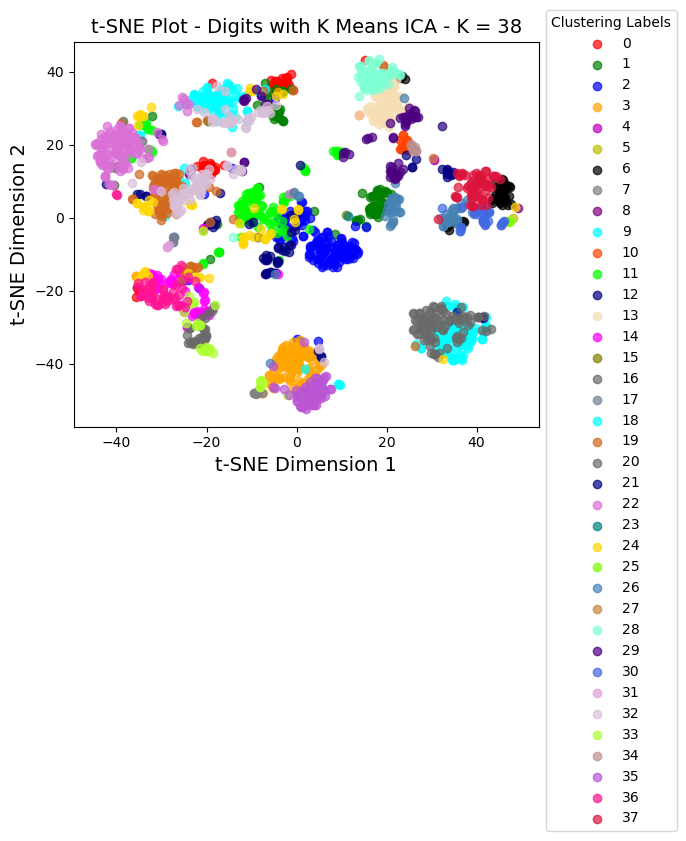

In [26]:
y = kmeans_digits_labels_ica
target_ids = range(0, 40)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors =  ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_ica)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means ICA - K = 38', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

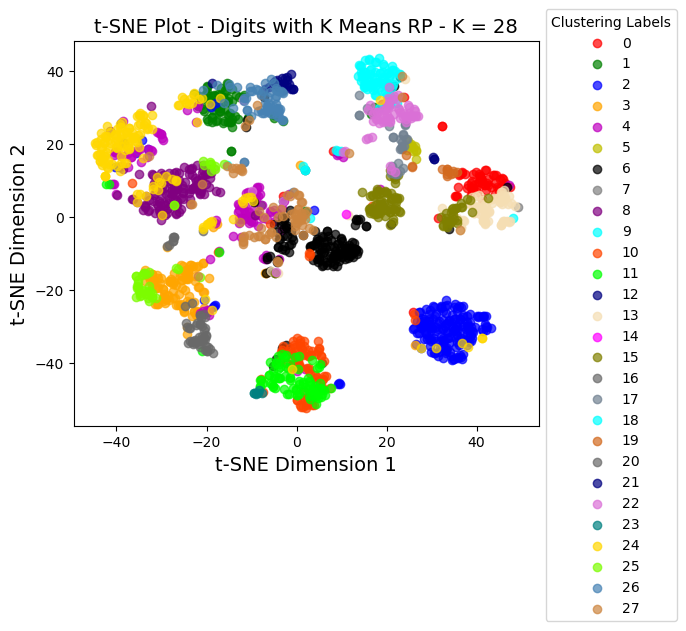

In [27]:
y = kmeans_digits_labels_rca
target_ids = range(0, 35)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_rca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means RP - K = 28', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

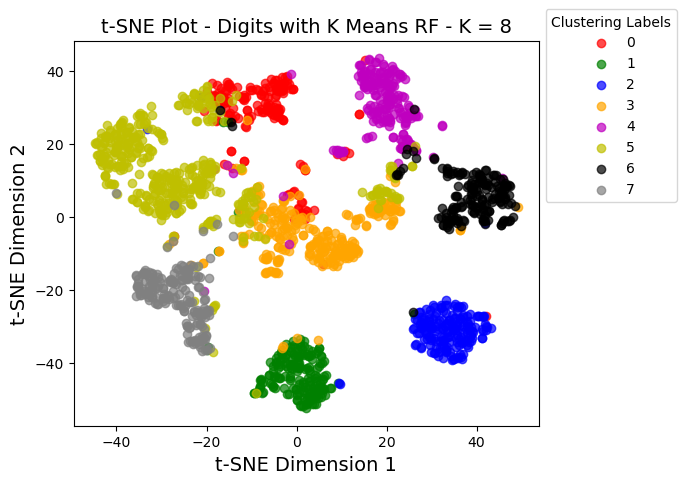

In [28]:
y = kmeans_digits_labels_rf
target_ids = range(0, 35)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_rf)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with K Means RF - K = 8', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

### EM

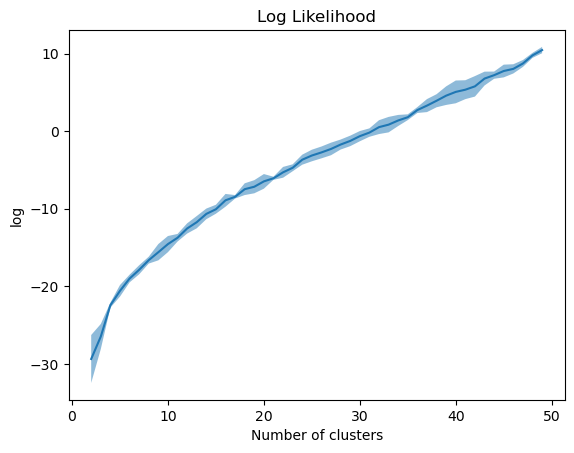

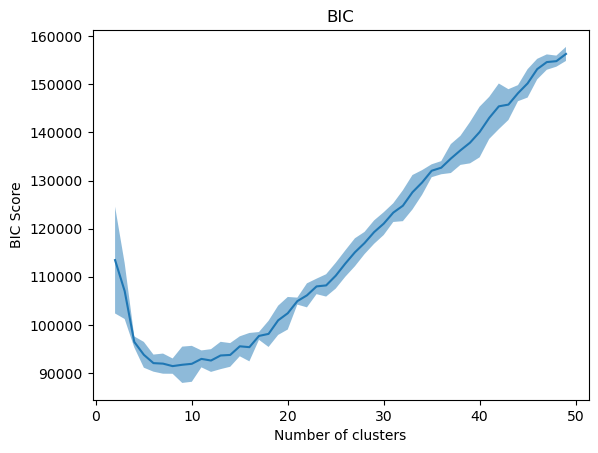

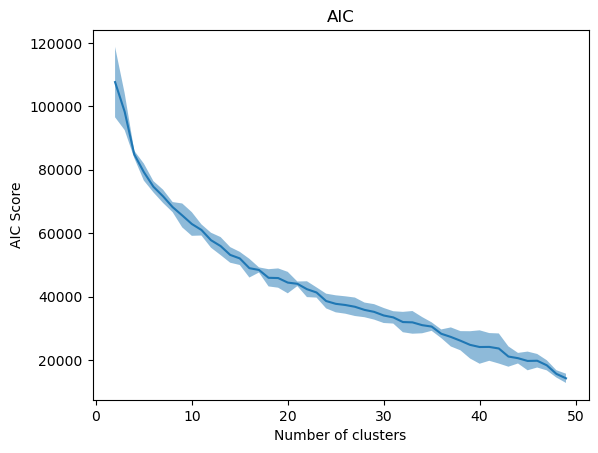

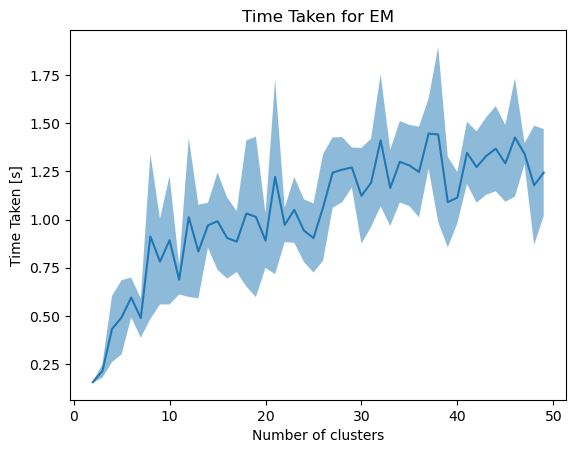

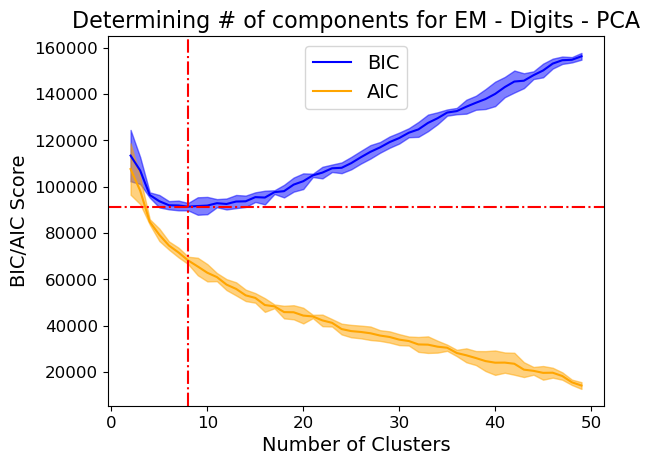

...

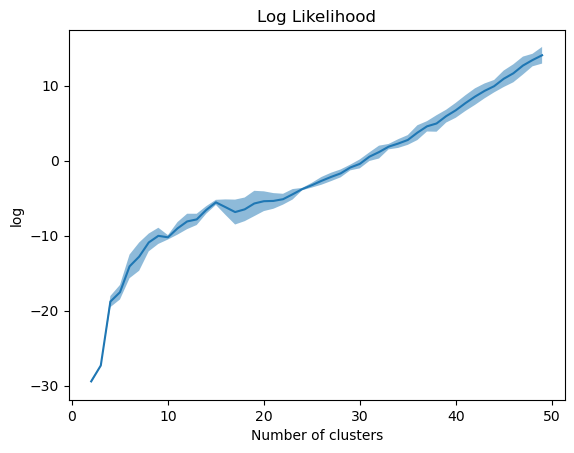

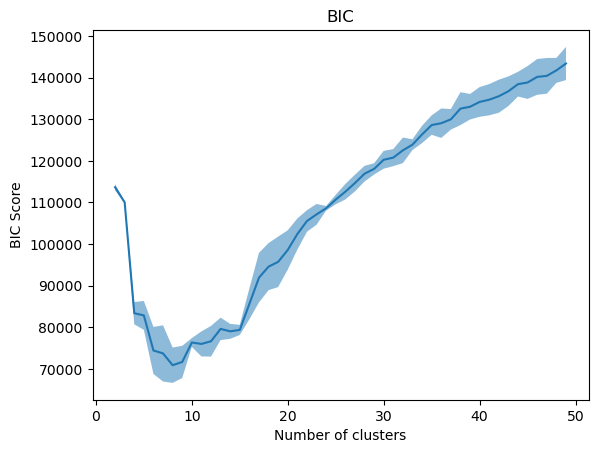

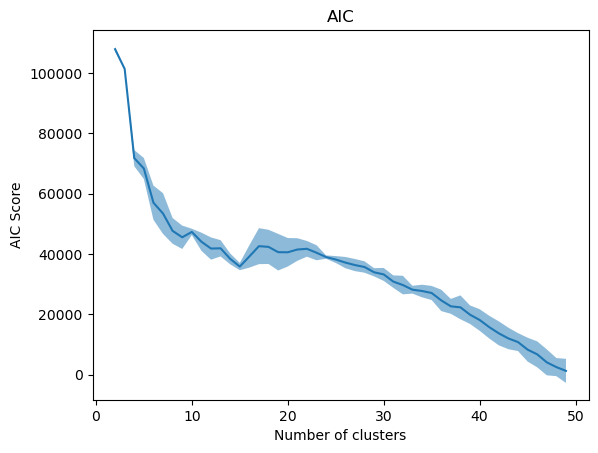

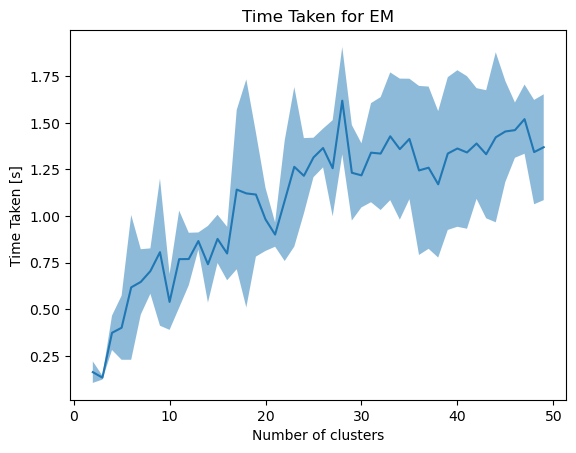

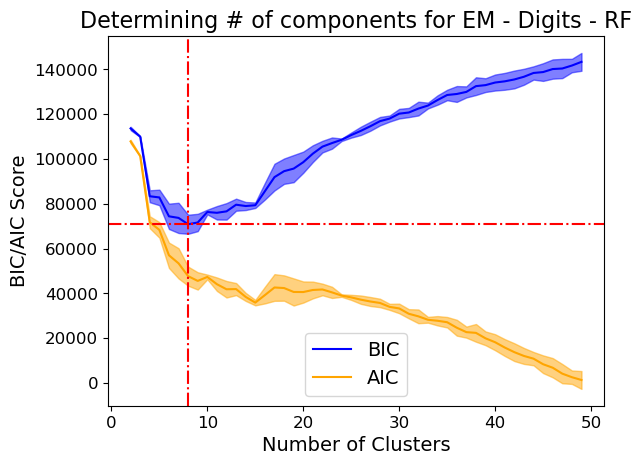

Wall time: 29min 45s


In [29]:
%%time
df_gmm_time_pca = gmm_graphs(pca_digits, 'Digits - PCA')
df_gmm_time_ica = gmm_graphs(ica_digits, 'Digits - ICA')
df_gmm_time_rca = gmm_graphs(rca_digits, 'Digits - RP')
df_gmm_time_rf = gmm_graphs(rf_digits, 'Digits - RF')

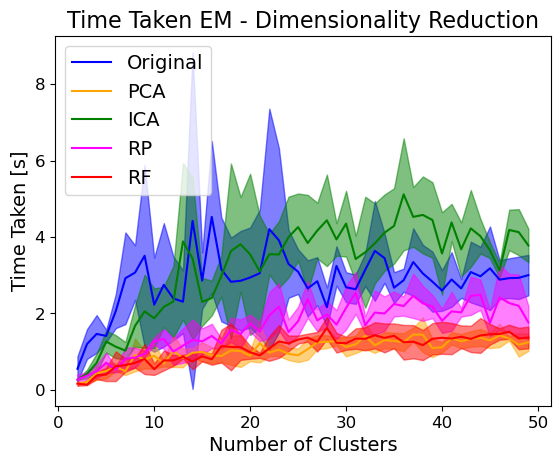

In [30]:
plt.plot(df_cluster_time_gmm['Cluster'],df_cluster_time_gmm['Mean'], color ='b',label='Original')
plt.fill_between(df_cluster_time_gmm['Cluster'], df_cluster_time_gmm['Mean']+df_cluster_time_gmm['Std'],df_cluster_time_gmm['Mean']-df_cluster_time_gmm['Std'], alpha=0.5, color ='b')

plt.plot(df_gmm_time_pca['Cluster'],df_gmm_time_pca['Mean'], color ='orange',label='PCA')
plt.fill_between(df_gmm_time_pca['Cluster'], df_gmm_time_pca['Mean']+df_gmm_time_pca['Std'],df_gmm_time_pca['Mean']-df_gmm_time_pca['Std'], alpha=0.5, color ='orange')

plt.plot(df_gmm_time_ica['Cluster'],df_gmm_time_ica['Mean'], color ='green',label='ICA')
plt.fill_between(df_gmm_time_ica['Cluster'], df_gmm_time_ica['Mean']+df_gmm_time_ica['Std'],df_gmm_time_ica['Mean']-df_gmm_time_ica['Std'], alpha=0.5, color ='green')

plt.plot(df_gmm_time_rca['Cluster'],df_gmm_time_rca['Mean'], color ='magenta',label='RP')
plt.fill_between(df_gmm_time_rca['Cluster'], df_gmm_time_rca['Mean']+df_gmm_time_rca['Std'],df_gmm_time_rca['Mean']-df_gmm_time_rca['Std'], alpha=0.5, color ='magenta')

plt.plot(df_gmm_time_rf['Cluster'],df_gmm_time_rf['Mean'], color ='red',label='RF')
plt.fill_between(df_gmm_time_rf['Cluster'], df_gmm_time_rf['Mean']+df_gmm_time_rf['Std'],df_gmm_time_rf['Mean']-df_gmm_time_rf['Std'], alpha=0.5, color ='red')

plt.title('Time Taken EM - Dimensionality Reduction', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [31]:
gmm_digits_labels_pca = GaussianMixture(n_components=9, random_state=42, max_iter = 1000).fit_predict(pca_digits)
gmm_digits_labels_ica = GaussianMixture(n_components=5, random_state=42, max_iter = 1000).fit_predict(ica_digits)
gmm_digits_labels_rca = GaussianMixture(n_components=10, random_state=42, max_iter = 1000).fit_predict(rca_digits)
gmm_digits_labels_rf = GaussianMixture(n_components=9, random_state=42, max_iter = 1000).fit_predict(rf_digits)

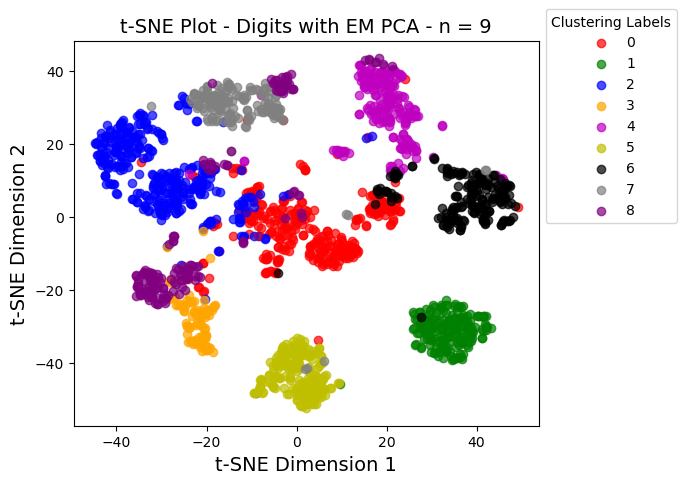

In [32]:
y = gmm_digits_labels_pca
target_ids = range(0, 9)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with EM PCA - n = 9', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

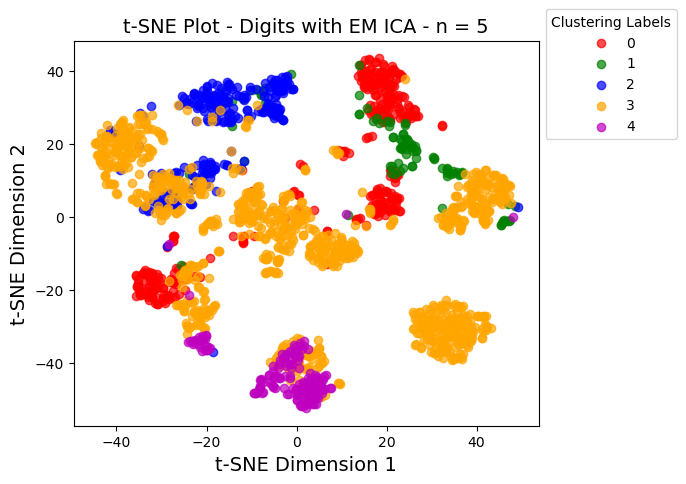

In [33]:
y = gmm_digits_labels_ica
target_ids = range(0, 5)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with EM ICA - n = 5', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

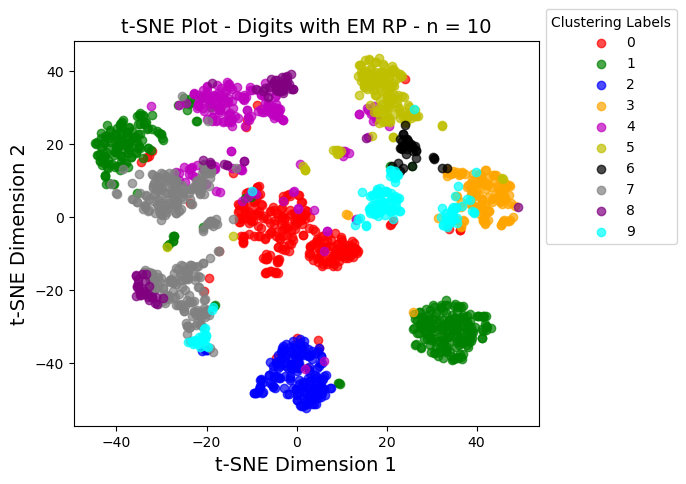

In [34]:
y = gmm_digits_labels_rca
target_ids = range(0, 10)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with EM RP - n = 10', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

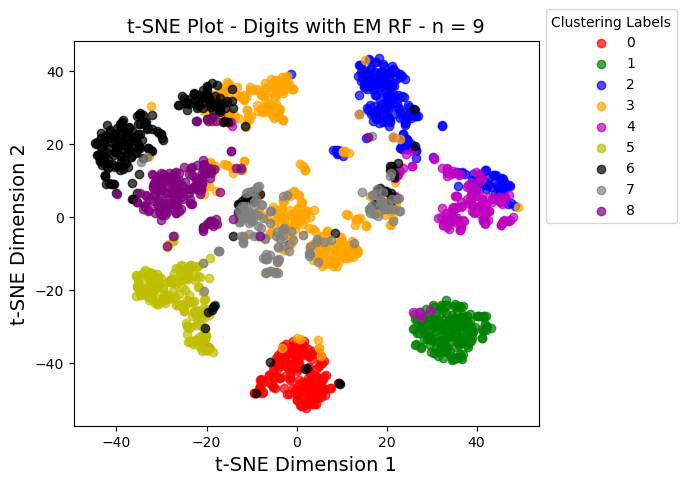

In [35]:
y = gmm_digits_labels_rf
target_ids = range(0, 9)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue'
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_digits_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Digits with EM RF - n = 9', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

## Heart

In [36]:
# We should make functions to run the script!
def k_means(x,dataSetName):
    input_X = x
    df = pd.DataFrame(columns=[0,1,2,3,4])
    df_cluster_sse = pd.DataFrame()
    df_cluster_sil = pd.DataFrame()
    df_cluster_db = pd.DataFrame()
    df_cluster_ch = pd.DataFrame()
    df_cluster_time = pd.DataFrame()
    
    clusters = list(range(2,50,1))
    # Take the average as K means is susceptible to getting stuck in local optima

    for cluster in clusters:
        df_val_col_sse = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_sil = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_db = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_ch = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_time = pd.DataFrame(columns=["Cluster"], data= [[cluster]])

        for i in range(5):
            start_time = time.time()
            kmeans_1 = KMeans(n_clusters=cluster, random_state=(i+1)*i, max_iter = 1000, ).fit(input_X)
            elapsed_time = (time.time() - start_time)
            
            df_val_time = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_time[i] = elapsed_time
            df_val_col_time = pd.concat([df_val_col_time,df_val_time],1)

            df_val_sse = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_sse[i] = (kmeans_1.inertia_)
            df_val_col_sse = pd.concat([df_val_col_sse,df_val_sse],1)

            df_val_sil = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_sil[i] = silhouette_score(input_X, kmeans_1.labels_)
            df_val_col_sil = pd.concat([df_val_col_sil,df_val_sil],1)

            df_val_db = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_db[i] = davies_bouldin_score(input_X, kmeans_1.labels_)
            df_val_col_db = pd.concat([df_val_col_db,df_val_db],1)

            df_val_ch = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_ch[i] = calinski_harabasz_score(input_X, kmeans_1.labels_)
            df_val_col_ch = pd.concat([df_val_col_ch,df_val_ch],1)
            
            
            
        df_cluster_sse = pd.concat([df_cluster_sse,df_val_col_sse])
        df_cluster_sil = pd.concat([df_cluster_sil,df_val_col_sil])
        df_cluster_db = pd.concat([df_cluster_db,df_val_col_db])
        df_cluster_ch = pd.concat([df_cluster_ch,df_val_col_ch])
        df_cluster_time = pd.concat([df_cluster_time,df_val_col_time])

    df_cluster_sse = remove_duplicated_columns_reset_index(df_cluster_sse)
    df_cluster_sil = remove_duplicated_columns_reset_index(df_cluster_sil)
    df_cluster_db = remove_duplicated_columns_reset_index(df_cluster_db)
    df_cluster_ch = remove_duplicated_columns_reset_index(df_cluster_ch)
    df_cluster_time = remove_duplicated_columns_reset_index(df_cluster_time)
    
    # To get the graphs to be able to be placed in the same graph, we will need to normalize them
    # The lowest value will be = 0 and highest = 1
    # By normalizing the values we will be able to combine the graphs into the same graph

    df_cluster_sse = plot_average_results(df_cluster_sse,'SSE','Elbow Curve')
    df_cluster_sil = plot_average_results(df_cluster_sil,'Silhouette Coefficient','Silhouette Coefficient')
    df_cluster_db = plot_average_results(df_cluster_db,'DB Score','DB Score')
    df_cluster_ch = plot_average_results(df_cluster_ch,'CH Score','CH Score')
    df_cluster_time = plot_average_results(df_cluster_time,'Time[s]','Time Taken for K Means')
    
    df_cluster_sse['Mean_Norm'] = (df_cluster_sse["Mean"]-df_cluster_sse["Mean"].min())/(df_cluster_sse["Mean"].max()-df_cluster_sse["Mean"].min())
    df_cluster_sil['Mean_Norm'] = (df_cluster_sil["Mean"]-df_cluster_sil["Mean"].min())/(df_cluster_sil["Mean"].max()-df_cluster_sil["Mean"].min())
    df_cluster_db['Mean_Norm'] = (df_cluster_db["Mean"]-df_cluster_db["Mean"].min())/(df_cluster_db["Mean"].max()-df_cluster_db["Mean"].min())
    
    df_cluster_sse['Std_Norm'] = (df_cluster_sse["Std"]-df_cluster_sse["Std"].min())/(df_cluster_sse["Mean"].max()-df_cluster_sse["Mean"].min())
    df_cluster_sil['Std_Norm'] = (df_cluster_sil["Std"]-df_cluster_sil["Std"].min())/(df_cluster_sil["Mean"].max()-df_cluster_sil["Mean"].min())
    df_cluster_db['Std_Norm'] = (df_cluster_db["Std"]-df_cluster_db["Std"].min())/(df_cluster_db["Mean"].max()-df_cluster_db["Mean"].min())
     
    
    fig, ax1 = plt.subplots()
    line1, = ax1.plot(df_cluster_sse['Cluster'], df_cluster_sse['Mean_Norm'], color='b', label ='SSE')
    ax1.fill_between(df_cluster_sse['Cluster'], df_cluster_sse['Mean_Norm']+df_cluster_sse['Std_Norm'],df_cluster_sse['Mean_Norm']-df_cluster_sse['Std_Norm'], alpha=0.5, color ='b')
    ax1.set_xlabel("Number of clusters", fontsize = 14)
    ax1.set_ylabel('Normalized Scores', fontsize = 14)
    ax1.tick_params(axis='both', which='major', labelsize=12)
    
    ax2 = ax1.twinx()
    line2, = ax2.plot(df_cluster_sil['Cluster'], df_cluster_sil['Mean_Norm'],label='Sil', color='orange')
    ax2.fill_between(df_cluster_sil['Cluster'], df_cluster_sil['Mean_Norm']+df_cluster_sil['Std_Norm'],df_cluster_sil['Mean_Norm']-df_cluster_sil['Std_Norm'], alpha=0.5, color ='orange')
    ax2.set_yticks([])
    plt.axhline(y=df_cluster_sil['Mean_Norm'].max(), linestyle="--", color="red")
    plt.axvline(x=df_cluster_sil['Mean_Norm'].idxmax()+2, linestyle="--", color="red")

    ax3 = ax1.twinx()
    line3, = ax3.plot(df_cluster_db['Cluster'], df_cluster_db['Mean_Norm'],label='DB', color='green')
    ax3.fill_between(df_cluster_db['Cluster'], df_cluster_db['Mean_Norm']+df_cluster_db['Std_Norm'],df_cluster_db['Mean_Norm']-df_cluster_db['Std_Norm'], alpha=0.5, color ='green')
    ax3.set_yticks([])
    
    ax4 = ax1.twinx()
    line4, = ax4.plot(df_cluster_sse['Cluster'], df_cluster_sse['Mean'],label='Sil', color='blue')
    line4.remove()
    ax4.spines.right.set_position(("axes", 1.0))
    ax4.set_ylabel('SSE', color ='blue', loc="top", rotation="horizontal",fontsize=12) 
    ax4.tick_params(axis='both', which='major', labelsize=12)
    
    ax5 = ax1.twinx()
    line5, = ax5.plot(df_cluster_sil['Cluster'], df_cluster_sil['Mean'],label='Sil', color='blue')
    line5.remove()
    ax5.spines.right.set_position(("axes", 1.15))
    ax5.set_ylabel('Silhouette Coefficient', color ='orange',fontsize=12)
    ax5.tick_params(axis='both', which='major', labelsize=12)
    
    ax6 = ax1.twinx()
    line6, = ax6.plot(df_cluster_db['Cluster'], df_cluster_db['Mean'],label='Sil', color='green')
    line6.remove()
    ax6.spines.right.set_position(("axes", 1.3))
    ax6.set_ylabel('Davies Bouldin Score', color ='green',fontsize=12)
    ax6.tick_params(axis='both', which='major', labelsize=12)
    

    
    plt.axhline(y=df_cluster_db['Mean_Norm'].min(), linestyle="-.", color="red")
    plt.axvline(x=df_cluster_db['Mean_Norm'].idxmin()+2, linestyle="-.", color="red")
    

    plt.legend([line1, line2, line3], ['SSE', 'Sil', 'DB'],loc="best",prop={'size': 14})
    
    plt.xlabel("Number of clusters",fontsize=14)
    plt.title('Determining # of K for K Means - '+ dataSetName, fontsize = 16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    # Need to account for index shift
    print('Silhoutte Score Max : ' +str(df_cluster_sil['Mean_Norm'].idxmax()+2))
    print('DB Score Min : ' +str(df_cluster_db['Mean_Norm'].idxmin()+2))
    
    return df_cluster_time
    
def gmm_graphs(x,dataSetName):
    # Now for EM
    df = pd.DataFrame(columns=[0,1,2,3,4])
    df_cluster_log = pd.DataFrame()
    df_cluster_bic = pd.DataFrame()
    df_cluster_aic = pd.DataFrame()
    df_cluster_time = pd.DataFrame()
    
    clusters = list(range(2,50,1))
    # Take the average as K means is susceptible to getting stuck in local optima

    input_X = x

    for cluster in clusters:
        df_val_col_log = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_bic = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_aic = pd.DataFrame(columns=["Cluster"], data= [[cluster]])
        df_val_col_time = pd.DataFrame(columns=["Cluster"], data= [[cluster]])

        for i in range(5):
            start_time = time.time()
            gmm = GaussianMixture(n_components=cluster, random_state=(i+1)*i, max_iter = 1000).fit(input_X)
            elapsed_time = (time.time() - start_time)
            
            df_val_time = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_time[i] = elapsed_time
            df_val_col_time = pd.concat([df_val_col_time,df_val_time],1)

            df_val_log = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_log[i] = gmm.score(input_X)
            df_val_col_log = pd.concat([df_val_col_log,df_val_log],1)

            df_val_bic = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_bic[i] = gmm.bic(input_X)
            df_val_col_bic = pd.concat([df_val_col_bic,df_val_bic],1)

            df_val_aic = pd.DataFrame(columns=["Cluster"],data = [[cluster]])
            df_val_aic[i] = gmm.aic(input_X)
            df_val_col_aic = pd.concat([df_val_col_aic,df_val_aic],1)


        df_cluster_log = pd.concat([df_cluster_log,df_val_col_log])
        df_cluster_bic = pd.concat([df_cluster_bic,df_val_col_bic])
        df_cluster_aic = pd.concat([df_cluster_aic,df_val_col_aic])
        df_cluster_time = pd.concat([df_cluster_time,df_val_col_time])
        
    df_cluster_log = remove_duplicated_columns_reset_index(df_cluster_log)
    df_cluster_bic = remove_duplicated_columns_reset_index(df_cluster_bic)
    df_cluster_aic = remove_duplicated_columns_reset_index(df_cluster_aic)
    df_cluster_time = remove_duplicated_columns_reset_index(df_cluster_time)

    df_cluster_log = plot_average_results(df_cluster_log,'log','Log Likelihood')
    df_cluster_bic = plot_average_results(df_cluster_bic,'BIC Score','BIC')
    df_cluster_aic = plot_average_results(df_cluster_aic,'AIC Score','AIC')
    df_cluster_time = plot_average_results(df_cluster_time,'Time Taken [s]','Time Taken for EM')
    
    plt.figure()
    plt.plot(df_cluster_bic['Cluster'], df_cluster_bic['Mean'],label='BIC',color='b')
    plt.fill_between(df_cluster_bic['Cluster'], df_cluster_bic['Mean']+df_cluster_bic['Std'],df_cluster_bic['Mean']-df_cluster_bic['Std'], alpha=0.5, color ='b')
    plt.plot(df_cluster_aic['Cluster'], df_cluster_aic['Mean'],label='AIC',color='orange')
    plt.fill_between(df_cluster_aic['Cluster'], df_cluster_aic['Mean']+df_cluster_aic['Std'],df_cluster_aic['Mean']-df_cluster_aic['Std'], alpha=0.5, color ='orange')
    plt.axhline(y=df_cluster_bic['Mean'].min(), linestyle="-.", color="red")
    plt.axvline(x=df_cluster_bic['Mean'].idxmin()+2, linestyle="-.", color="red")
    
    
    plt.xlabel('Number of Clusters',fontsize=14)
    plt.ylabel('BIC/AIC Score',fontsize=14)
    plt.title('Determining # of components for EM - '+dataSetName,fontsize=16)
    plt.legend(loc="best",prop={'size': 14})
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    
    return df_cluster_time

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

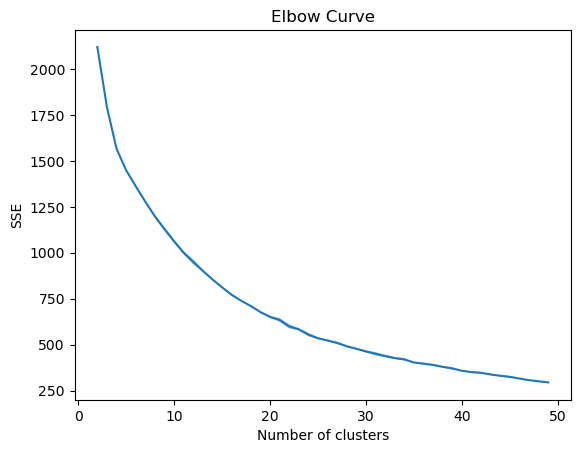

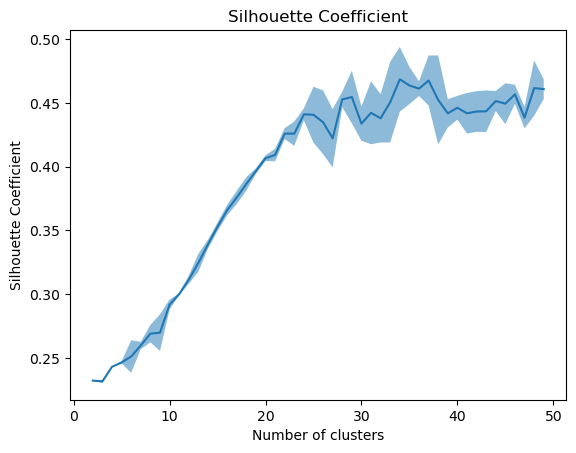

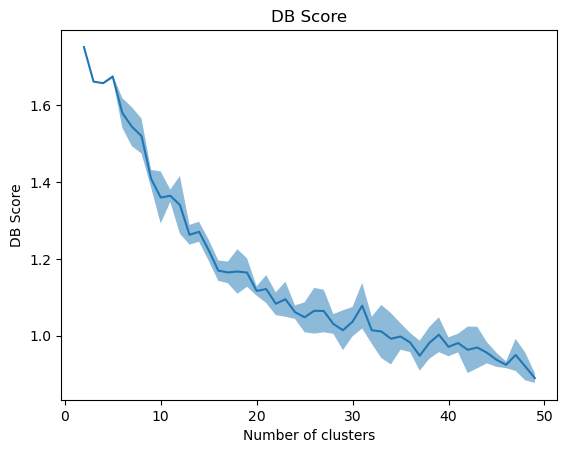

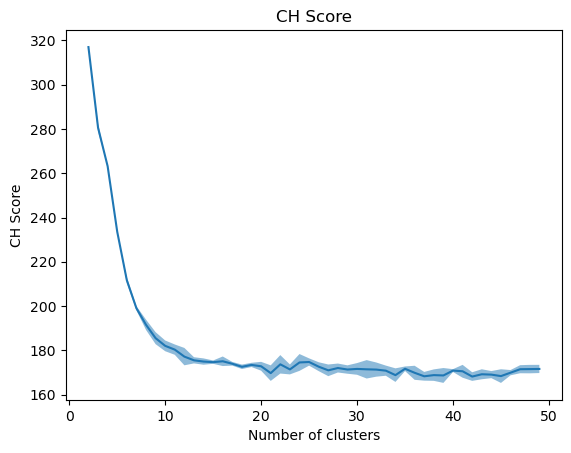

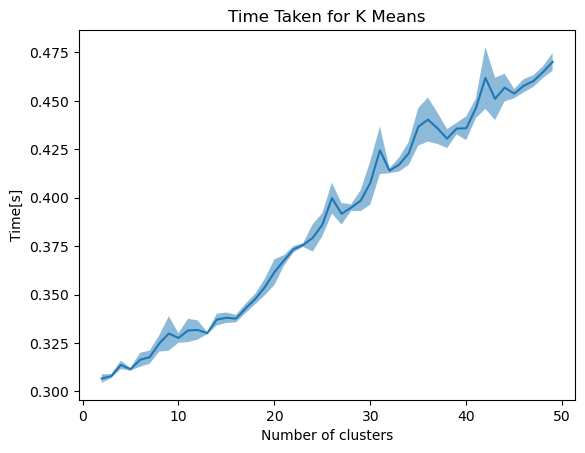

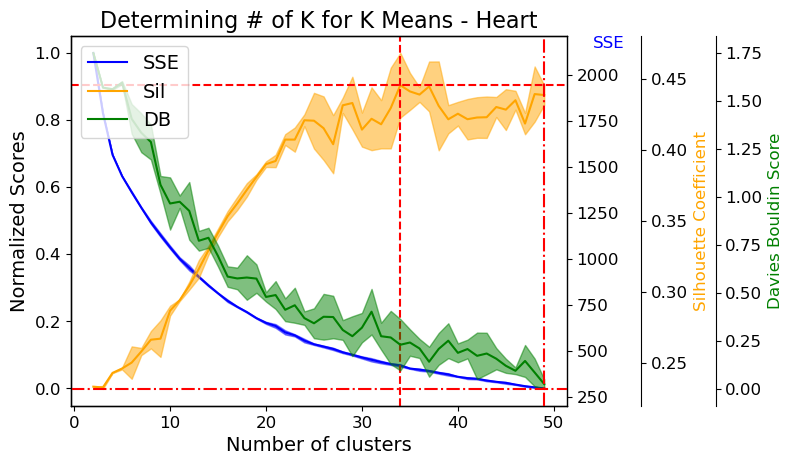

Silhoutte Score Max : 34
DB Score Min : 49
Wall time: 1min 41s


In [37]:
%%time
## Now lets do for the heart disease dataset
df_cluster_time_kmeans_heart = k_means(X_heart_std,'Heart')

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

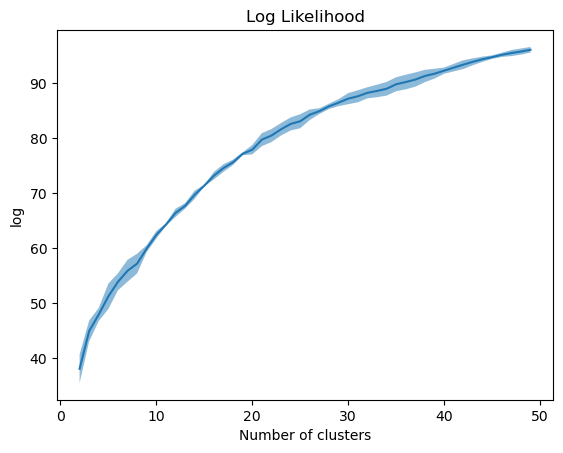

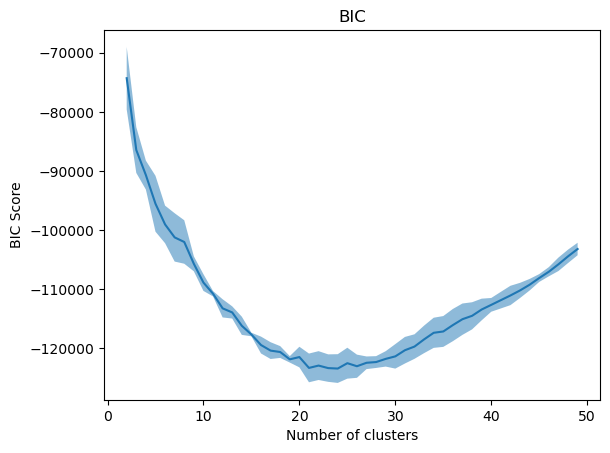

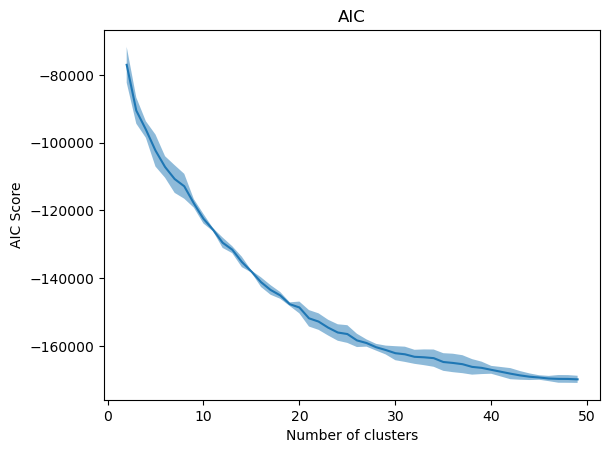

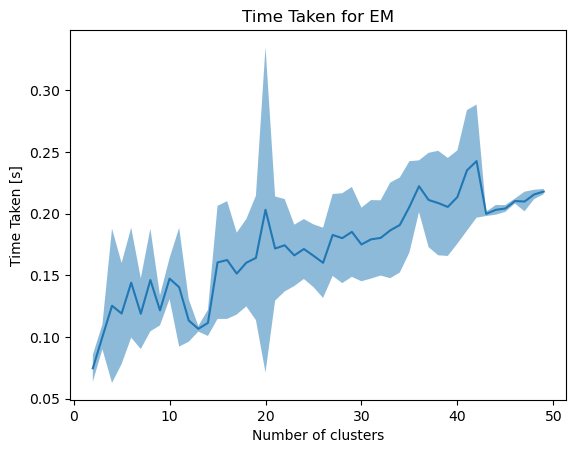

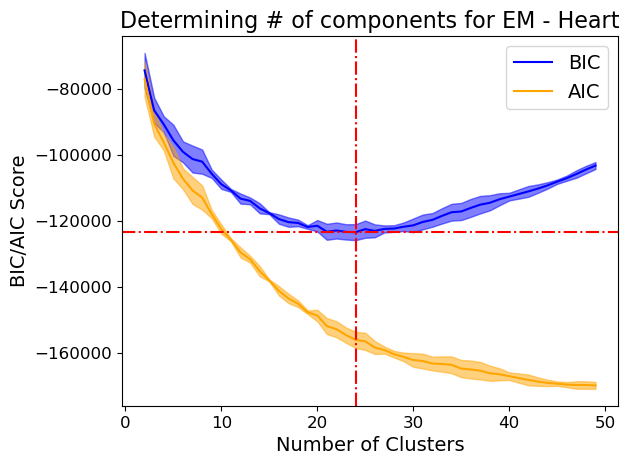

Wall time: 50.5 s


In [38]:
%%time
df_cluster_time_gmm_heart = gmm_graphs(X_heart_std,'Heart')

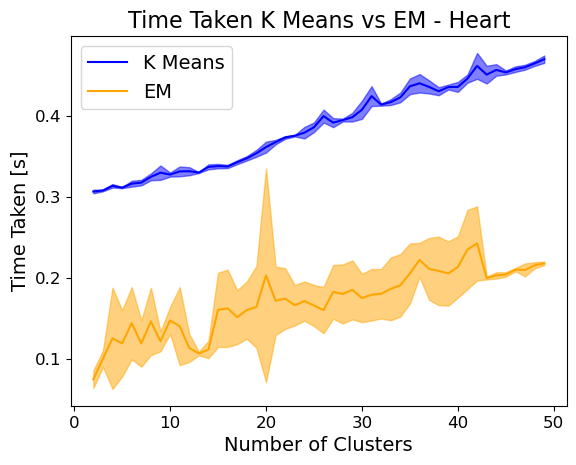

In [39]:
# Compare timings
df_cluster_time
df_cluster_time_gmm
plt.plot(df_cluster_time_kmeans_heart['Cluster'],df_cluster_time_kmeans_heart['Mean'], color ='b',label='K Means')
plt.fill_between(df_cluster_time_kmeans_heart['Cluster'], df_cluster_time_kmeans_heart['Mean']+df_cluster_time_kmeans_heart['Std'],df_cluster_time_kmeans_heart['Mean']-df_cluster_time_kmeans_heart['Std'], alpha=0.5, color ='b')
plt.plot(df_cluster_time_gmm_heart['Cluster'],df_cluster_time_gmm_heart['Mean'], color ='orange',label='EM')
plt.fill_between(df_cluster_time_gmm_heart['Cluster'], df_cluster_time_gmm_heart['Mean']+df_cluster_time_gmm_heart['Std'],df_cluster_time_gmm_heart['Mean']-df_cluster_time_gmm_heart['Std'], alpha=0.5, color ='orange')
plt.title('Time Taken K Means vs EM - Heart', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [40]:
kmeans_heart_labels = KMeans(n_clusters=34, random_state=42, max_iter = 1000).fit_predict(X_heart_std)
gmm_heart_labels = GaussianMixture(n_components=23, random_state=42, max_iter = 1000).fit_predict(X_heart_std)

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


In [41]:
# Now do clustering
tsne = TSNE(n_components=2, random_state=42)
X_2d_heart = tsne.fit_transform(X_heart_std)

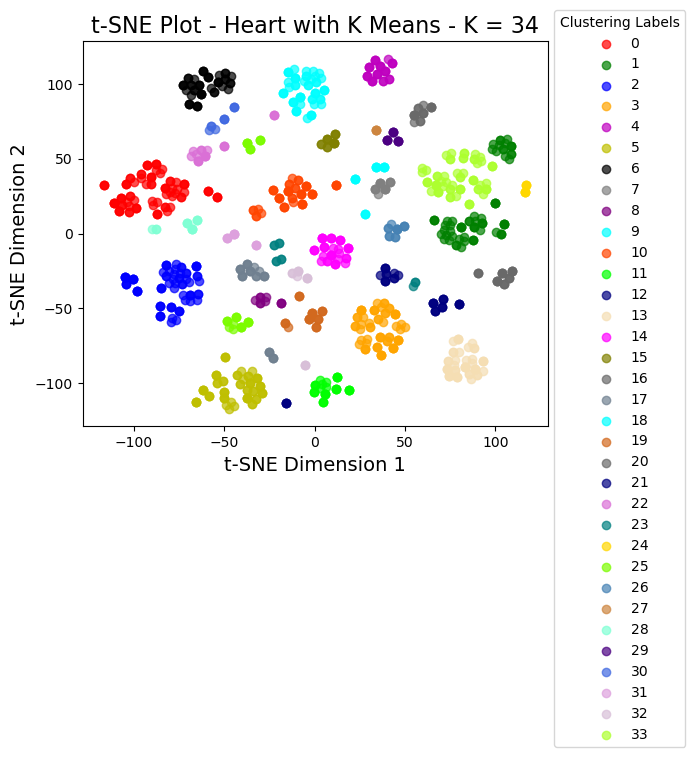

In [42]:
y = kmeans_heart_labels
target_ids = range(0, 35)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow'
         ]

# 'y', 'k', 'grey', 'orange', 'purple'

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels)):
    plt.scatter(X_2d_heart[y == i, 0], X_2d_heart[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with K Means - K = 34', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

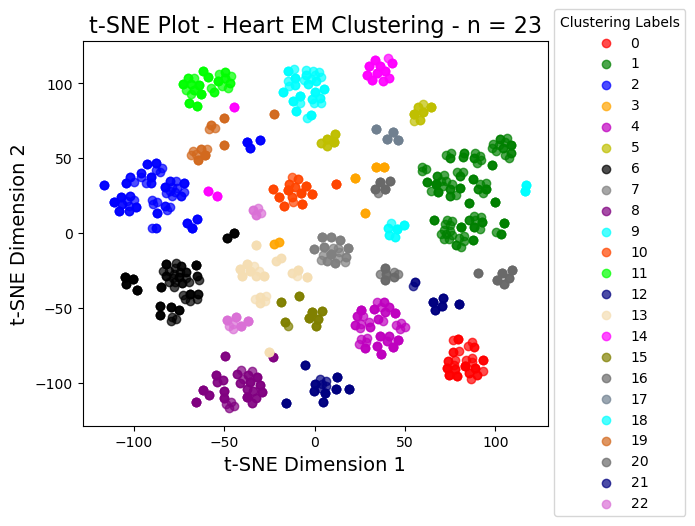

In [43]:
y = gmm_heart_labels
target_ids = range(0, 23)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow'
         ]

# 'y', 'k', 'grey', 'orange', 'purple'

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels)):
    plt.scatter(X_2d_heart[y == i, 0], X_2d_heart[y == i, 1], c = c, label=label, alpha =0.7)
plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart EM Clustering - n = 23', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

## Dimensionality Reduction

In [67]:
# PCA
def run_PCA(X,title):
    
    pca = PCA(random_state=42).fit(X) 
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    cumulative_variance_df = pd.DataFrame(cumulative_variance,columns=['Cumulative Variance'])
    cumulative_variance_df['Variance'] = pca.explained_variance_ratio_
    cumulative_variance_df['Eigenvalues'] = pca.singular_values_
    cumulative_variance_df['PC']= cumulative_variance_df.index+1
    
    # We also want to be able to get the number of clusters that explains 90% variance    
    fig, ax1 = plt.subplots()
    ax1.plot(cumulative_variance_df['PC'], cumulative_variance_df['Cumulative Variance'], 'b')
    ax1.set_xlabel('# of Principal Components', fontsize = 14)
    ax1.set_ylabel('Cumulative Explained Variance Ratio', fontsize = 14, color ='blue')
    ax1.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    plt.axhline(y=0.9, linestyle="--", color="red")
    
    ax2 = ax1.twinx()
    ax2.plot(cumulative_variance_df['PC'], cumulative_variance_df['Eigenvalues'], 'orange')
    ax2.set_ylabel('Eigenvalues', color ='orange', fontsize = 14)
    ax2.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    
    ax3 = ax1.twinx()
    ax3.plot(cumulative_variance_df['PC'], cumulative_variance_df['Variance'], 'g')
    ax3.spines.right.set_position(("axes", 1.25))
    ax3.set_ylabel('Explained Variance Ratio', fontsize = 14, color ='green')
    ax3.tick_params(axis='both', which='major', labelsize=12)
    plt.grid(False)
    
    pca = PCA(0.9,random_state=42)
    data = pca.fit_transform(X)
    var_cluster_90 = data.shape[1]
    
    # Plot the line to get the 90% variance    
    plt.axvline(x=var_cluster_90, linestyle="--", color="red")

    plt.title("PCA Explained Variance and Eigenvalues: "+ title, fontsize = 16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    fig.tight_layout()
    plt.show()
    
    return cumulative_variance, var_cluster_90


# Now for ica
def run_ICA(X,title):
    
    tmp_1 = defaultdict(dict)
    
    dims = list(range(2,X.shape[1]))
    for i in range(5):
        ica = ICA(random_state=(i)*i, max_iter = 1000, whiten=True)
        kurt = []

        for dim in dims:
            ica.set_params(n_components=dim)
            tmp = ica.fit_transform(X)
            tmp = pd.DataFrame(tmp)
            tmp = tmp.kurt(axis=0)
            kurt.append(tmp.abs().mean())
        tmp_1[i] = kurt
            
        tmp_1 = pd.DataFrame(tmp_1)
            
    
    
    plt.figure()
    plt.title("ICA Kurtosis: "+ title)
    plt.xlabel("Independent Components")
    plt.ylabel("Average Kurtosis")
    plt.plot(dims, kurt, 'b')
    
    max_kurt = max(kurt)
    max_index_ica = kurt.index(max_kurt)
    # Need to take into account for the shift as we are starting from n = 2
    max_index_ica = max_index_ica+2
    plt.axhline(y=max_kurt, linestyle="--", color="red")
    plt.axvline(x=max_index_ica, linestyle="--", color="red")    
    
    plt.grid(False)
    plt.show()
    
    return max_index_ica, tmp_1


# The next thing we gotta do is for the RCA 
# To determine what is the optimal # of components for RCA, we need to get the reconstruction error
# We are looking at having a reconstruction error of less than 10% and thus a mean construction correlation of 90%

# We need to run this for 5 times to average out effects due to stochasticity

def run_RCA(X,title):
    
    dims = list(range(1,X.shape[1]+1))
    tmp = defaultdict(dict)

    for i,dim in product(range(5),dims):
        # Get the reconstruction loss
        rp = RCA(random_state=(i)*i, n_components=dim).fit(X)
        X_train_ica = rp.transform(X)
        X_projected = rp.inverse_transform(X_train_ica)
        tmp[dim][i] = r2_score(X,X_projected)
        
    tmp = pd.DataFrame(tmp).T
    tmp['Mean'] = tmp.mean(axis=1)    
    tmp['Std'] = tmp.std(axis=1)
    
    # Get the 90% threshold
    correlation_90 = tmp[tmp['Mean']>0.9][0].index[0]
    
    plt.figure()
    plt.plot(dims,tmp['Mean'], 'b')
    plt.xlabel('# of Random Components', fontsize=14)
    plt.ylabel('Mean Reconstruction Correlation', fontsize=14)
    plt.fill_between(dims, tmp['Mean']+tmp['Std'],tmp['Mean']-tmp['Std'], alpha=0.5)
    plt.tick_params('y')
    plt.grid(False)
    
    plt.axhline(y=0.9, linestyle="--", color="red")
    plt.axvline(x=correlation_90, linestyle="--", color="red")  

    plt.title("Randomized Projection - Average of 5 runs: "+ title, fontsize=16)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tight_layout()
    plt.show()
    
    return correlation_90

# Do for randomized forests feature selection
def run_RFC(X,y,title):
    rfc = RFC(n_estimators=500,min_samples_leaf=round(len(X)*.01),random_state=42,n_jobs=-1)
    feature_importance = rfc.fit(X,y).feature_importances_ 
    feature_importance_df = pd.DataFrame(feature_importance,columns=['Feature Importance'])
    feature_importance_df.sort_values(by=['Feature Importance'],inplace=True,ascending=False)
    feature_importance_df['Cumulative Score'] = feature_importance_df['Feature Importance'].cumsum()
    feature_importance_df['Position_Index'] = feature_importance_df.index
    feature_importance_df.reset_index(drop=True, inplace=True)
    feature_importance_90_df = feature_importance_df[feature_importance_df['Cumulative Score']<=0.9]
    
    # Need to add in 1 as we start from index = 0
    correlation_90 = feature_importance_df[feature_importance_df['Cumulative Score']>=0.9].head(1).index[0]
    plt.plot(feature_importance_df.index+1,feature_importance_df['Cumulative Score'], color ='b')
    plt.axhline(y=0.9, linestyle="--", color="red")
    plt.axvline(x=correlation_90, linestyle="--", color="red")  
    plt.title('Random Forest - Feature Importance: '+title, fontsize=16)
    plt.xlabel('Number of Features', fontsize=14)
    plt.ylabel('Cumulative Feature Importance', fontsize=14)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()
    
    return feature_importance_df,feature_importance_90_df,correlation_90

In [364]:
dims = list(range(1,X_heart_std.shape[1]+1))
dims

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]

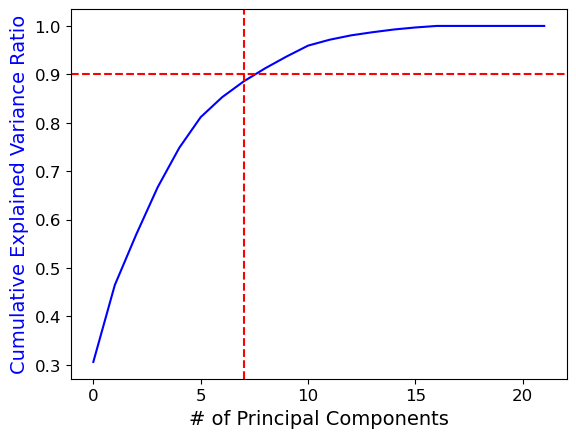

In [368]:
pca = PCA(random_state=42).fit(X_heart_std) 
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
fig, ax1 = plt.subplots()
ax1.plot(list(range(len(pca.explained_variance_ratio_))), cumulative_variance, 'b')
ax1.set_xlabel('# of Principal Components', fontsize = 14)
ax1.set_ylabel('Cumulative Explained Variance Ratio', fontsize = 14, color ='blue')
ax1.tick_params(axis='both', which='major', labelsize=12)
plt.grid(False)
plt.axhline(y=0.9, linestyle="--", color="red")
plt.axvline(x=len(cumulative_variance[cumulative_variance<=0.9])-1, linestyle="--", color="red")
plt.show()

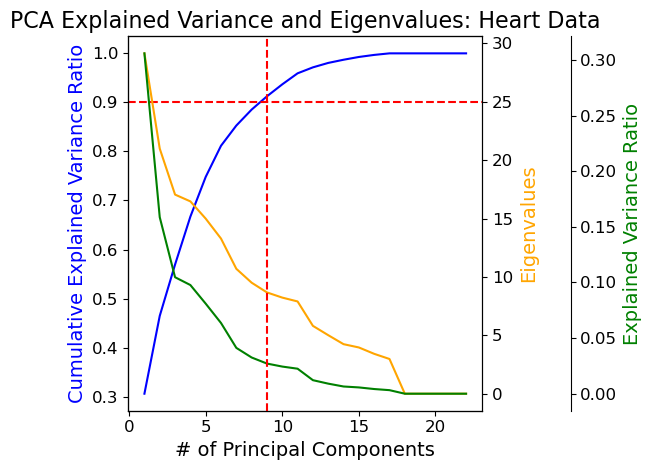

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider incre

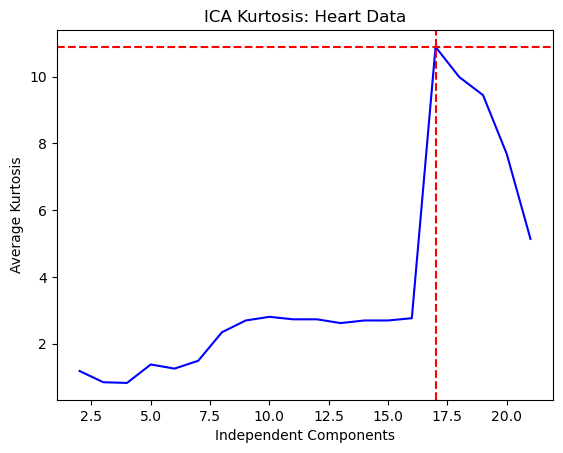

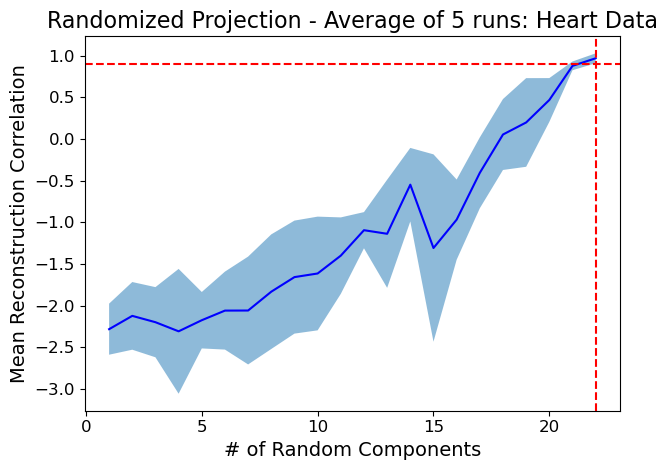

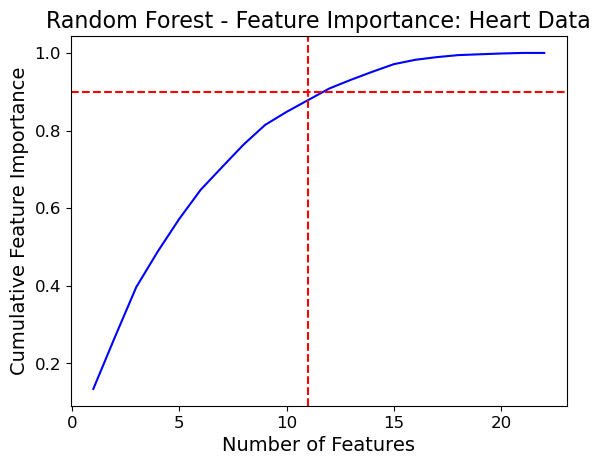

Wall time: 26.2 s


In [68]:
%%time
# Lets do some dimensionality reduction
cumulative_variance_heart, var_cluster_90_heart = run_PCA(X_heart_std,"Heart Data")
max_index_ica_heart,tmp_1 = run_ICA(X_heart_std,"Heart Data")
rca_correlation_80_heart = run_RCA(X_heart_std,'Heart Data')
feature_importance_df_heart,feature_importance_90_df_heart,rf_correlation_90_heart = run_RFC(X_heart_std,heart_y,'Heart Data')

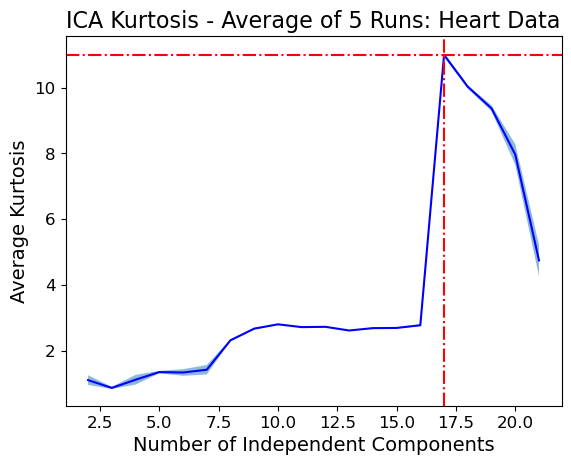

17

In [55]:
tmp_2 = pd.DataFrame(tmp_1)
tmp_2['Cluster']=tmp_2.index+2
tmp_2
tmp_2['Mean'] =  tmp_2.iloc[:, 0:4].mean(axis=1)
tmp_2['Std'] =  tmp_2.iloc[:, 0:4].std(axis=1)
tmp_2
plt.figure()
plt.plot(tmp_2['Cluster'], tmp_2['Mean'], 'b')
#plt.plot(tmp_2.index, tmp_2['Std'], 'b')
plt.fill_between(tmp_2['Cluster'], tmp_2['Mean']+tmp_2['Std'],tmp_2['Mean']-tmp_2['Std'], alpha=0.5)
plt.axhline(y=tmp_2['Mean'].max(), linestyle="-.", color="red")
plt.axvline(x=tmp_2['Mean'].idxmax()+2, linestyle="-.", color="red")
plt.title('ICA Kurtosis - Average of 5 Runs: Heart Data', fontsize=16)
plt.xlabel('Number of Independent Components', fontsize=14)
plt.ylabel('Average Kurtosis', fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()
tmp_2['Mean'].idxmax()+2

[Text(0, 0, 'thal_type_2'),
 Text(1, 0, 'cp_type_0'),
 Text(2, 0, 'ca'),
 Text(3, 0, 'oldpeak'),
 Text(4, 0, 'thal_type_3'),
 Text(5, 0, 'thalach'),
 Text(6, 0, 'exang_yes'),
 Text(7, 0, 'age'),
 Text(8, 0, 'exang_no'),
 Text(9, 0, 'chol'),
 Text(10, 0, 'slope')]

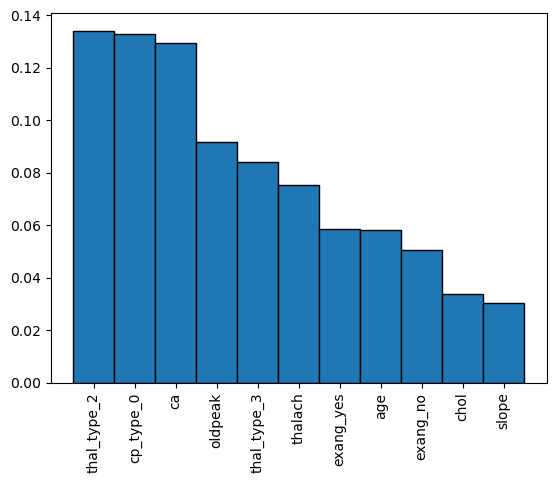

In [71]:
feature_heart_rf = heart_X_reduced_encoded.iloc[:,list(feature_importance_90_df_heart['Position_Index'])]
# Get the feature score for the columns
feature_list_rf_heart = pd.DataFrame(data = feature_heart_rf.columns, columns =['Feature Name'])
feature_importance_90_df_heart_merged = pd.concat([feature_importance_90_df_heart,feature_list_rf_heart], axis=1)
feature_importance_90_df_heart_merged

f, ax = plt.subplots()
ax.bar(feature_importance_90_df_heart_merged.index,feature_importance_90_df_heart_merged['Feature Importance'], width=1, edgecolor= 'black')
ax.set_xticks(feature_importance_90_df_heart_merged.index)
ax.set_xticklabels(feature_importance_90_df_heart_merged['Feature Name'],rotation=90)

In [72]:
# Now lets do the k means
# Now we need to run on the k means
pca_heart = PCA(n_components = var_cluster_90_heart, random_state=42).fit_transform(X_heart_std)
ica_heart = ICA(n_components = max_index_ica_heart, random_state=42).fit_transform(X_heart_std)
rca_heart = RCA(n_components = rca_correlation_80_heart, random_state=42).fit_transform(X_heart_std)

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

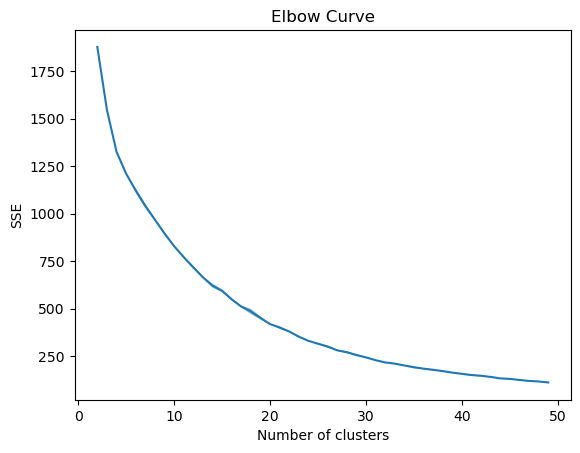

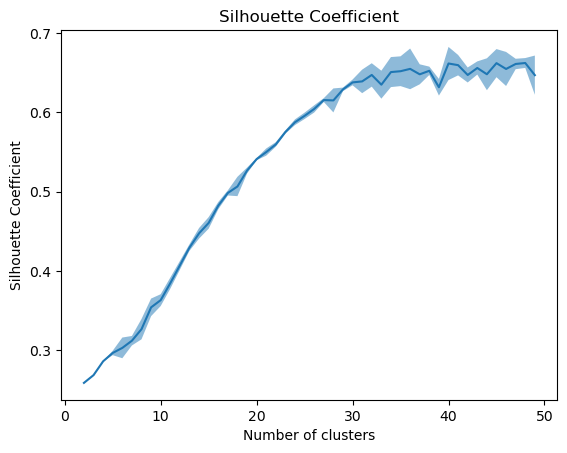

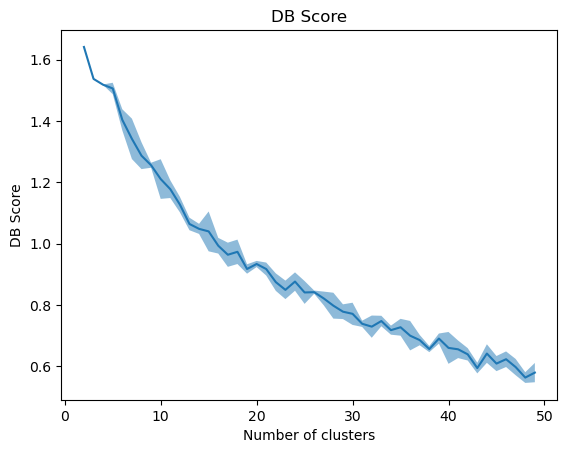

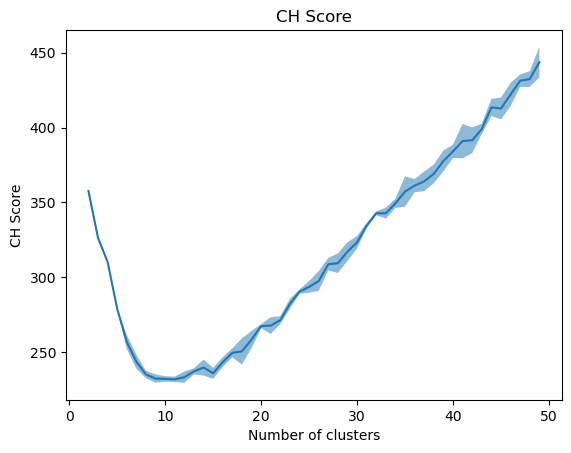

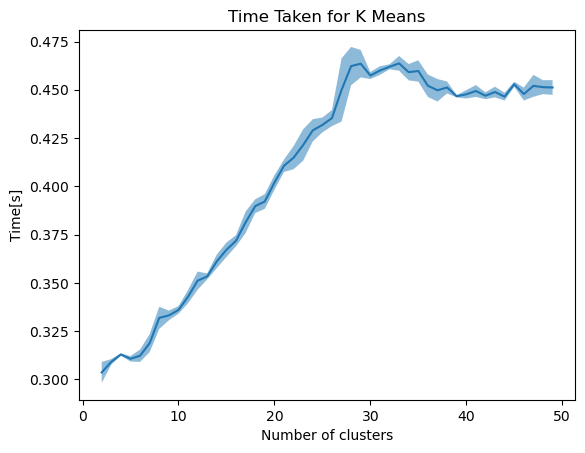

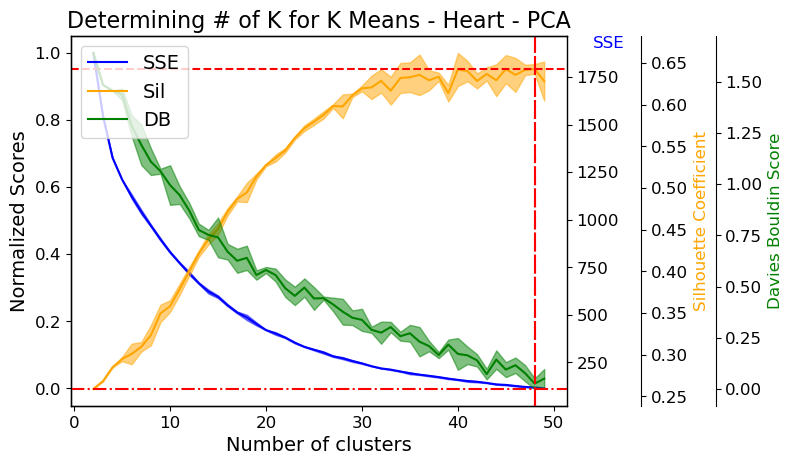

Silhoutte Score Max : 48
DB Score Min : 48


C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

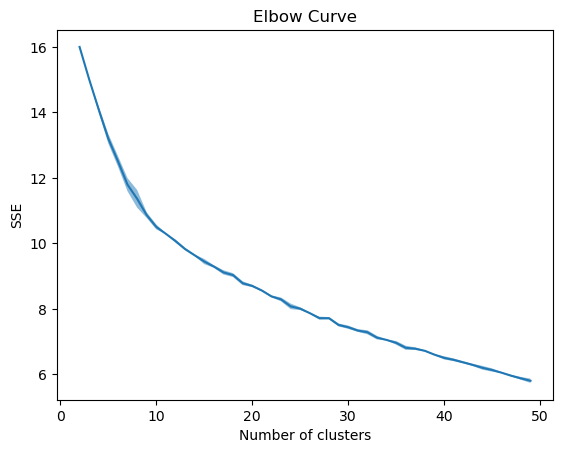

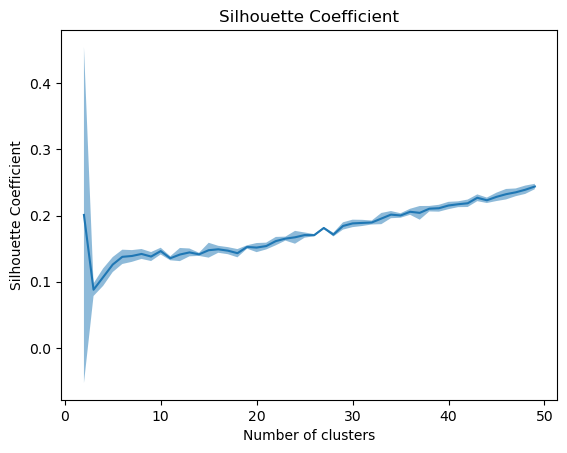

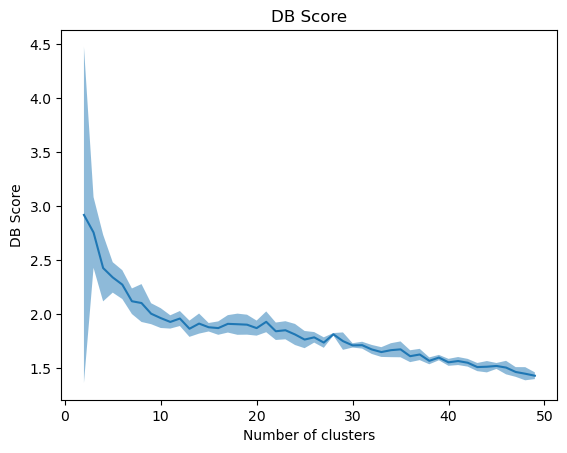

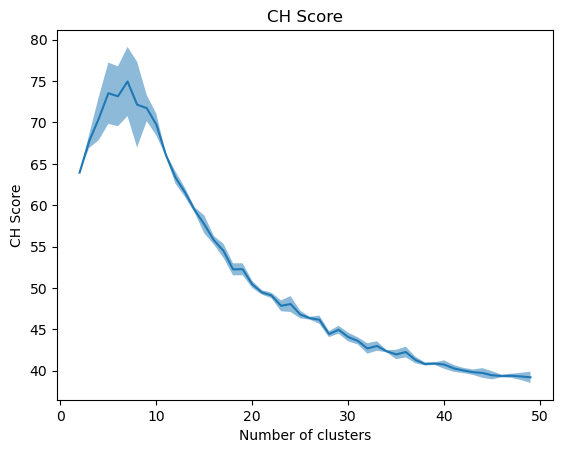

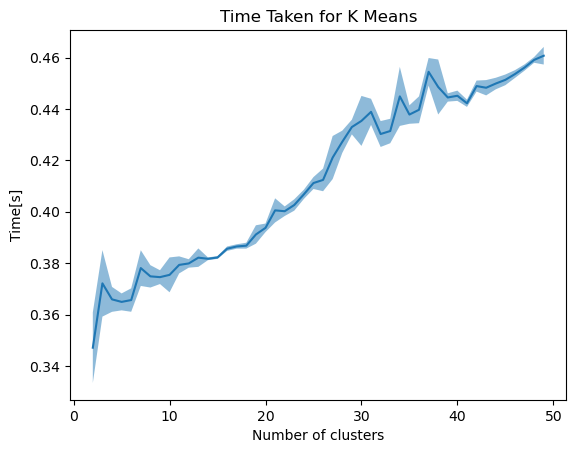

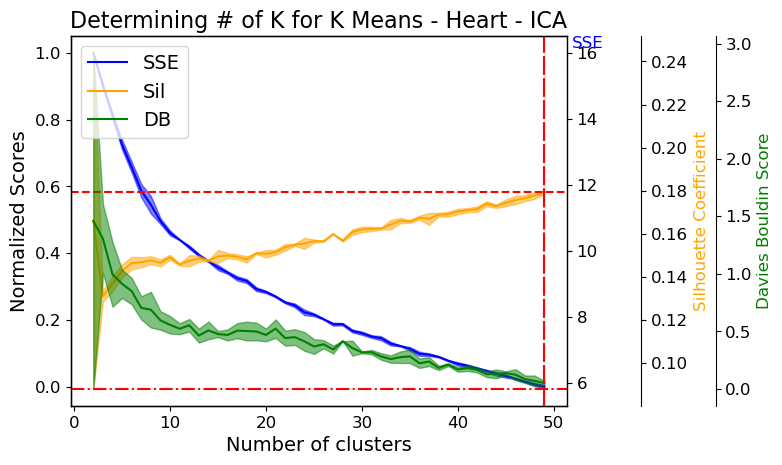

Silhoutte Score Max : 49
DB Score Min : 49


C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

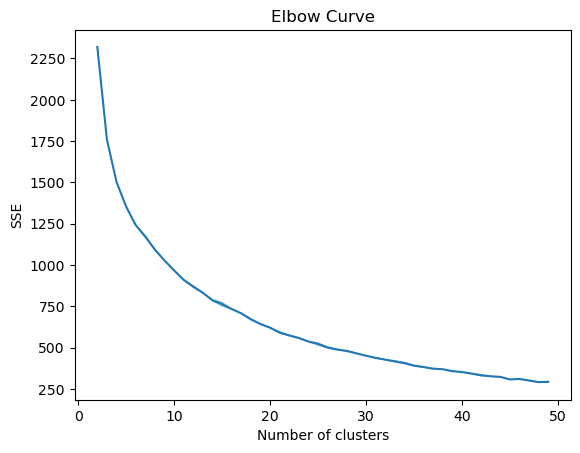

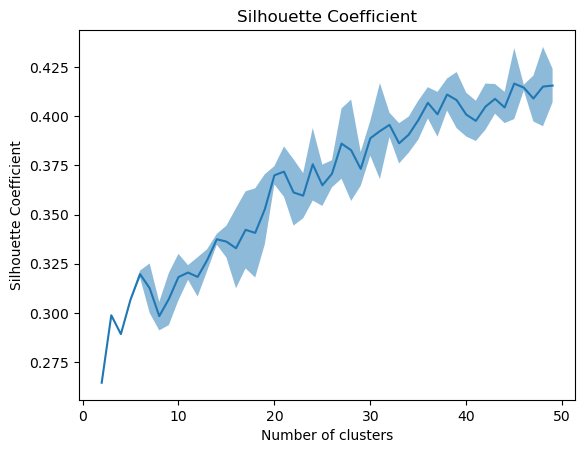

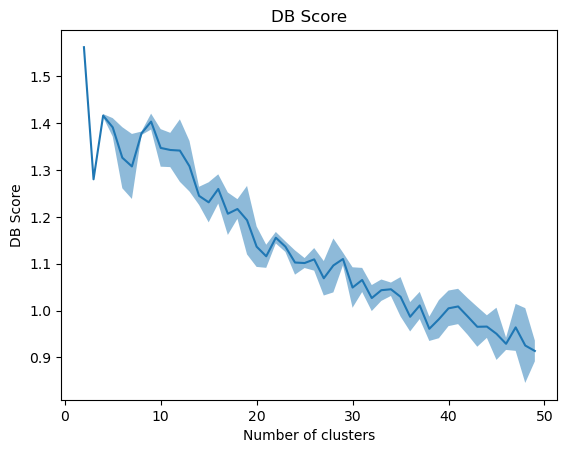

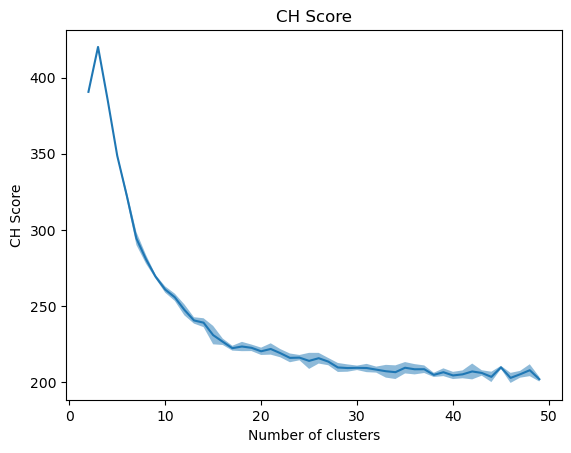

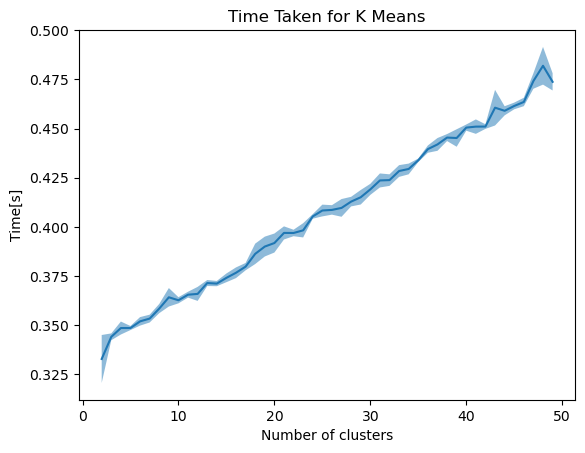

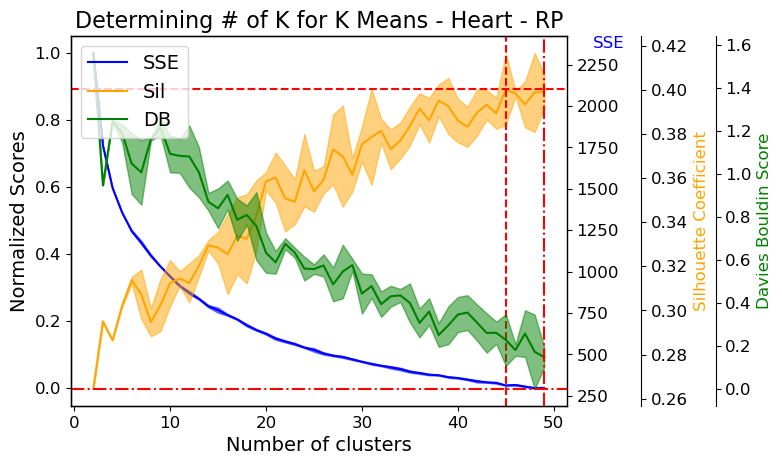

Silhoutte Score Max : 45
DB Score Min : 49


In [73]:
df_kmeans_time_heart_pca = k_means(pca_heart,'Heart - PCA')
df_kmeans_time_heart_ica = k_means(ica_heart,'Heart - ICA')
df_kmeans_time_heart_rca = k_means(rca_heart,'Heart - RP')

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

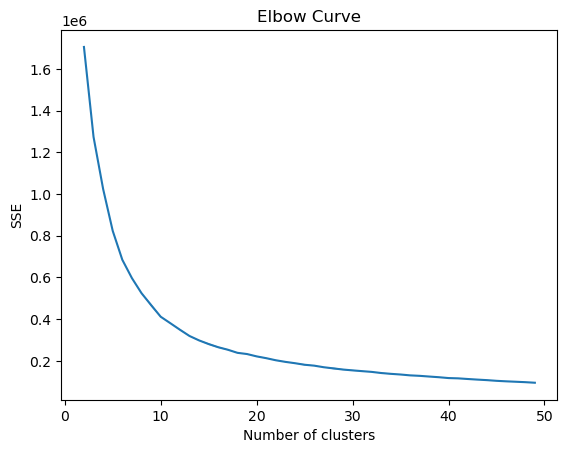

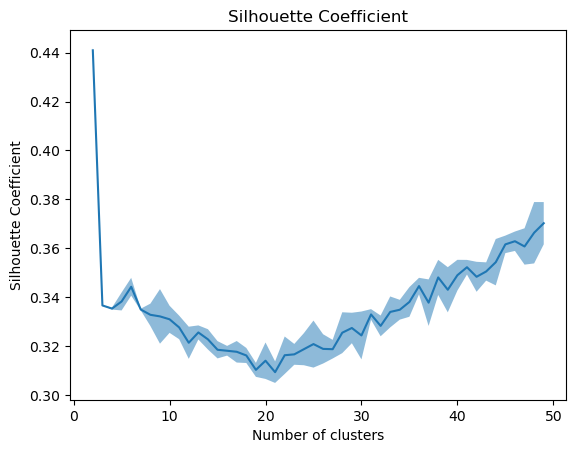

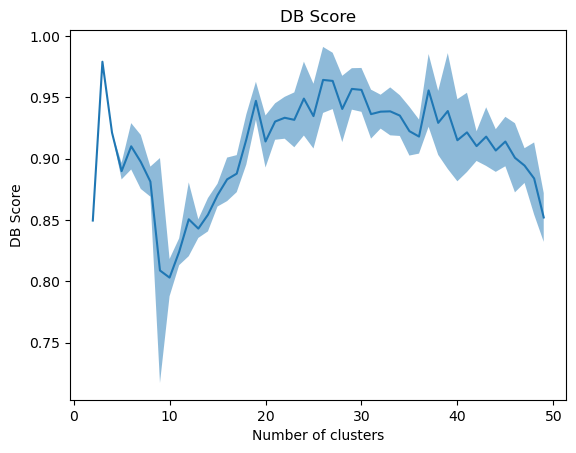

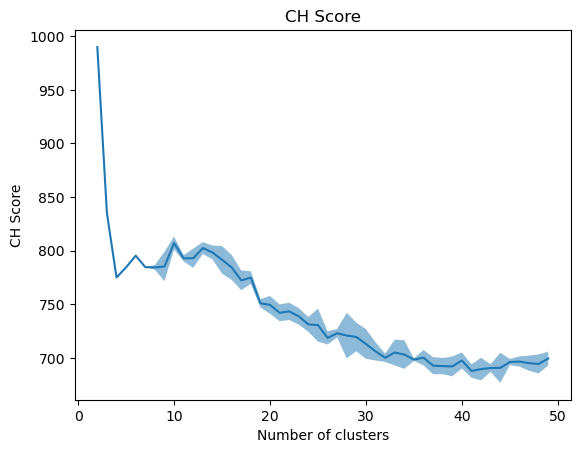

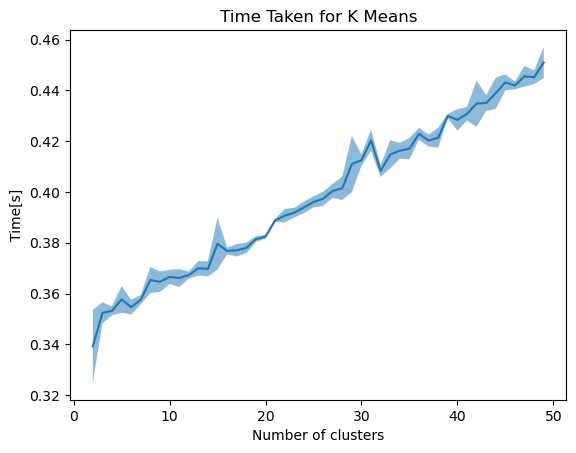

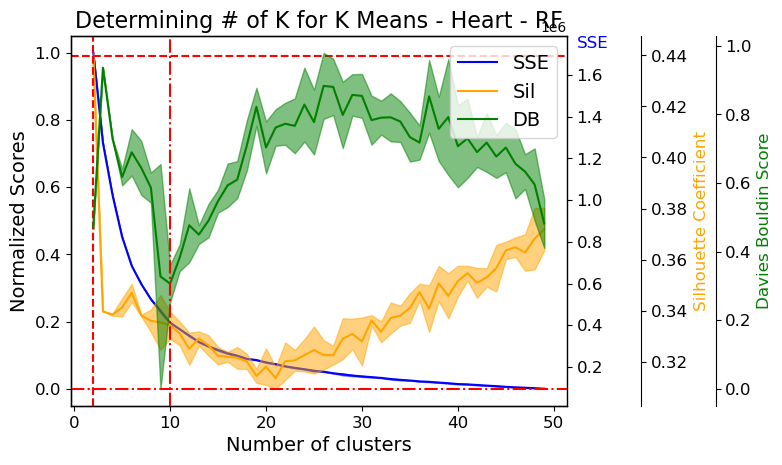

Silhoutte Score Max : 2
DB Score Min : 10


In [74]:
df_kmeans_time_heart_rf = k_means(feature_heart_rf,'Heart - RF')

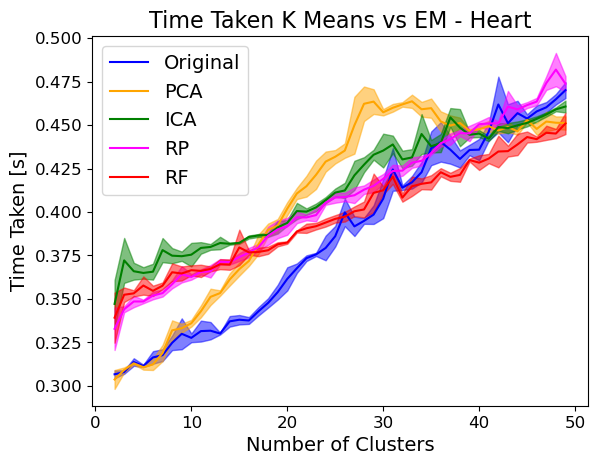

In [75]:
plt.plot(df_cluster_time_kmeans_heart['Cluster'],df_cluster_time_kmeans_heart['Mean'], color ='b',label='Original')
plt.fill_between(df_cluster_time_kmeans_heart['Cluster'], df_cluster_time_kmeans_heart['Mean']+df_cluster_time_kmeans_heart['Std'],df_cluster_time_kmeans_heart['Mean']-df_cluster_time_kmeans_heart['Std'], alpha=0.5, color ='b')

plt.plot(df_kmeans_time_heart_pca['Cluster'],df_kmeans_time_heart_pca['Mean'], color ='orange',label='PCA')
plt.fill_between(df_kmeans_time_heart_pca['Cluster'], df_kmeans_time_heart_pca['Mean']+df_kmeans_time_heart_pca['Std'],df_kmeans_time_heart_pca['Mean']-df_kmeans_time_heart_pca['Std'], alpha=0.5, color ='orange')

plt.plot(df_kmeans_time_heart_ica['Cluster'],df_kmeans_time_heart_ica['Mean'], color ='green',label='ICA')
plt.fill_between(df_kmeans_time_heart_ica['Cluster'], df_kmeans_time_heart_ica['Mean']+df_kmeans_time_heart_ica['Std'],df_kmeans_time_heart_ica['Mean']-df_kmeans_time_heart_ica['Std'], alpha=0.5, color ='green')

plt.plot(df_kmeans_time_heart_rca['Cluster'],df_kmeans_time_heart_rca['Mean'], color ='magenta',label='RP')
plt.fill_between(df_kmeans_time_heart_rca['Cluster'], df_kmeans_time_heart_rca['Mean']+df_kmeans_time_heart_rca['Std'],df_kmeans_time_heart_rca['Mean']-df_kmeans_time_heart_rca['Std'], alpha=0.5, color ='magenta')

plt.plot(df_kmeans_time_heart_rf['Cluster'],df_kmeans_time_heart_rf['Mean'], color ='red',label='RF')
plt.fill_between(df_kmeans_time_heart_rf['Cluster'], df_kmeans_time_heart_rf['Mean']+df_kmeans_time_heart_rf['Std'],df_kmeans_time_heart_rf['Mean']-df_kmeans_time_heart_rf['Std'], alpha=0.5, color ='red')


plt.title('Time Taken K Means vs EM - Heart', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [76]:
kmeans_heart_labels_pca = KMeans(n_clusters=50, random_state=42, max_iter = 1000).fit_predict(pca_heart)
kmeans_heart_labels_ica = KMeans(n_clusters=50, random_state=42, max_iter = 1000).fit_predict(ica_heart)
kmeans_heart_labels_rca = KMeans(n_clusters=50, random_state=42, max_iter = 1000).fit_predict(rca_heart)
kmeans_heart_labels_rf = KMeans(n_clusters=2, random_state=42, max_iter = 1000).fit_predict(feature_heart_rf)

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

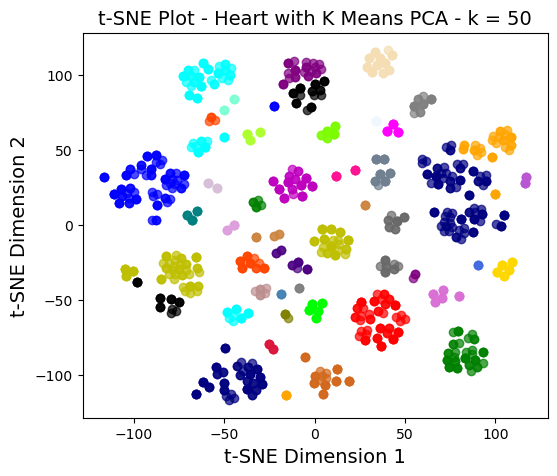

In [77]:
tsne = TSNE(n_components=2, random_state=42)
X_2d = tsne.fit_transform(X_heart_std)

y = kmeans_heart_labels_pca
target_ids = range(0, 50)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with K Means PCA - k = 50', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

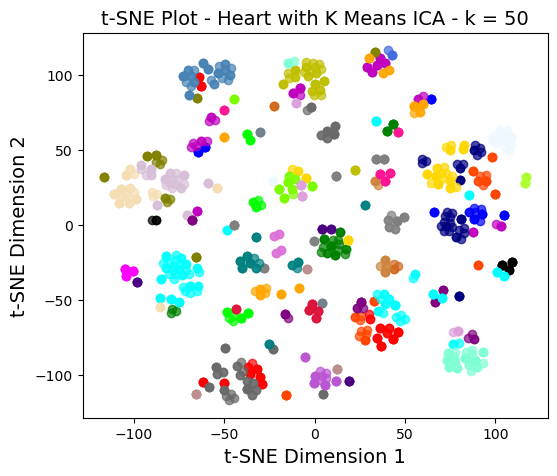

In [78]:
y = kmeans_heart_labels_ica
target_ids = range(0, 50)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels_ica)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with K Means ICA - k = 50', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

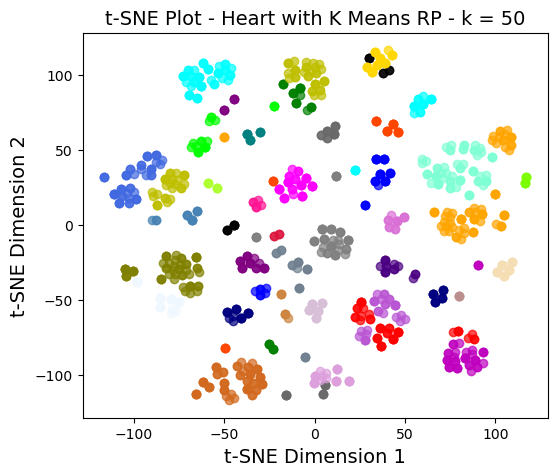

In [79]:
y = kmeans_heart_labels_rca
target_ids = range(0, 50)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels_rca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with K Means RP - k = 50', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

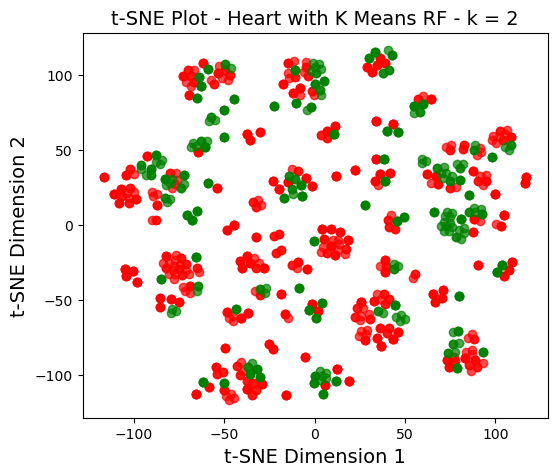

In [80]:
y = kmeans_heart_labels_rf
target_ids = range(0, 50)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
         ]

for i, c, label in zip(target_ids, colors, np.unique(kmeans_heart_labels_rf)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with K Means RF - k = 2', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

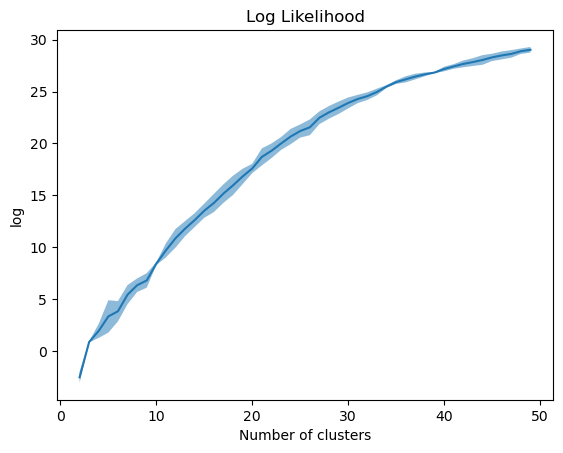

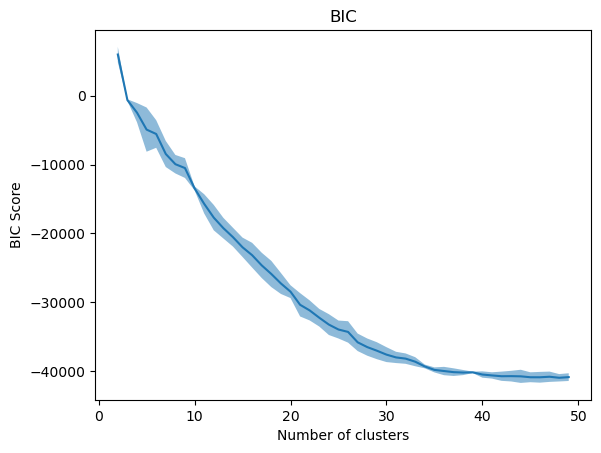

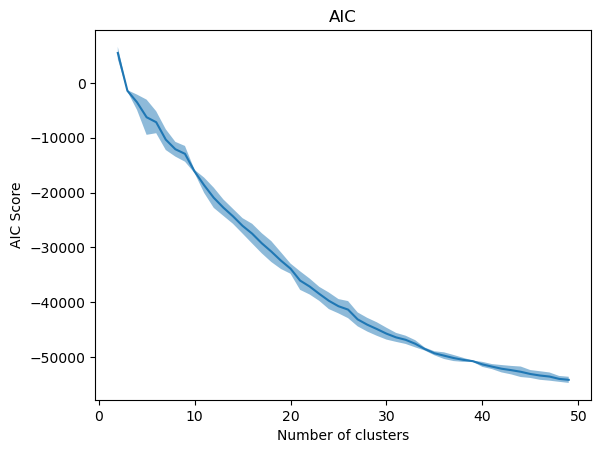

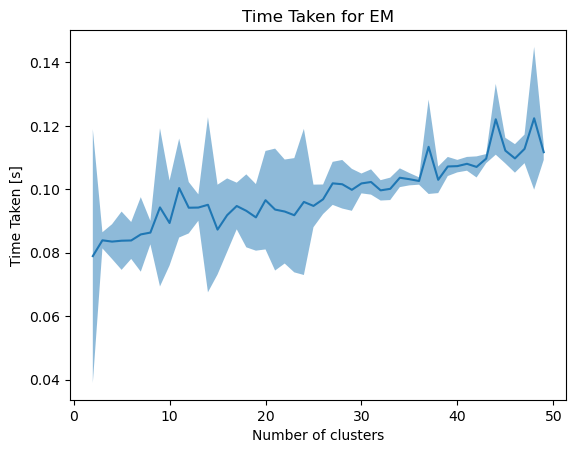

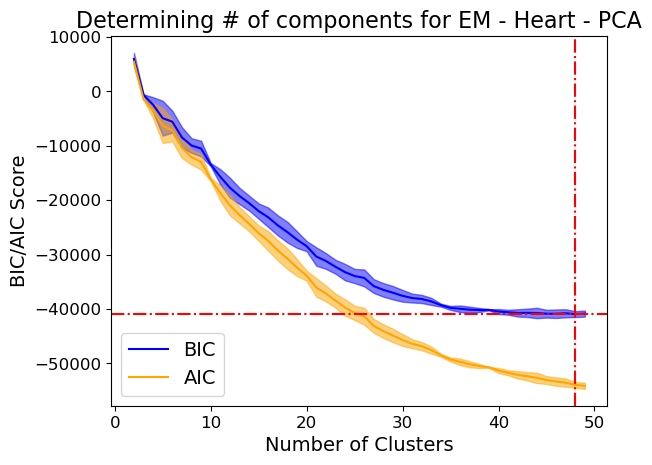

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

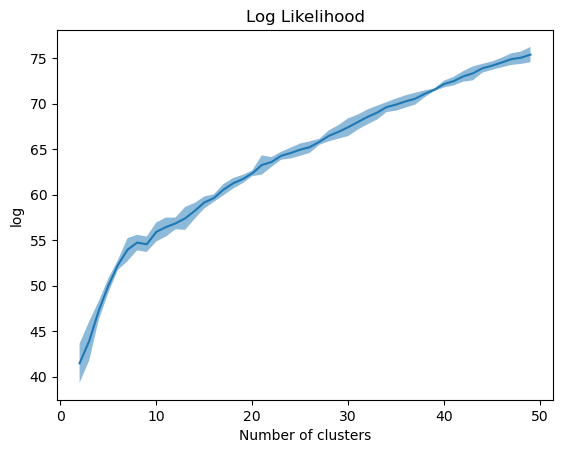

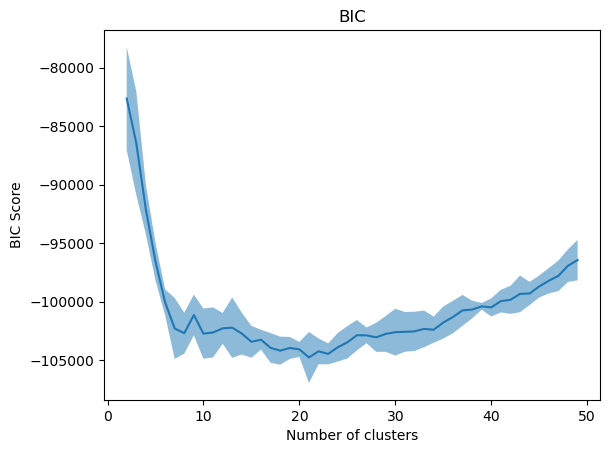

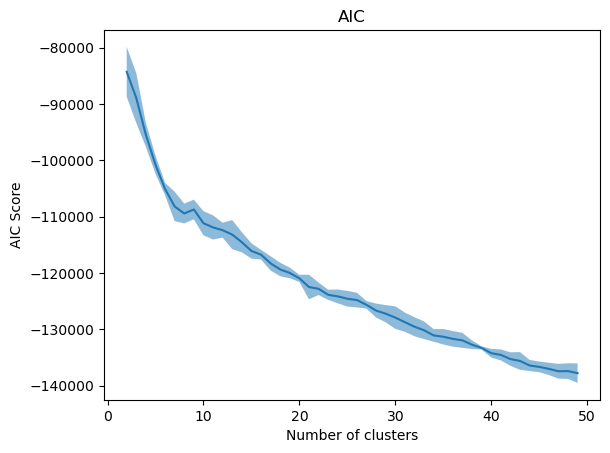

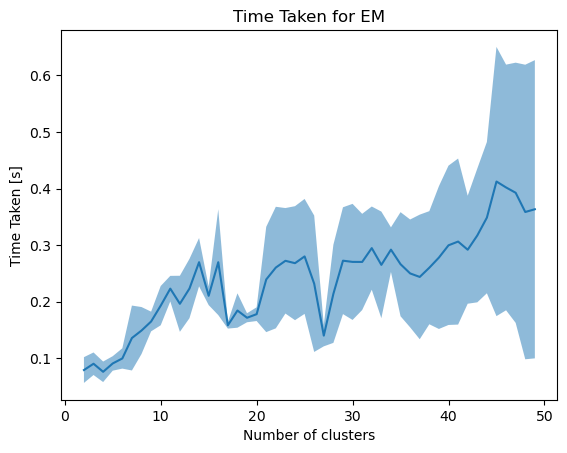

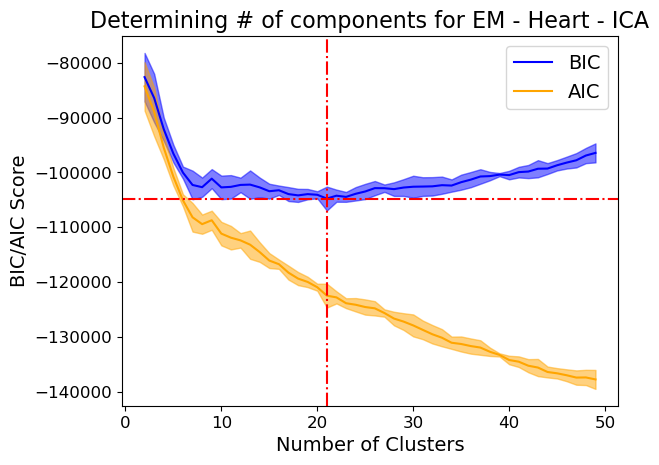

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

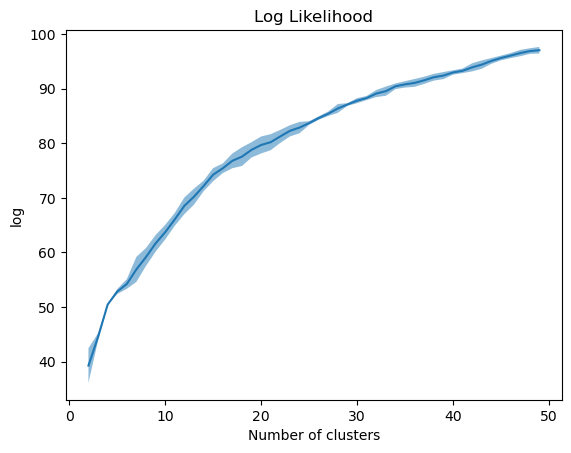

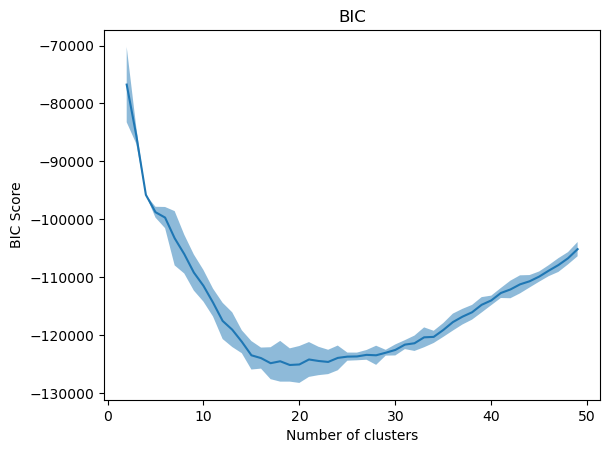

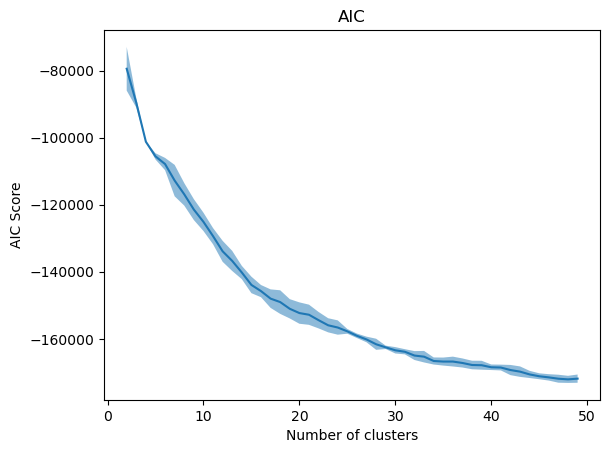

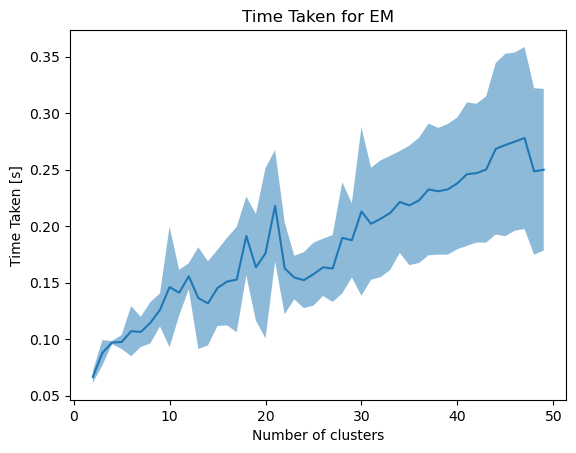

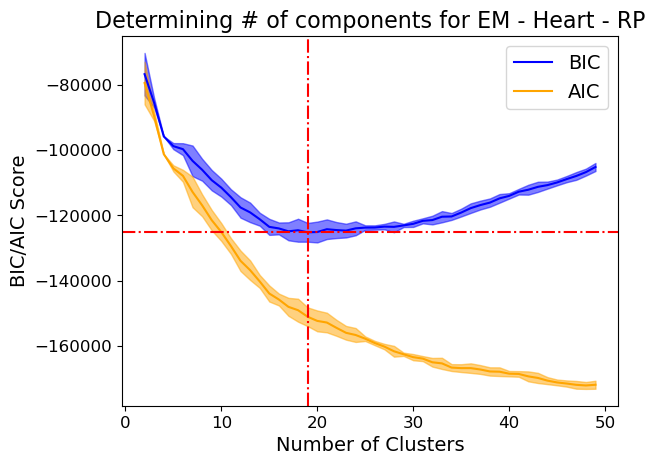

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

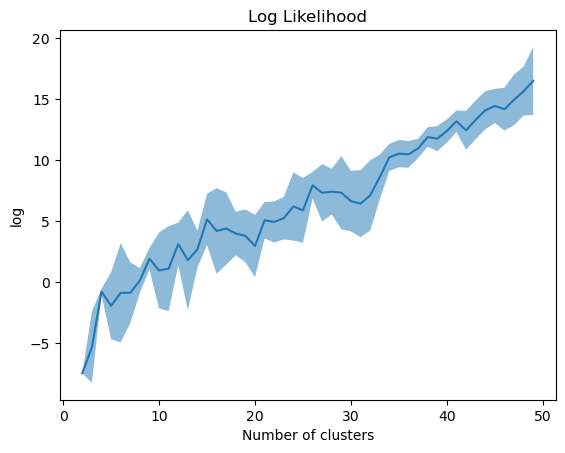

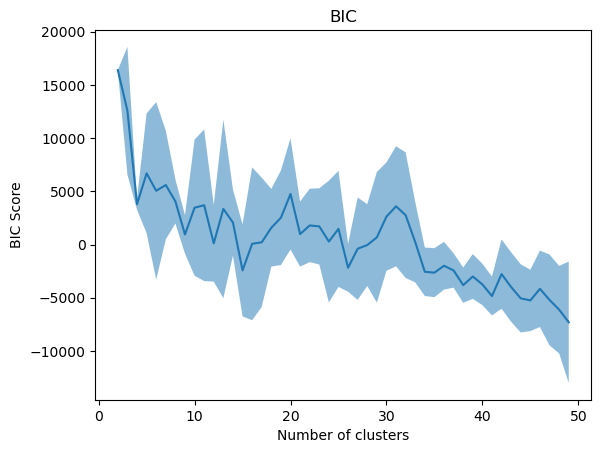

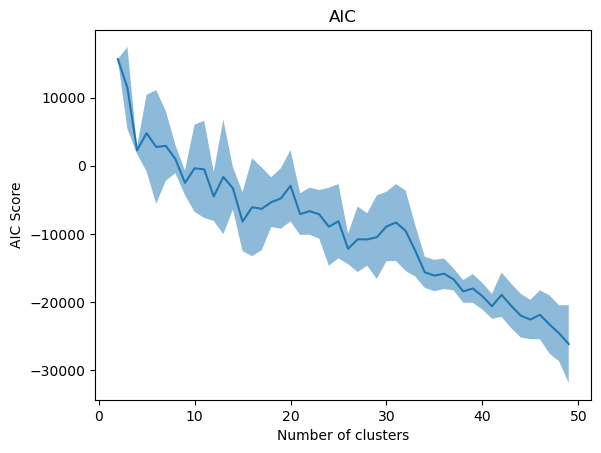

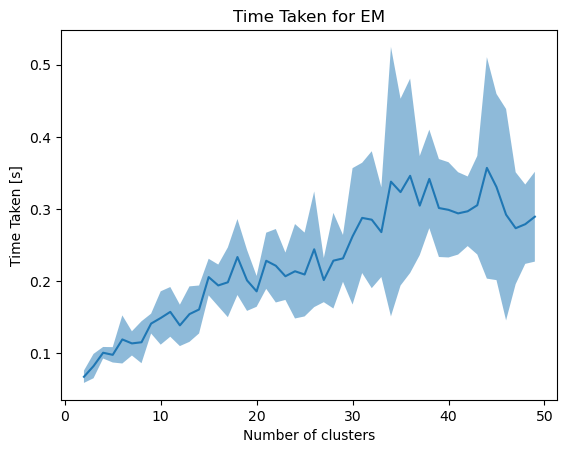

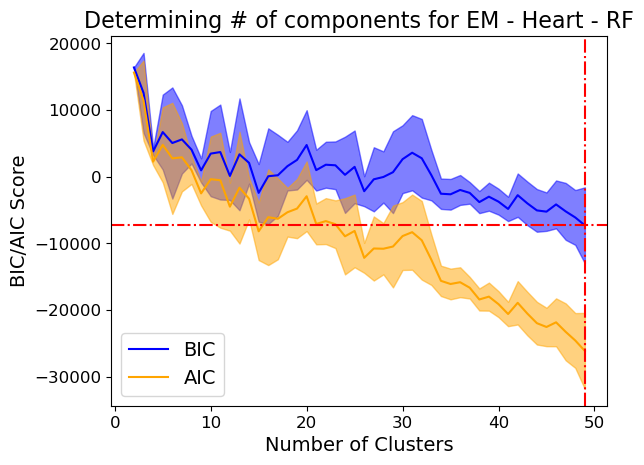

Wall time: 3min 21s


In [81]:
%%time
df_gmm_time_heart_pca =gmm_graphs(pca_heart,'Heart - PCA')
df_gmm_time_heart_ica =gmm_graphs(ica_heart,'Heart - ICA')
df_gmm_time_heart_rca =gmm_graphs(rca_heart,'Heart - RP')
df_gmm_time_heart_rf =gmm_graphs(feature_heart_rf,'Heart - RF')

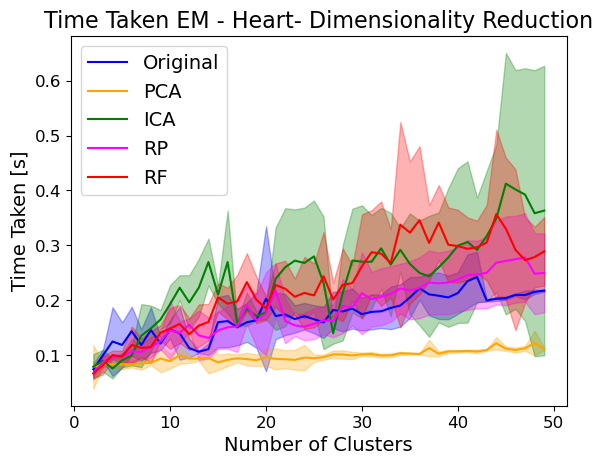

In [88]:
plt.plot(df_cluster_time_gmm_heart['Cluster'],df_cluster_time_gmm_heart['Mean'], color ='b',label='Original')
plt.fill_between(df_cluster_time_gmm_heart['Cluster'], df_cluster_time_gmm_heart['Mean']+df_cluster_time_gmm_heart['Std'],df_cluster_time_gmm_heart['Mean']-df_cluster_time_gmm_heart['Std'], alpha=0.3, color ='b')

plt.plot(df_gmm_time_heart_pca['Cluster'],df_gmm_time_heart_pca['Mean'], color ='orange',label='PCA')
plt.fill_between(df_gmm_time_heart_pca['Cluster'], df_gmm_time_heart_pca['Mean']+df_gmm_time_heart_pca['Std'],df_gmm_time_heart_pca['Mean']-df_gmm_time_heart_pca['Std'], alpha=0.3, color ='orange')

plt.plot(df_gmm_time_heart_ica['Cluster'],df_gmm_time_heart_ica['Mean'], color ='green',label='ICA')
plt.fill_between(df_gmm_time_heart_ica['Cluster'], df_gmm_time_heart_ica['Mean']+df_gmm_time_heart_ica['Std'],df_gmm_time_heart_ica['Mean']-df_gmm_time_heart_ica['Std'], alpha=0.3, color ='green')

plt.plot(df_gmm_time_heart_rca['Cluster'],df_gmm_time_heart_rca['Mean'], color ='magenta',label='RP')
plt.fill_between(df_gmm_time_heart_rca['Cluster'], df_gmm_time_heart_rca['Mean']+df_gmm_time_heart_rca['Std'],df_gmm_time_heart_rca['Mean']-df_gmm_time_heart_rca['Std'], alpha=0.3, color ='magenta')

plt.plot(df_gmm_time_heart_rf['Cluster'],df_gmm_time_heart_rf['Mean'], color ='red',label='RF')
plt.fill_between(df_gmm_time_heart_rf['Cluster'], df_gmm_time_heart_rf['Mean']+df_gmm_time_heart_rf['Std'],df_gmm_time_heart_rf['Mean']-df_gmm_time_heart_rf['Std'], alpha=0.3, color ='red')


plt.title('Time Taken EM - Heart- Dimensionality Reduction', fontsize=16)
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Time Taken [s]', fontsize = 14)
plt.legend(loc="best",prop={'size': 14})
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [83]:
gmm_heart_labels_pca = GaussianMixture(n_components=50, random_state=42, max_iter = 1000).fit_predict(pca_heart)
gmm_heart_labels_ica = GaussianMixture(n_components=21, random_state=42, max_iter = 1000).fit_predict(ica_heart)
gmm_heart_labels_rca = GaussianMixture(n_components=19, random_state=42, max_iter = 1000).fit_predict(rca_heart)
gmm_heart_labels_rf = GaussianMixture(n_components=50, random_state=42, max_iter = 1000).fit_predict(feature_heart_rf)

C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak o

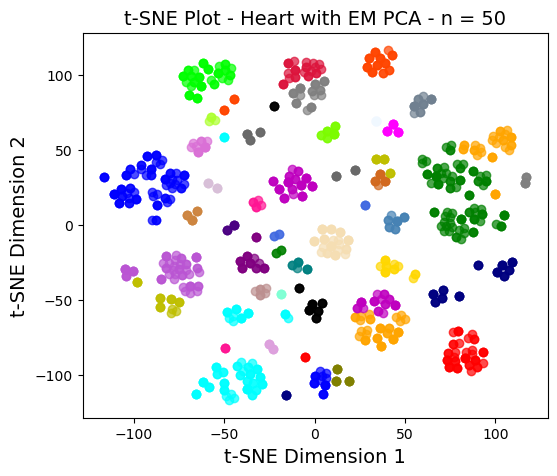

In [84]:
y = gmm_heart_labels_pca
target_ids = range(0, 52)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
         ]

for i, c, label in zip(target_ids, colors, np.unique(gmm_heart_labels_pca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with EM PCA - n = 50', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

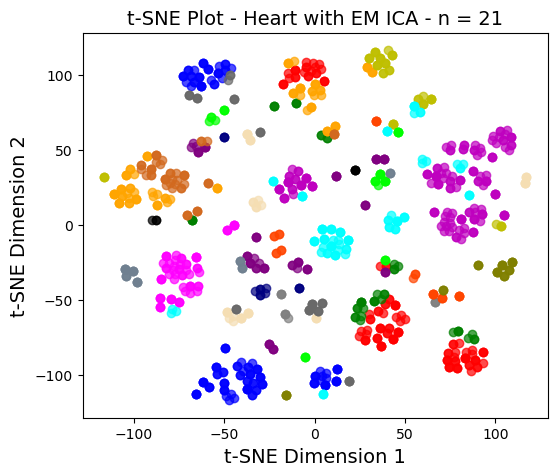

In [85]:
y = gmm_heart_labels_ica
target_ids = range(0, 52)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
         ]

for i, c, label in zip(target_ids, colors, np.unique(gmm_heart_labels_ica)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with EM ICA - n = 21', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

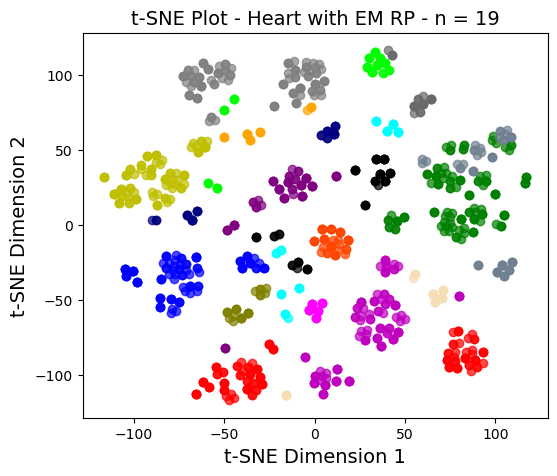

In [86]:
y = gmm_heart_labels_rca
target_ids = range(0, 52)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
         ]

for i, c, label in zip(target_ids, colors, np.unique(gmm_heart_labels_rca)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with EM RP - n = 19', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

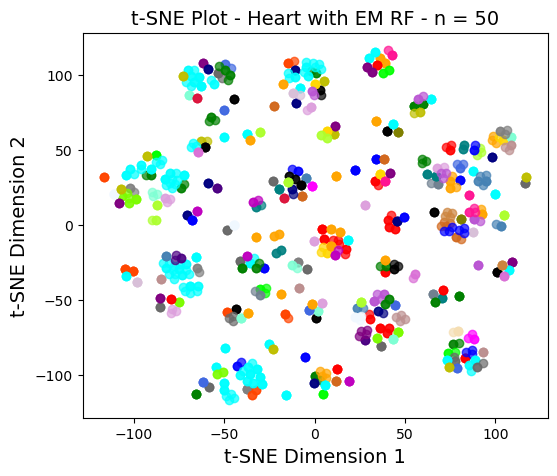

In [87]:
y = gmm_heart_labels_rf
target_ids = range(0, 52)
from matplotlib import pyplot as plt
plt.figure(figsize=(6, 5))
colors = ['r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
          'r', 'g', 'b', 'orange', 'm','y','k','grey','purple','cyan',
          'orangered','lime', 'navy','wheat','fuchsia','olive','dimgrey','slategrey','aqua',
          'chocolate','dimgrey','navy','orchid','teal','gold','lawngreen','steelblue','peru','aquamarine',
          'indigo','royalblue','plum','thistle','greenyellow','rosybrown','mediumorchid',
          'deeppink','crimson','aliceblue',
         ]

for i, c, label in zip(target_ids, colors, np.unique(gmm_heart_labels_rf)):
    plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c = c, label=label, alpha =0.7)
#plt.legend(title="Clustering Labels", bbox_to_anchor=(1, 1.1))
plt.title('t-SNE Plot - Heart with EM RF - n = 50', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

plt.show()

## Neural Network

In [89]:
X_train_heart, X_test_heart, y_train_heart, y_test_heart = train_test_split(heart_X_reduced_encoded, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )
X_train_heart_pca, X_test_heart_pca, y_train_heart_pca, y_test_heart_pca = train_test_split(pca_heart, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )
X_train_heart_ica, X_test_heart_ica, y_train_heart_ica, y_test_heart_ica = train_test_split(ica_heart, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )

X_train_heart_rca, X_test_heart_rca, y_train_heart_rca, y_test_heart_rca = train_test_split(rca_heart, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )

X_train_heart_rf, X_test_heart_rf, y_train_heart_rf, y_test_heart_rf = train_test_split(feature_heart_rf, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )

In [453]:
%%time
# Hyperparameter Tuning
def hpo(pipeline,X_train,X_test,y_train,y_test, params, cv, grid,n_iter):
    if grid == 1:
        cv_opt = GridSearchCV(pipeline,n_jobs=-1,param_grid=params,verbose=2,cv=cv,scoring='f1')
    else:
        cv_opt = RandomizedSearchCV(pipeline,n_jobs=-1,param_distributions=params,
                                    verbose=2,cv=cv,scoring='f1', n_iter =n_iter, random_state =42)
    cv_opt.fit(X_train, y_train)
    # Save the hyperparameter results into a dataframe
    HPO_Table = pd.DataFrame(cv_opt.cv_results_)
    # Train the model using best estimator and then fit onto the test data
    cv_opt.best_estimator_.fit(X_train, y_train)
    y_pred = cv_opt.best_estimator_.predict(X_test)
    pred_score_opt = f1_score(y_test, y_pred)
    print(cv_opt.best_params_)
    print('F1 Score Opt: '+ str(pred_score_opt))
    return cv_opt, HPO_Table

Wall time: 0 ns


In [454]:
%%time
hidden_layer = [(50,),(50,50,),(50,50,50),
                (100,),(100,100,),(100,100,100),
                (150,),(150,150,),(150,150,150),
                (200,),(200,200,),(200,200,200),
                (250,),(250,250,),(250,250,250),
                (300,),(300,300,),(300,300,300)]
alphas = [0.0001,0.001,0.01,0.1,0.5,1]

params_ANN= {
    'ANN__activation':['relu','logistic','tanh'],
    'ANN__alpha':alphas,
    'ANN__hidden_layer_sizes':hidden_layer,
    
}

pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, 
                         batch_size =32,
                        ))

])

ann_cv_opt_heart, ann_HPO_Table_heart = hpo(pipeline,X_train_heart,X_test_heart,y_train_heart,y_test_heart, params_ANN, 5, 1,100)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
{'ANN__activation': 'relu', 'ANN__alpha': 0.001, 'ANN__hidden_layer_sizes': (250, 250)}
F1 Score Opt: 0.9904153354632589
Wall time: 42min 52s


In [91]:
def ann_baseline_pipeline(X_train,y_train,cv, name,batch):
    pipeline_base = Pipeline([   
        ('Scale',MinMaxScaler()), 
        ('ANN',MLPClassifier(random_state=42, batch_size = batch,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
    ])

    sizes, training_scores_base, val_scores_base, fit_times_base, score_times_base = learning_curve(
        pipeline_base,
        X_train, y_train,
        cv = cv,
        scoring='f1',
        n_jobs = -1,
        train_sizes=np.linspace(0.1, 1.0, 50),
        return_times =True,
        random_state = 42
    )
    #Score
    train_mean_base = np.mean(training_scores_base, axis=1)
    val_mean_base = np.mean(val_scores_base, axis=1)
    #Timing
    fit_times_mean_base = np.mean(fit_times_base, axis=1)
    score_times_mean_base = np.mean(score_times_base, axis=1)

    ##############################################################

    
    # dotted blue line is for training scores and red line is for cross-validation score
    plt.plot(sizes, train_mean_base, '--', color="b",  label="Training score Base")
    plt.plot(sizes, val_mean_base, color="r", label="CV score Base")

    # Drawing plot
    plt.title("Learning curve for baseline ANN Classifier - "+name,fontsize = 16)
    plt.xlabel("Training Set Size"), plt.ylabel("F1 Score"), plt.legend(loc="best",prop={'size': 14})
    plt.tight_layout()
    plt.show()

    # dotted blue line is for training scores and green line is for cross-validation score
    plt.plot(sizes, fit_times_mean_base, '--', color="b",  label="Fit Time Base")
    plt.plot(sizes, score_times_mean_base, color="r", label="Score Time Base")

    # Drawing plot
    plt.title("Time Complexity for baseline ANN Classifier - "+name,fontsize = 16)
    plt.xlabel("Training Set Size"), plt.ylabel("Time Taken [s]"), plt.legend(loc="best",prop={'size': 14})
    plt.tight_layout()
    plt.show()
    
    return sizes,train_mean_base, val_mean_base, fit_times_mean_base, score_times_mean_base

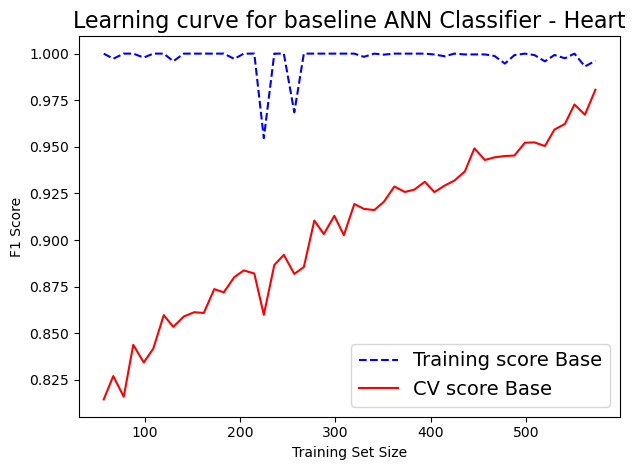

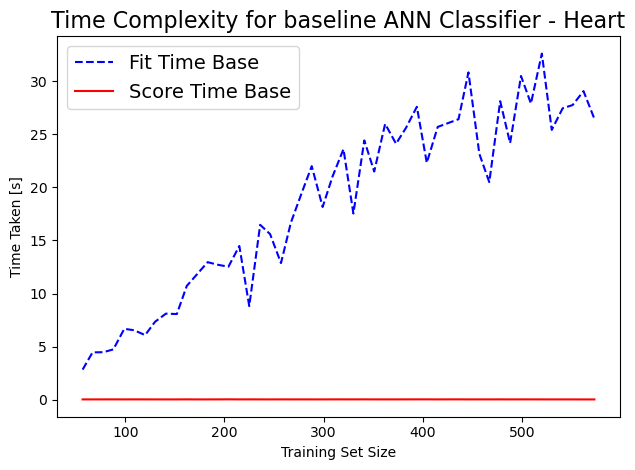

Wall time: 9min 56s


In [458]:
%%time
sizes,train_ann_heart_base, val_ann_heart_base, fit_ann_heart_base, score_ann_heart_base = ann_baseline_pipeline(X_train_heart,y_train_heart,5, 'Heart',32)


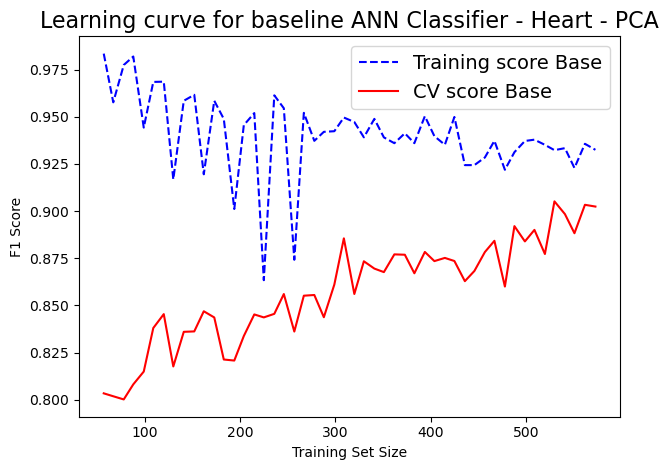

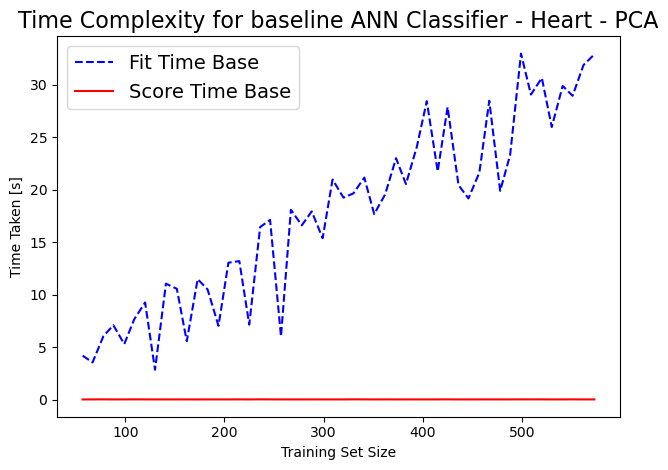

Wall time: 9min 28s


In [463]:
%%time
# For the PCA
train_ann_heart_pca, val_ann_heart_pca, fit_ann_heart_pca, score_ann_heart_pca = ann_baseline_pipeline(X_train_heart_pca,y_train_heart_pca,5, 'Heart - PCA',32)

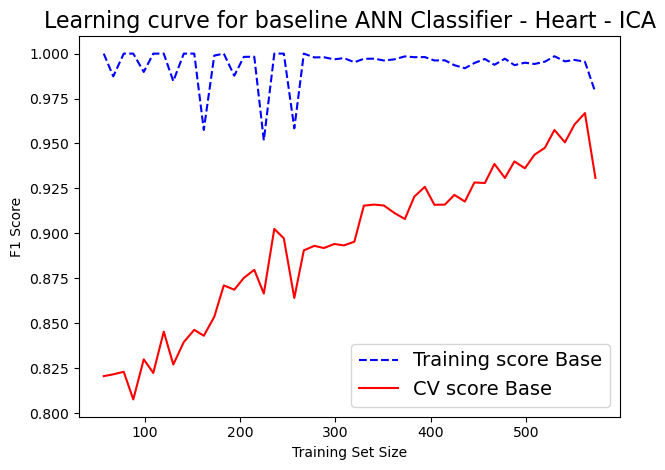

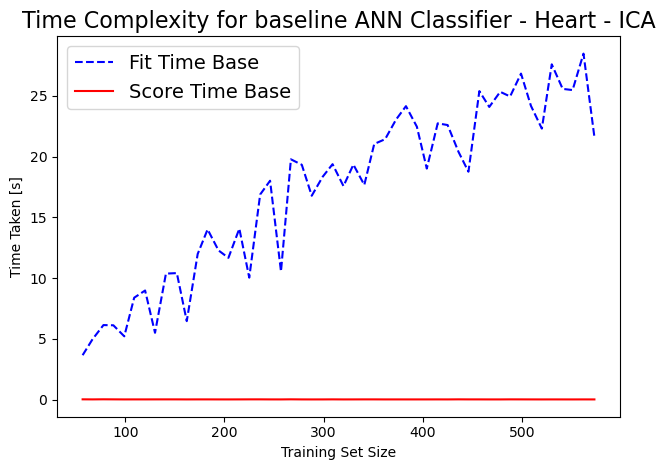

Wall time: 9min 8s


In [464]:
%%time
# For the ICA
train_ann_heart_ica, val_ann_heart_ica, fit_ann_heart_ica, score_ann_heart_ica = ann_baseline_pipeline(X_train_heart_ica,y_train_heart_ica,5, 'Heart - ICA',32)


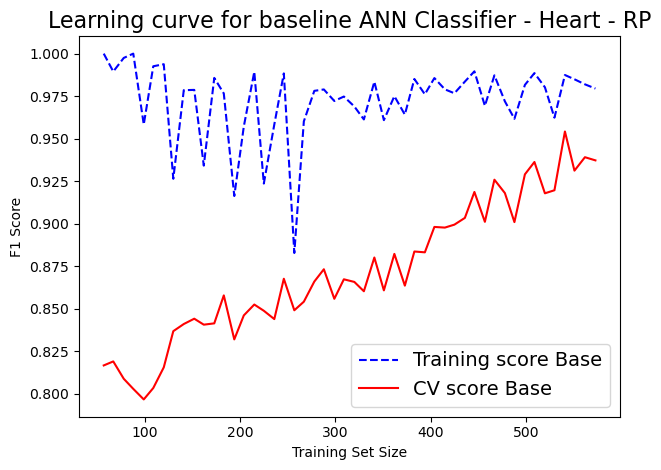

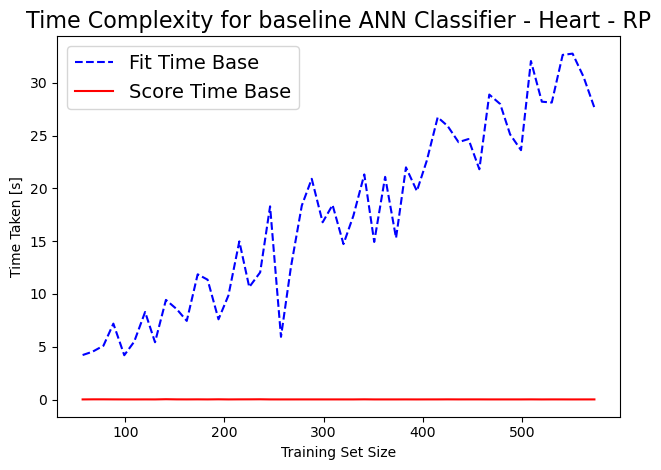

Wall time: 9min 14s


In [465]:
%%time
# For the rca
train_ann_heart_rca, val_ann_heart_rca, fit_ann_heart_rca, score_ann_heart_rca = ann_baseline_pipeline(X_train_heart_rca,y_train_heart_rca,5, 'Heart - RP',32)


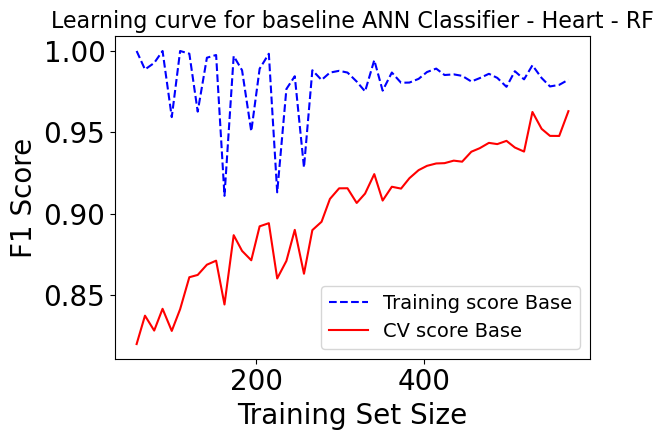

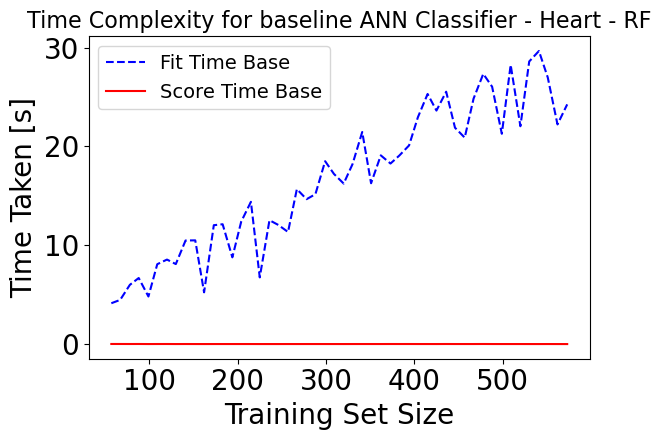

Wall time: 8min 55s


In [639]:
%%time
# For the rf
fit_sizes, train_ann_heart_rf, val_ann_heart_rf, fit_ann_heart_rf, score_ann_heart_rf = ann_baseline_pipeline(X_train_heart_rf,y_train_heart_rf,5, 'Heart - RF',32)


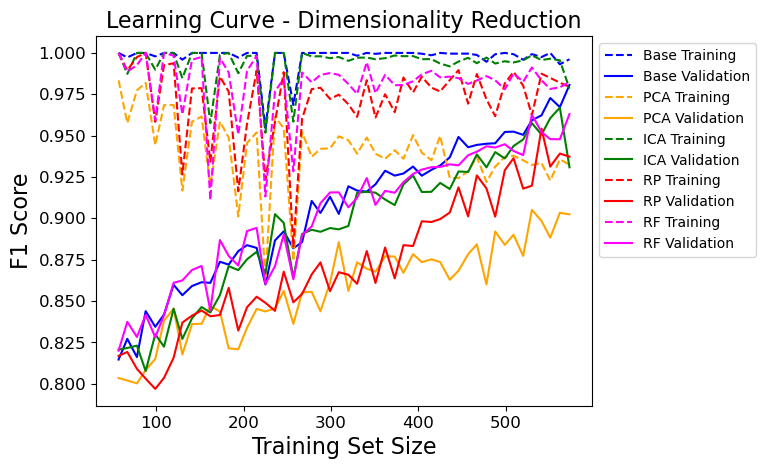

In [650]:
plt.rcParams.update({'font.size': 10})
x_learning = np.linspace(1, len(X_train_heart), num=50).astype(int)

plt.plot(fit_sizes,train_ann_heart_base,'--', color="b", label='Base Training')
plt.plot(fit_sizes,val_ann_heart_base, color="b", label='Base Validation')

plt.plot(fit_sizes,train_ann_heart_pca,'--', color="orange", label='PCA Training')
plt.plot(fit_sizes,val_ann_heart_pca, color="orange", label='PCA Validation')

plt.plot(fit_sizes,train_ann_heart_ica,'--', color="green", label='ICA Training')
plt.plot(fit_sizes,val_ann_heart_ica, color="green", label='ICA Validation')

plt.plot(fit_sizes,train_ann_heart_rca,'--', color="red", label='RP Training')
plt.plot(fit_sizes,val_ann_heart_rca, color="red", label='RP Validation')

plt.plot(fit_sizes,train_ann_heart_rf,'--', color="magenta", label='RF Training')
plt.plot(fit_sizes,val_ann_heart_rf, color="magenta", label='RF Validation')

plt.xlabel('Training Set Size', fontsize=16)
plt.ylabel('F1 Score', fontsize=16)
plt.title('Learning Curve - Dimensionality Reduction', fontsize=16)
plt.legend(bbox_to_anchor=(1, 1))
plt.tick_params(axis='both', which='major', labelsize=12)

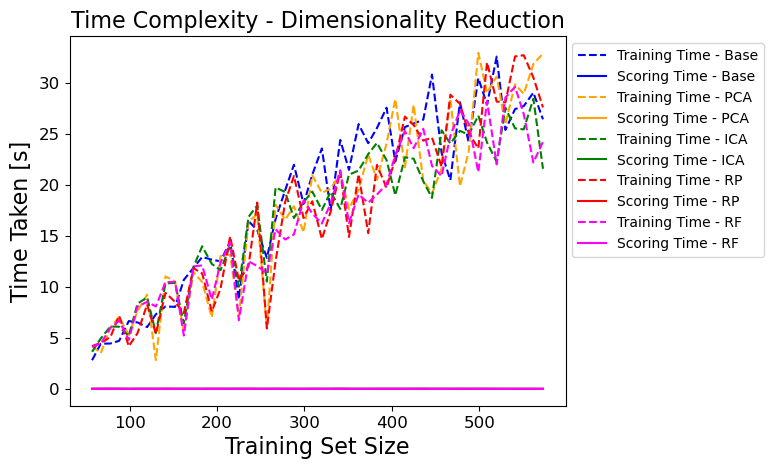

In [654]:
plt.rcParams.update({'font.size': 10})
x_learning = np.linspace(1, len(X_train_heart), num=50).astype(int)

plt.plot(fit_sizes,fit_ann_heart_base,'--', color="b", label='Training Time - Base')
plt.plot(fit_sizes,score_ann_heart_base, color="b", label='Scoring Time - Base')

plt.plot(fit_sizes,fit_ann_heart_pca,'--', color="orange", label='Training Time - PCA')
plt.plot(fit_sizes,score_ann_heart_pca, color="orange", label='Scoring Time - PCA')

plt.plot(fit_sizes,fit_ann_heart_ica,'--', color="green", label='Training Time - ICA')
plt.plot(fit_sizes,score_ann_heart_ica, color="green", label='Scoring Time - ICA')

plt.plot(fit_sizes,fit_ann_heart_rca,'--', color="red", label='Training Time - RP')
plt.plot(fit_sizes,score_ann_heart_rca, color="red", label='Scoring Time - RP')

plt.plot(fit_sizes,fit_ann_heart_rf,'--', color="magenta", label='Training Time - RF')
plt.plot(fit_sizes,score_ann_heart_rf, color="magenta", label='Scoring Time - RF')

plt.xlabel('Training Set Size', fontsize=16)
plt.ylabel('Time Taken [s]', fontsize=16)
plt.title('Time Complexity - Dimensionality Reduction', fontsize=16)
plt.legend(bbox_to_anchor=(1, 1))
plt.tick_params(axis='both', which='major', labelsize=12)

In [621]:
# Get scores
plt.rcParams.update({'font.size': 20})
#plt.rcParams.update({'font.size': 10})
def scoring_matrix(pipeline, X_train,y_train, X_test, y_test, name,algo):
    start_time = time.time()
    pipeline.fit(X_train, y_train)
    elapsed_time = (time.time() - start_time)
    print('Fitting Time: '+str(elapsed_time))
    start_time = time.time()
    y_pred = pipeline.predict(X_test)
    elapsed_time = (time.time() - start_time)
    print('Scoring Time: '+str(elapsed_time))
    pred_score = f1_score(y_pred, y_test)
    print('F1 Score - '+name+' - '+algo+': ' +str(pred_score))
    target_names = ['No', 'Yes']
    print(classification_report(y_test, y_pred,target_names=target_names))

    cm = confusion_matrix(y_test, y_pred, labels=pipeline.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=['No','Yes'],
                                 )
    disp.plot()
    disp.im_.colorbar.remove()
    plt.title(algo + ' Confusion Matrix - '+ name,fontsize=16)
    plt.show()

Fitting Time: 12.692449569702148
Scoring Time: 0.009964227676391602
F1 Score - Heart - ANN: 0.9904153354632589
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       150
         Yes       1.00      0.98      0.99       158

    accuracy                           0.99       308
   macro avg       0.99      0.99      0.99       308
weighted avg       0.99      0.99      0.99       308



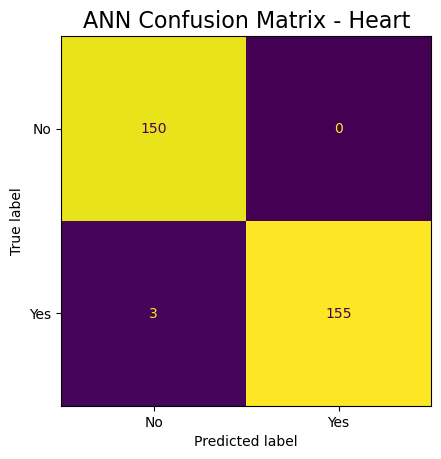

In [685]:
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart,y_train_heart, X_test_heart, y_test_heart, 'Heart', 'ANN')

Fitting Time: 19.11998224258423
Scoring Time: 0.008958101272583008
F1 Score - Heart - PCA - ANN: 0.8932038834951456
              precision    recall  f1-score   support

          No       0.87      0.91      0.89       150
         Yes       0.91      0.87      0.89       158

    accuracy                           0.89       308
   macro avg       0.89      0.89      0.89       308
weighted avg       0.89      0.89      0.89       308



C:\Users\UGGTech\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


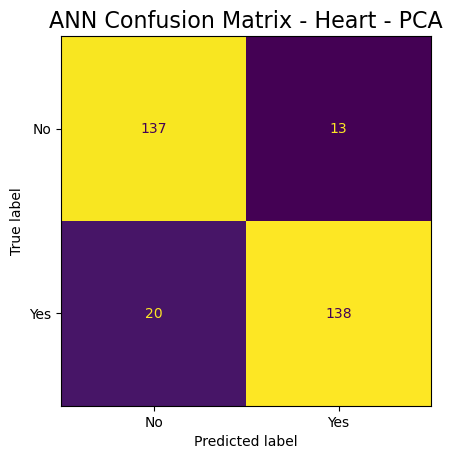

In [684]:
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart_pca,y_train_heart_pca, X_test_heart_pca, y_test_heart_pca, 'Heart - PCA', 'ANN')

Fitting Time: 11.3514404296875
Scoring Time: 0.007964611053466797
F1 Score - Heart - ICA - ANN: 0.9810126582278481
              precision    recall  f1-score   support

          No       0.98      0.98      0.98       150
         Yes       0.98      0.98      0.98       158

    accuracy                           0.98       308
   macro avg       0.98      0.98      0.98       308
weighted avg       0.98      0.98      0.98       308



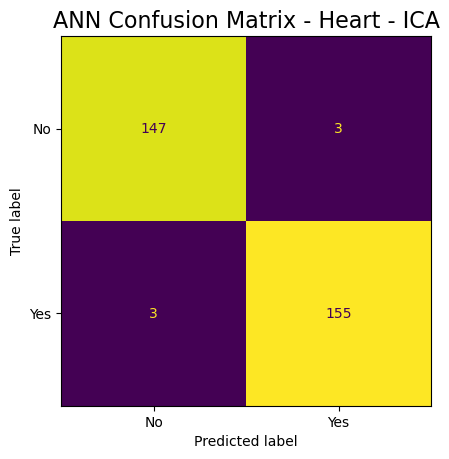

In [683]:
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart_ica,y_train_heart_ica, X_test_heart_ica, y_test_heart_ica, 'Heart - ICA', 'ANN')

Fitting Time: 7.227540969848633
Scoring Time: 0.008969306945800781
F1 Score - Heart - RP - ANN: 0.9274447949526813
              precision    recall  f1-score   support

          No       0.93      0.92      0.92       150
         Yes       0.92      0.93      0.93       158

    accuracy                           0.93       308
   macro avg       0.93      0.93      0.93       308
weighted avg       0.93      0.93      0.93       308



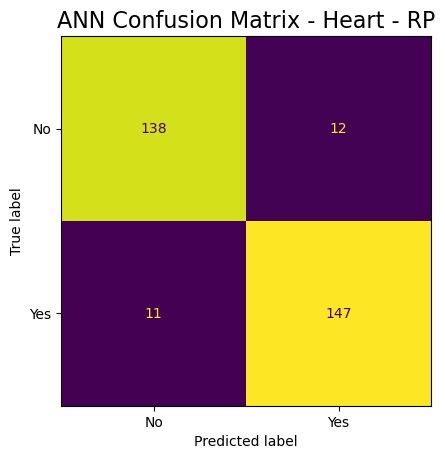

In [682]:
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart_rca,y_train_heart_rca, X_test_heart_rca, y_test_heart_rca, 'Heart - RP', 'ANN')

Fitting Time: 9.405548095703125
Scoring Time: 0.011960029602050781
F1 Score - Heart - RF - ANN: 0.9404388714733543
              precision    recall  f1-score   support

          No       0.95      0.93      0.94       150
         Yes       0.93      0.95      0.94       158

    accuracy                           0.94       308
   macro avg       0.94      0.94      0.94       308
weighted avg       0.94      0.94      0.94       308



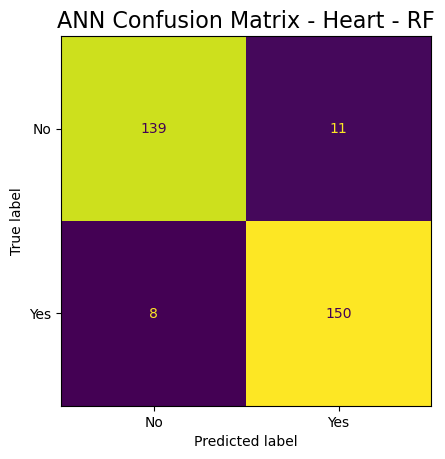

In [681]:
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=42, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart_rf,y_train_heart_rf, X_test_heart_rf, y_test_heart_rf, 'Heart - RF', 'ANN')

### Augmentation

In [808]:
clust_full = pd.DataFrame(heart_X_reduced_encoded)
clust_full['KM Cluster'] = km_labels
clust_full['EM Cluster'] = gmm_heart_labels
clust_full

,age,trestbps,chol,restecg,thalach,oldpeak,slope,ca,sex_female,sex_male,...,fbs_false,fbs_true,exang_no,exang_yes,thal_type_0,thal_type_1,thal_type_2,thal_type_3,KM Cluster,EM Cluster
0,52,125,212,1,168,1.0,2,2,0,1,...,1,0,1,0,0,0,0,1,24,4
1,53,140,203,0,155,3.1,0,0,0,1,...,0,1,0,1,0,0,0,1,1,3
2,70,145,174,1,125,2.6,0,0,0,1,...,1,0,0,1,0,0,0,1,19,1
3,61,148,203,1,161,0.0,2,1,0,1,...,1,0,1,0,0,0,0,1,1,4
4,62,138,294,1,106,1.9,1,3,1,0,...,0,1,1,0,0,0,1,0,12,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,59,140,221,1,164,0.0,2,0,0,1,...,1,0,0,1,0,0,1,0,2,8
1021,60,125,258,0,141,2.8,1,1,0,1,...,1,0,0,1,0,0,0,1,10,1
1022,47,110,275,0,118,1.0,1,1,0,1,...,1,0,0,1,0,0,1,0,31,10
1023,50,110,254,0,159,0.0,2,0,1,0,...,1,0,1,0,0,0,1,0,14,9


In [809]:
X_train_heart_aug, X_test_heart_aug, y_train_heart_aug, y_test_heart_aug = train_test_split(clust_full, heart_y,
                                                    test_size = 0.3, random_state = 42, stratify = heart_y
                                                   )

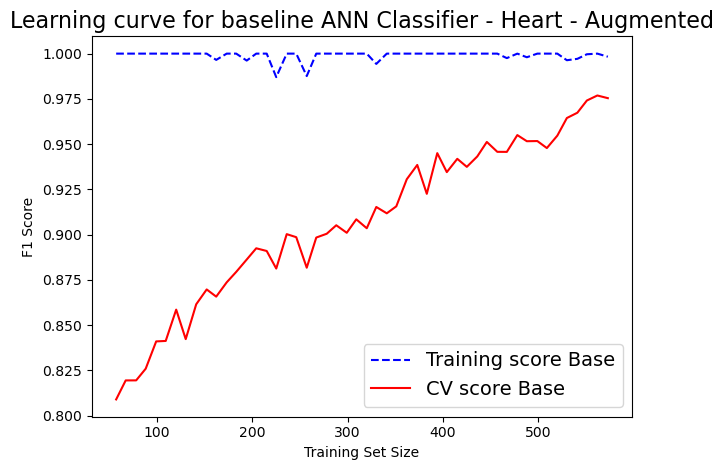

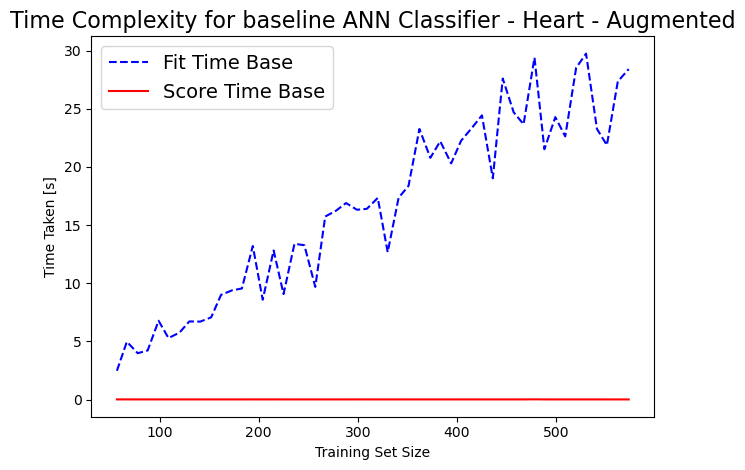

Wall time: 8min 47s


In [810]:
%%time
# For the rf
fit_sizes, train_ann_heart_aug, val_ann_heart_aug, fit_ann_heart_aug, score_ann_heart_aug = ann_baseline_pipeline(X_train_heart_aug,y_train_heart_aug,5, 'Heart - Augmented',32)


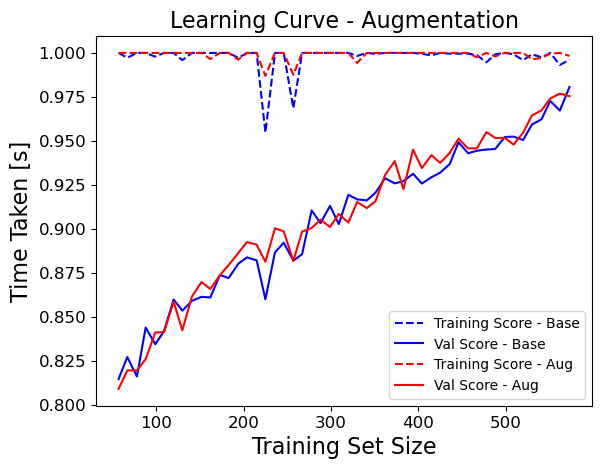

In [822]:
plt.rcParams.update({'font.size': 10})
x_learning = np.linspace(1, len(X_train_heart), num=50).astype(int)

plt.plot(fit_sizes,train_ann_heart_base,'--', color="b", label='Training Score - Base')
plt.plot(fit_sizes,val_ann_heart_base, color="b", label='Val Score - Base')

plt.plot(fit_sizes,train_ann_heart_aug,'--', color="red", label='Training Score - Aug')
plt.plot(fit_sizes,val_ann_heart_aug, color="red", label='Val Score - Aug')

plt.xlabel('Training Set Size', fontsize=16)
plt.ylabel('Time Taken [s]', fontsize=16)
plt.title('Learning Curve - Augmentation', fontsize=16)
plt.legend()
# plt.legend(bbox_to_anchor=(1, 1))
plt.tick_params(axis='both', which='major', labelsize=12)


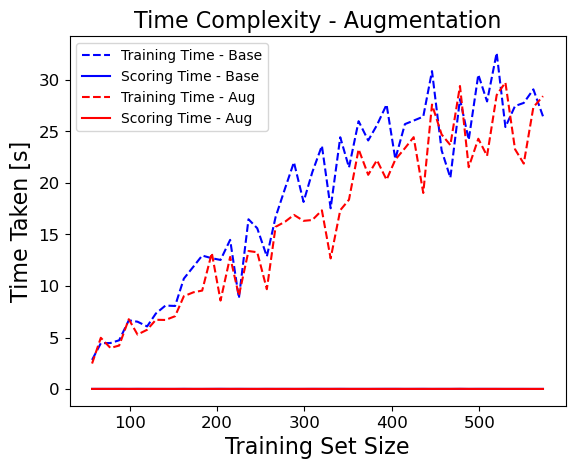

In [818]:
plt.rcParams.update({'font.size': 10})
x_learning = np.linspace(1, len(X_train_heart), num=50).astype(int)

plt.plot(fit_sizes,fit_ann_heart_base,'--', color="b", label='Training Time - Base')
plt.plot(fit_sizes,score_ann_heart_base, color="b", label='Scoring Time - Base')

plt.plot(fit_sizes,fit_ann_heart_aug,'--', color="red", label='Training Time - Aug')
plt.plot(fit_sizes,score_ann_heart_aug, color="red", label='Scoring Time - Aug')

plt.xlabel('Training Set Size', fontsize=16)
plt.ylabel('Time Taken [s]', fontsize=16)
plt.title('Time Complexity - Augmentation', fontsize=16)
plt.legend()
#plt.legend(bbox_to_anchor=(1, 1))
plt.tick_params(axis='both', which='major', labelsize=12)


Fitting Time: 12.898643970489502
Scoring Time: 0.009974479675292969
F1 Score - Heart - Augmentation - ANN: 0.9904153354632589
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       150
         Yes       1.00      0.98      0.99       158

    accuracy                           0.99       308
   macro avg       0.99      0.99      0.99       308
weighted avg       0.99      0.99      0.99       308



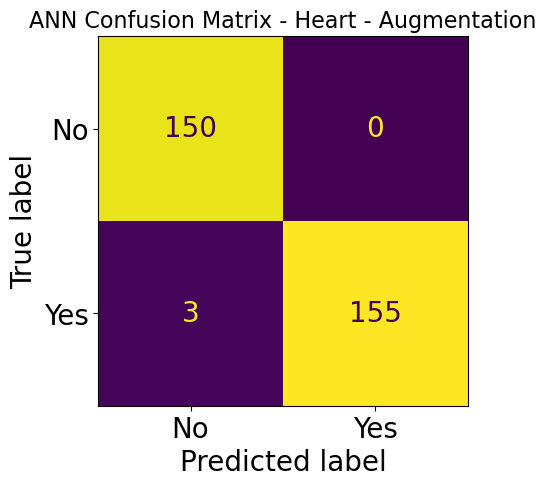

In [821]:
plt.rcParams.update({'font.size': 20})
pipeline = Pipeline([   
    ('Scale',MinMaxScaler()), 
    ('ANN',MLPClassifier(random_state=5, batch_size = 32,activation ='relu', alpha =0.001, hidden_layer_sizes=(250,250)))
])

scoring_matrix(pipeline,X_train_heart_aug,y_train_heart_aug, X_test_heart_aug, y_test_heart_aug, 'Heart - Augmentation', 'ANN')